# 03. TPE Force Vector Solver

**Pipeline step 3 of 3** — uses a ResNet regression model to make initial force/angle guesses at each contact, then refines them by minimising the difference between the synthetic photoelastic image and the experimental image subject to force/torque equilibrium constraints.

## Inputs
- Trajectory `.pkl` from Step 1
- Contact bond `.pkl` from Step 2
- Pre-trained ResNet18 weights (`models/Contact_Force_ResNet_*.pth`)
- Photoelastic images (`bw_*.png`)

## Outputs
- `PREDICTION_<EXP_NAME>.pkl` — ResNet initial guesses (force, angle) per contact
- `FORCE_FITTED_TEMP_<EXP_NAME>.csv` — fitted (force, alpha) per contact, appended frame-by-frame
- `<EXP_NAME>_Force_ResNet.pkl` — final corrected and symmetric force dataset

## Workflow
1. Crop contact ROIs and run ResNet → initial (force, angle) guesses
2. For each particle: optimise (force, alpha) to match the photoelastic image
3. Validate reciprocity (ij vs ji), symmetrise using the better-fitting side
4. Save

### Imports

In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import os
import sys
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import torch
from torchvision import transforms
import concurrent.futures as cf
import time

# Go up one directory level from Notebooks/ to find src/
sys.path.insert(0, os.path.abspath(os.path.join(os.getcwd(), '..')))
import src


TorchScript enabled for StressSolve_residue_torch.


### Parameters — edit here before running

In [2]:
EXP_NAME  = 'TPE_20260807A01_N=262x2_stop_go_1e-3rpsx200s_stop1000s_1000framesx1fps_20reps'

IMG_DIR  = os.path.join(r'N:\PROJ_TPE', EXP_NAME)
TRAJ_DIR = r'M:\Archive\Proj_TPE\Disk_traj_files'
BOND_DIR = r'M:\Archive\Proj_TPE\Contact_bond_files'
OUT_DIR  = r'M:\Archive\Proj_TPE\Force Inversion'

# Derived paths
traj_filename = os.path.join(TRAJ_DIR, f'{EXP_NAME}.pkl')
bond_filename = os.path.join(BOND_DIR,  f'CONTACT_BOND_{EXP_NAME}.pkl')

F_bond = pd.read_pickle(bond_filename)
F_traj = pd.read_pickle(traj_filename)

# Load force prediction model
DEVICE     = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = os.path.join(r"O:\LJJ202107\LJJ Jupyter Notebook Collection\TPE_Disk_Image_Processing\models\Contact_Force_ResNet_20260130.pth")
model      = src.get_model(DEVICE)
model.load_state_dict(torch.load(model_path, map_location=DEVICE, weights_only=True))
model.eval()

print(f"Model loaded: {model_path}")
print(f"Running on:   {DEVICE}")

Model loaded: O:\LJJ202107\LJJ Jupyter Notebook Collection\TPE_Disk_Image_Processing\models\Contact_Force_ResNet_20260130.pth
Running on:   cuda


### Make initial guess for forces and angles

First crop and append all ROIs, append to list.
Then make initial guess in batches, append back to F_bond (~ 30 min)

In [ ]:
# Define transforms (same as training)
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

data_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=3),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD)
])

ROI_BATCH_SIZE = 256      # CPU-side ROI accumulation batch
INFER_BATCH_SIZE = 64     # GPU/CPU inference mini-batch

model.eval()

############### Initialize output frame ###############
F_bond_pred = F_bond.copy()
F_bond_pred['force_pred'] = np.nan
F_bond_pred['angle_pred'] = np.nan

total_contacts = len(F_bond_pred)
print(f"Starting streaming ROI extraction (roi_batch={ROI_BATCH_SIZE})", flush=True)
print(f"Inference mini-batch={INFER_BATCH_SIZE} on device={DEVICE}", flush=True)
print(f"Total contacts to predict: {total_contacts}", flush=True)

############################# STREAMED MODEL PREDICTION ###############################
processed_contacts = 0
chunk_id = 0

with torch.no_grad():
    for chunk_images, chunk_meta, total_seen in src.iter_contact_roi_batches(
        F_bond, IMG_DIR, batch_size=ROI_BATCH_SIZE
    ):
        chunk_id += 1

        for start in range(0, len(chunk_images), INFER_BATCH_SIZE):
            end = min(start + INFER_BATCH_SIZE, len(chunk_images))
            batch_imgs = [data_transform(src.to_pil_uint8(im)) for im in chunk_images[start:end]]
            batch_tensor = torch.stack(batch_imgs).to(DEVICE)
            batch_predictions = model(batch_tensor).cpu().numpy()

            idxs = [m['idx'] for m in chunk_meta[start:end]]
            F_bond_pred.loc[idxs, 'force_pred'] = batch_predictions[:, 0]
            F_bond_pred.loc[idxs, 'angle_pred'] = batch_predictions[:, 1]

            del batch_tensor, batch_imgs, batch_predictions
            if torch.cuda.is_available():
                torch.cuda.empty_cache()

        del chunk_images, chunk_meta


Cropping contact ROIs — frame: 4000/4000


In [4]:
# Write F_bond_pred to pickle
output_path = os.path.join(OUT_DIR, f'PREDICTION_{EXP_NAME}.pkl')
F_bond_pred.to_pickle(output_path)

### Fitting configuration

Setting knobs for fitting are shown first for convenience. Most don't require tuning and can be left as is.

Turn on 'plot_every' to visualise the fitting process for each particle

In [3]:
fsigma = 225 #photoelastic constant
plot_every = 1  # Plotting is only supported in sequential mode (GPU_PARALLEL_WORKERS == 1)
verbose = 1

# GPU parallelism knob: number of particles to fit concurrently per frame
GPU_PARALLEL_WORKERS = 1

############## FITTING HYPERPARAMS, TUNE WITH CARE ##############
tol=1e-3
patience=10
lr=4e-2
n_iter=1000
############## DEVICE CHECK ##############

if DEVICE.type != 'cuda':
    raise RuntimeError('This cell is configured for GPU-only fitting. Set DEVICE to cuda before running.')
if GPU_PARALLEL_WORKERS > 1 and plot_every:
    print('plot_every is disabled when GPU_PARALLEL_WORKERS > 1 to avoid threaded matplotlib issues.')

# Keep fit args in one place so submit/retry paths stay compact
fit_kwargs = dict(
    device=DEVICE,
    lr=lr,
    n_iter=n_iter,
    tol=tol,
    patience=patience,
    verbose=verbose,
 )

def run_fit(pid, pdata, img, do_plot=False):
    return src.fit_one_particle_gpu(
        pid, pdata, img, fsigma,
        do_plot=do_plot,
        **fit_kwargs,
    )


### Starts fitting 

Processing frame: 1Particle id: 0, Contact number z=4
Initial forces: [0.49538863 0.41693408 0.3044667  0.3139599 ]
Initial alphas: [-0.10195278  0.00272026 -0.07615634 -0.06556381]
Iter 0: loss=0.1301  image=0.0668  torque=0.0481  force=0.0151
Iter 10: loss=0.0723  image=0.0611  torque=0.0084  force=0.0029
Iter 20: loss=0.0612  image=0.0602  torque=0.0005  force=0.0005


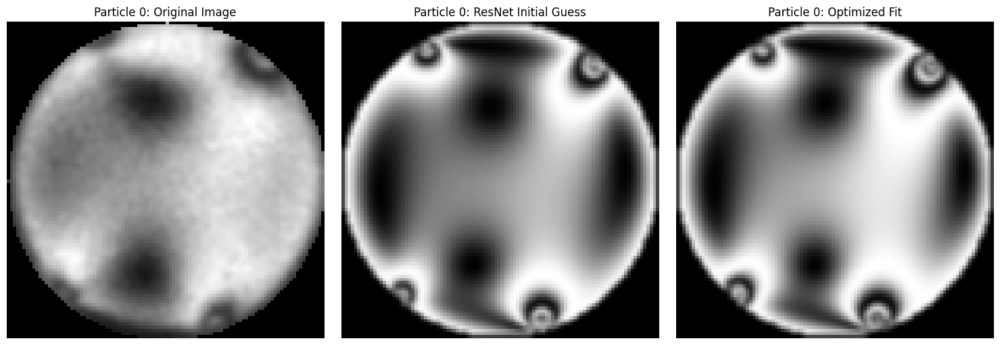

Particle id: 2, Contact number z=3
Initial forces: [0.55559406 1.05690637 0.74798648]
Initial alphas: [ 0.0694163  -0.05716391 -0.25878218]
Iter 0: loss=0.2484  image=0.0619  torque=0.1637  force=0.0228
Iter 10: loss=0.0659  image=0.0597  torque=0.0010  force=0.0052
Iter 20: loss=0.0561  image=0.0461  torque=0.0069  force=0.0032
Iter 30: loss=0.0473  image=0.0445  torque=0.0006  force=0.0022
Iter 40: loss=0.0433  image=0.0432  torque=0.0000  force=0.0001


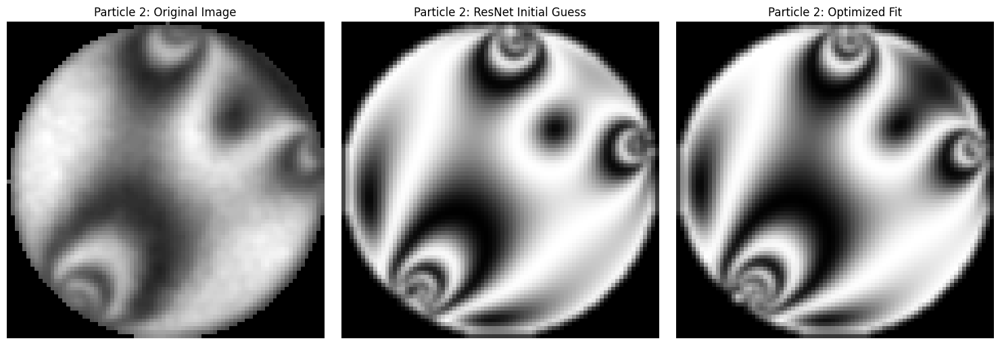

Particle id: 3, Contact number z=5
Initial forces: [0.23421979 0.29216959 0.41006384 0.32059822 0.2321546 ]
Initial alphas: [ 0.01514423 -0.07795655 -0.00383536 -0.05887395 -0.04443828]
Iter 0: loss=0.1068  image=0.0779  torque=0.0090  force=0.0199
Iter 10: loss=0.0676  image=0.0643  torque=0.0002  force=0.0031
Iter 20: loss=0.0608  image=0.0583  torque=0.0001  force=0.0024
Iter 30: loss=0.0431  image=0.0425  torque=0.0000  force=0.0006
Iter 40: loss=0.0422  image=0.0422  torque=0.0000  force=0.0001


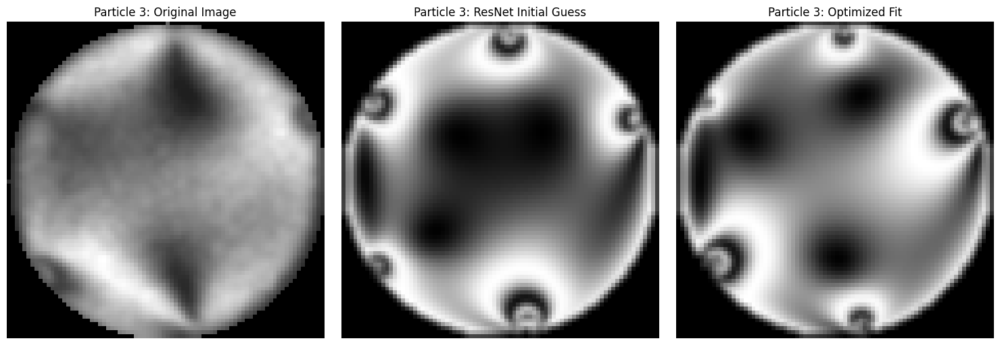

Particle id: 4, Contact number z=2
Initial forces: [0.15325913 0.21206267]
Initial alphas: [-0.05052131 -0.0492342 ]
Iter 0: loss=0.1138  image=0.1090  torque=0.0012  force=0.0036
Iter 10: loss=0.0578  image=0.0550  torque=0.0003  force=0.0025


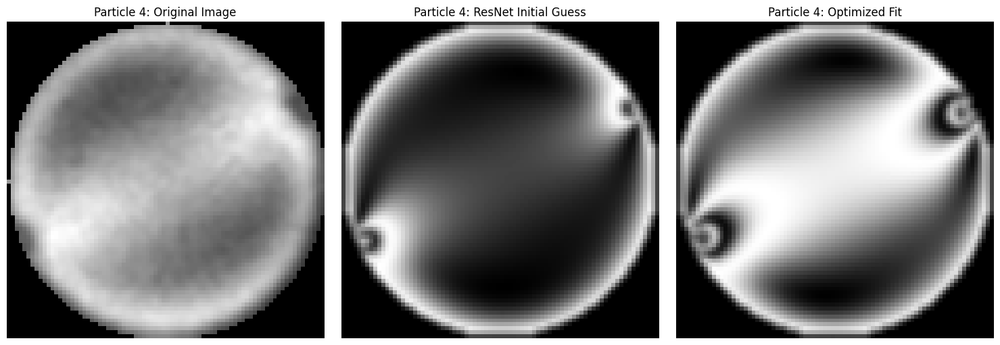

Particle id: 5, Contact number z=3
Initial forces: [0.52278707 0.87320309 0.99733937]
Initial alphas: [-0.05448404 -0.05476631 -0.00013474]
Iter 0: loss=0.1802  image=0.0675  torque=0.0210  force=0.0917
Iter 10: loss=0.0774  image=0.0642  torque=0.0015  force=0.0117
Iter 20: loss=0.0709  image=0.0657  torque=0.0013  force=0.0039
Iter 30: loss=0.0663  image=0.0635  torque=0.0000  force=0.0028


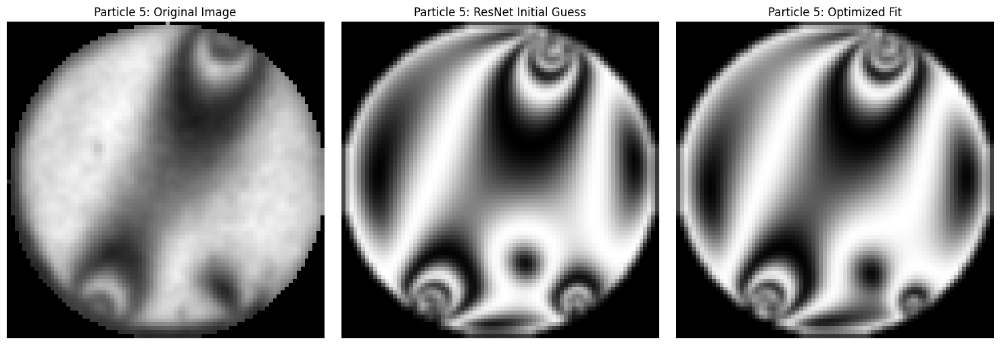

Particle id: 7, Contact number z=3
Initial forces: [0.35215037 0.28722661 0.15732422]
Initial alphas: [-0.02041348 -0.04171678  0.08268256]
Iter 0: loss=0.1240  image=0.0929  torque=0.0001  force=0.0310
Iter 10: loss=0.0512  image=0.0485  torque=0.0006  force=0.0021


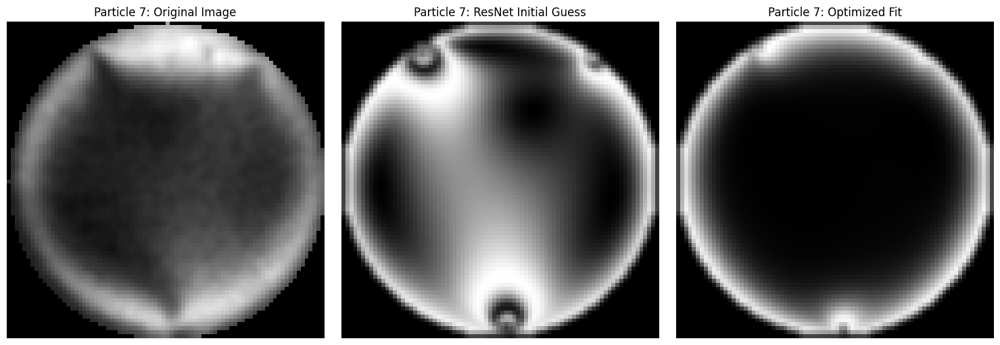

Particle id: 12, Contact number z=2
Initial forces: [0.81364403 0.69882567]
Initial alphas: [0.02954253 0.04253684]
Iter 0: loss=0.1124  image=0.0632  torque=0.0104  force=0.0388
Iter 10: loss=0.0635  image=0.0575  torque=0.0001  force=0.0059
Iter 20: loss=0.0532  image=0.0521  torque=0.0000  force=0.0010


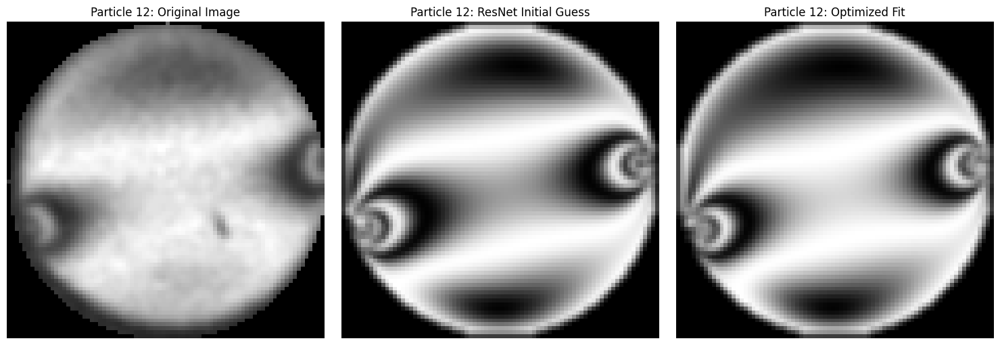

Particle id: 15, Contact number z=4
Initial forces: [0.92388268 0.33012357 0.90076597 0.23048476]
Initial alphas: [-0.06343704  0.06178841 -0.14398286  0.01824748]
Iter 0: loss=0.1856  image=0.0702  torque=0.0959  force=0.0195
Iter 10: loss=0.0742  image=0.0628  torque=0.0080  force=0.0035
Iter 20: loss=0.0654  image=0.0593  torque=0.0043  force=0.0018
Iter 30: loss=0.0578  image=0.0569  torque=0.0003  force=0.0006


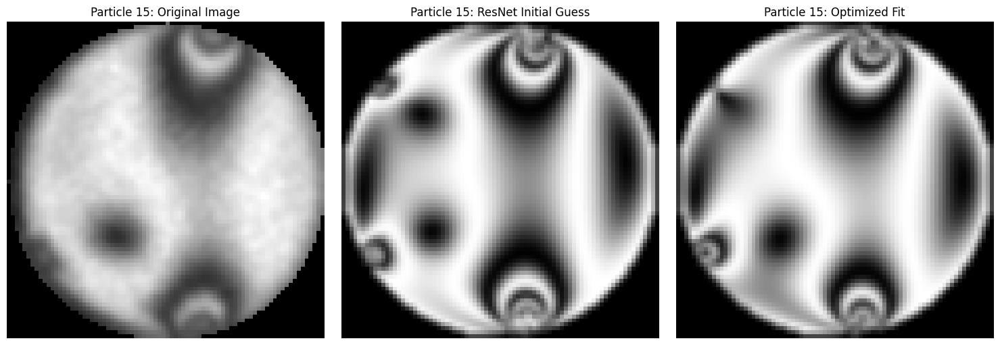

Particle id: 16, Contact number z=3
Initial forces: [0.67181969 0.49235523 0.32108195]
Initial alphas: [-0.13240691  0.06965902  0.05005695]
Iter 0: loss=0.1281  image=0.0579  torque=0.0053  force=0.0649
Iter 10: loss=0.0463  image=0.0448  torque=0.0000  force=0.0015
Iter 20: loss=0.0451  image=0.0450  torque=0.0000  force=0.0000


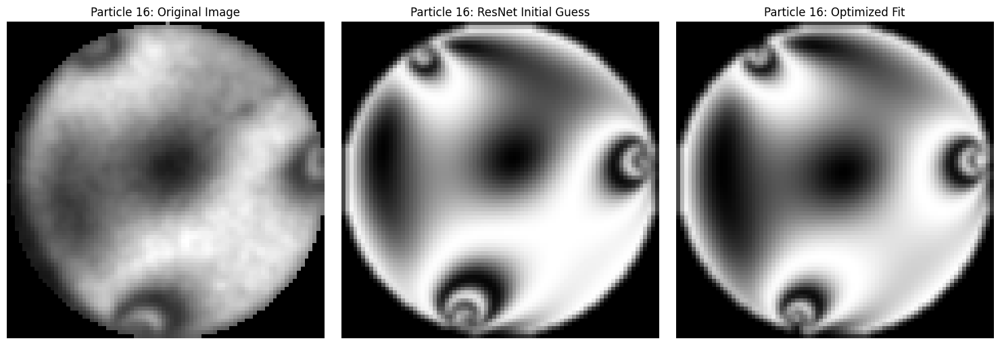

Particle id: 17, Contact number z=2
Initial forces: [0.4775804 0.3956117]
Initial alphas: [ 0.05523582 -0.01255864]
Iter 0: loss=0.0892  image=0.0609  torque=0.0016  force=0.0267
Iter 10: loss=0.0609  image=0.0556  torque=0.0019  force=0.0034
Iter 20: loss=0.0567  image=0.0550  torque=0.0000  force=0.0017


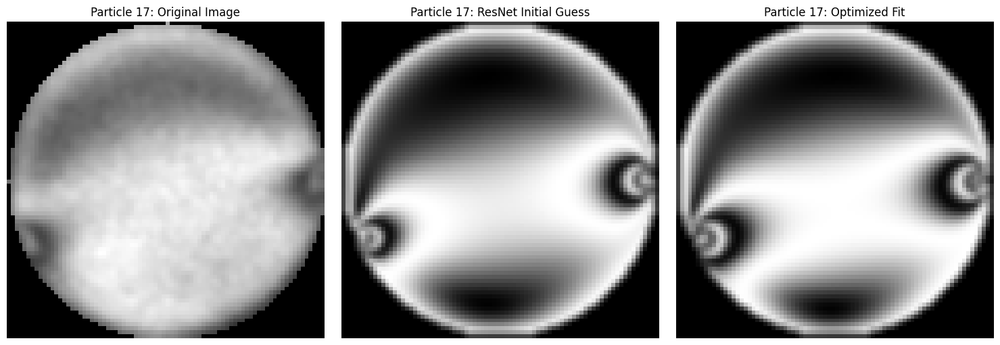

Particle id: 19, Contact number z=3
Initial forces: [0.53236456 0.33362256 0.36313491]
Initial alphas: [-0.01851315 -0.0248687   0.02343434]
Iter 0: loss=0.2814  image=0.0450  torque=0.0003  force=0.2360
Iter 10: loss=0.0724  image=0.0465  torque=0.0029  force=0.0231
Iter 20: loss=0.0473  image=0.0452  torque=0.0013  force=0.0008


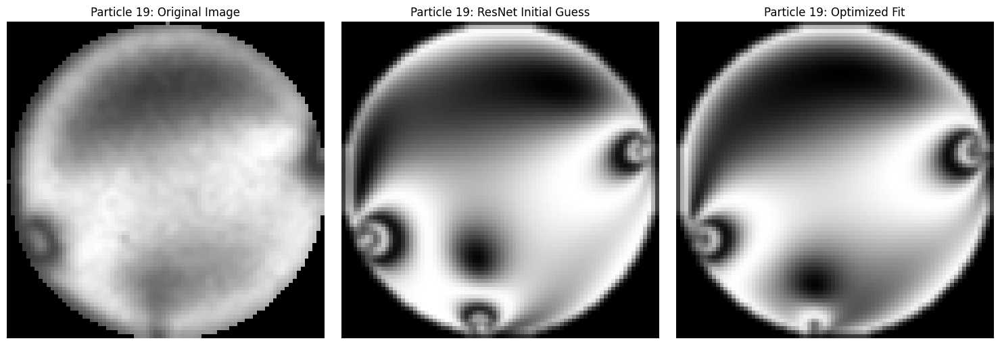

Particle id: 20, Contact number z=4
Initial forces: [0.68094978 0.30381825 0.35160677 1.04383879]
Initial alphas: [-0.1838524   0.05677062  0.10815529 -0.03236144]
Iter 0: loss=0.3211  image=0.0539  torque=0.0382  force=0.2290
Iter 10: loss=0.0746  image=0.0609  torque=0.0007  force=0.0130
Iter 20: loss=0.0606  image=0.0528  torque=0.0000  force=0.0078
Iter 30: loss=0.0556  image=0.0536  torque=0.0000  force=0.0021
Iter 40: loss=0.0537  image=0.0519  torque=0.0000  force=0.0018


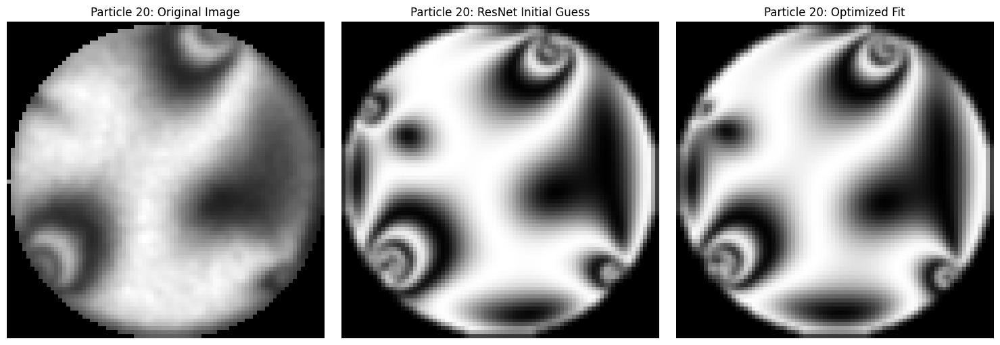

Particle id: 21, Contact number z=3
Initial forces: [0.50645142 0.36430371 0.48343663]
Initial alphas: [ 0.00496105 -0.01669473 -0.0440298 ]
Iter 0: loss=0.3121  image=0.0550  torque=0.0022  force=0.2549
Iter 10: loss=0.0676  image=0.0479  torque=0.0002  force=0.0195
Iter 20: loss=0.0563  image=0.0520  torque=0.0003  force=0.0040
Iter 30: loss=0.0474  image=0.0448  torque=0.0000  force=0.0026


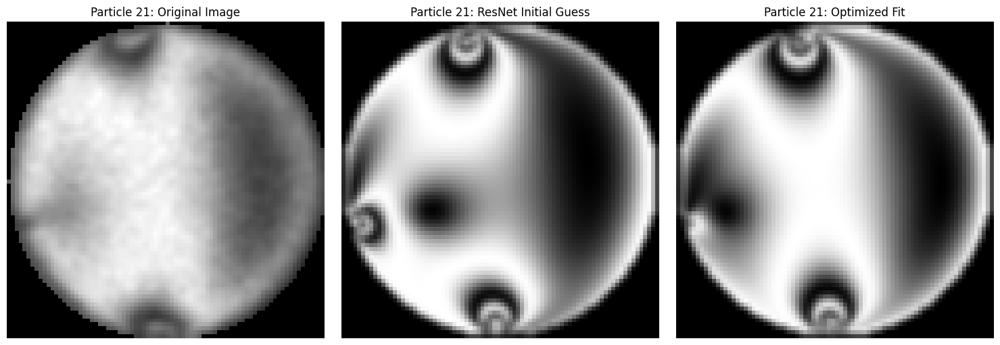

Particle id: 22, Contact number z=2
Initial forces: [0.28361272 0.27314082]
Initial alphas: [-0.00559791  0.01616111]
Iter 0: loss=0.1139  image=0.0876  torque=0.0000  force=0.0263
Iter 10: loss=0.0582  image=0.0582  torque=0.0000  force=0.0000


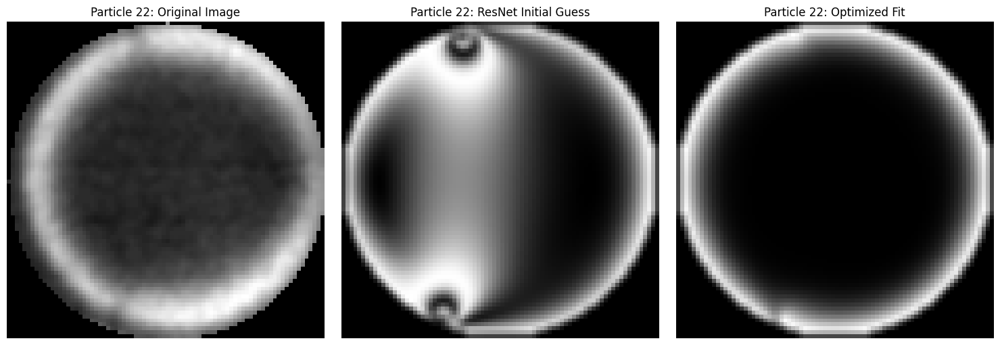

Particle id: 23, Contact number z=3
Initial forces: [0.45115457 0.63349085 0.87177629]
Initial alphas: [ 0.1137765  -0.09440803 -0.26747167]
Iter 0: loss=0.3928  image=0.0528  torque=0.2055  force=0.1346
Iter 10: loss=0.0549  image=0.0491  torque=0.0013  force=0.0045
Iter 20: loss=0.0639  image=0.0530  torque=0.0020  force=0.0089
Iter 30: loss=0.0505  image=0.0500  torque=0.0004  force=0.0001
Iter 40: loss=0.0491  image=0.0482  torque=0.0000  force=0.0009


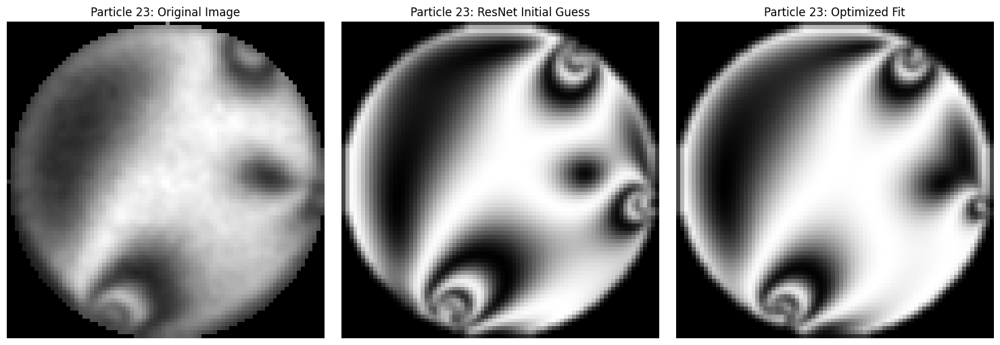

Particle id: 29, Contact number z=2
Initial forces: [0.19889005 0.37498341]
Initial alphas: [-0.10404915  0.12600479]
Iter 0: loss=0.1267  image=0.0634  torque=0.0025  force=0.0608
Iter 10: loss=0.0535  image=0.0532  torque=0.0002  force=0.0001
Iter 20: loss=0.0477  image=0.0436  torque=0.0002  force=0.0039


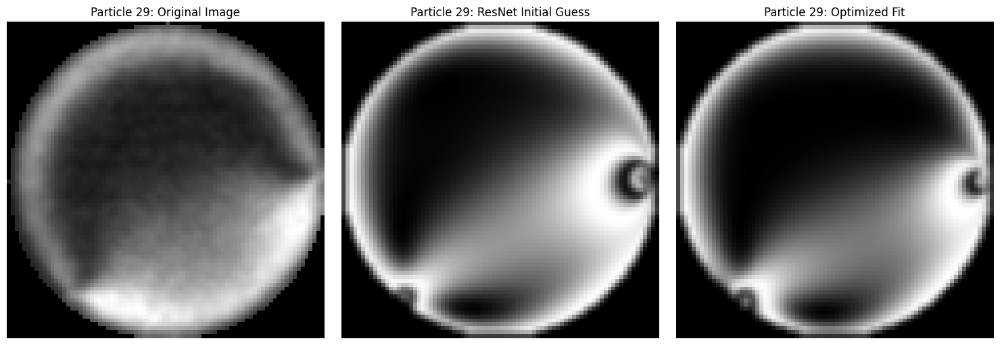

Particle id: 30, Contact number z=3
Initial forces: [0.59388242 0.38656147 0.37769923]
Initial alphas: [-0.04476256  0.18994889 -0.08239219]
Iter 0: loss=0.4104  image=0.0565  torque=0.0008  force=0.3530
Iter 10: loss=0.0637  image=0.0525  torque=0.0000  force=0.0112
Iter 20: loss=0.0626  image=0.0523  torque=0.0001  force=0.0101
Iter 30: loss=0.0567  image=0.0525  torque=0.0000  force=0.0042


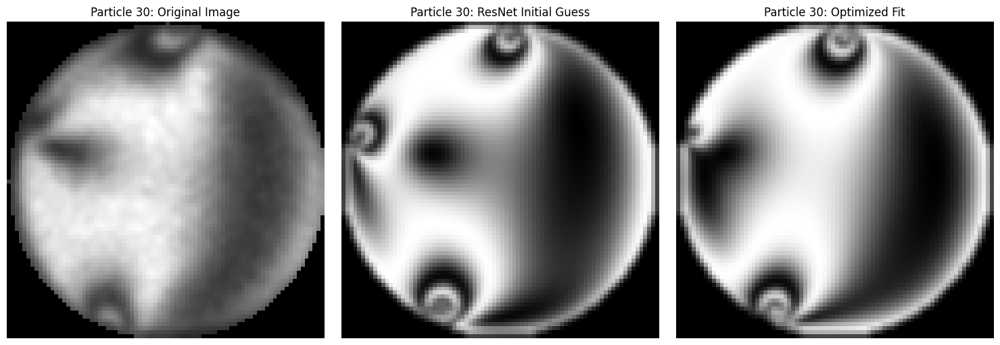

Particle id: 31, Contact number z=3
Initial forces: [0.28829116 0.23151889 0.24445127]
Initial alphas: [-0.12342943  0.01457877  0.11489852]
Iter 0: loss=0.0943  image=0.0494  torque=0.0001  force=0.0449
Iter 10: loss=0.0462  image=0.0419  torque=0.0002  force=0.0041
Iter 20: loss=0.0401  image=0.0399  torque=0.0001  force=0.0002
Iter 30: loss=0.0353  image=0.0342  torque=0.0005  force=0.0006


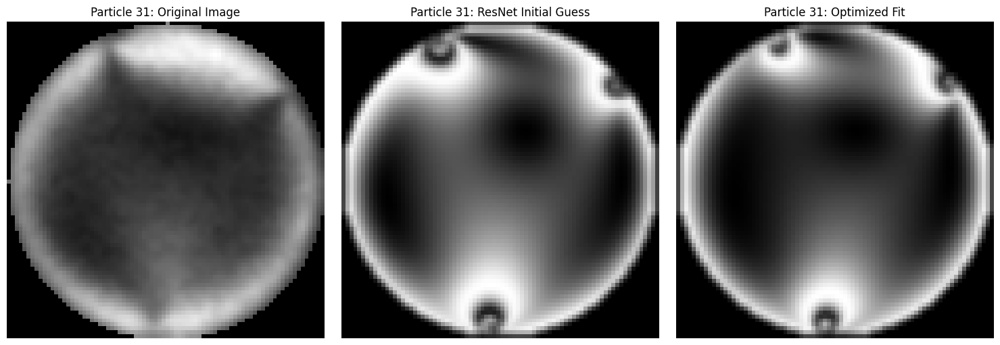

Particle id: 32, Contact number z=2
Initial forces: [0.42512333 0.6532023 ]
Initial alphas: [-0.05271919 -0.03689458]
Iter 0: loss=0.1138  image=0.0538  torque=0.0078  force=0.0522
Iter 10: loss=0.0591  image=0.0571  torque=0.0002  force=0.0017
Iter 20: loss=0.0574  image=0.0560  torque=0.0004  force=0.0010
Iter 30: loss=0.0567  image=0.0566  torque=0.0001  force=0.0000


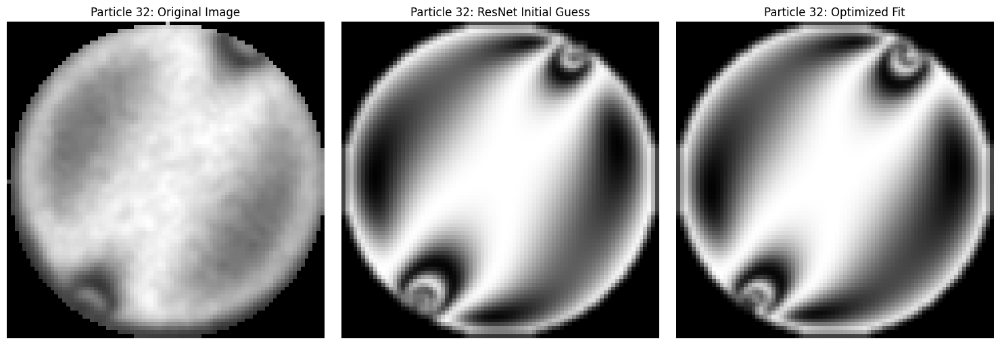

Particle id: 33, Contact number z=2
Initial forces: [0.28287442 0.23711221]
Initial alphas: [-0.01326435 -0.05072016]
Iter 0: loss=0.0917  image=0.0575  torque=0.0009  force=0.0334
Iter 10: loss=0.0532  image=0.0528  torque=0.0004  force=0.0001
Iter 20: loss=0.0535  image=0.0512  torque=0.0001  force=0.0022


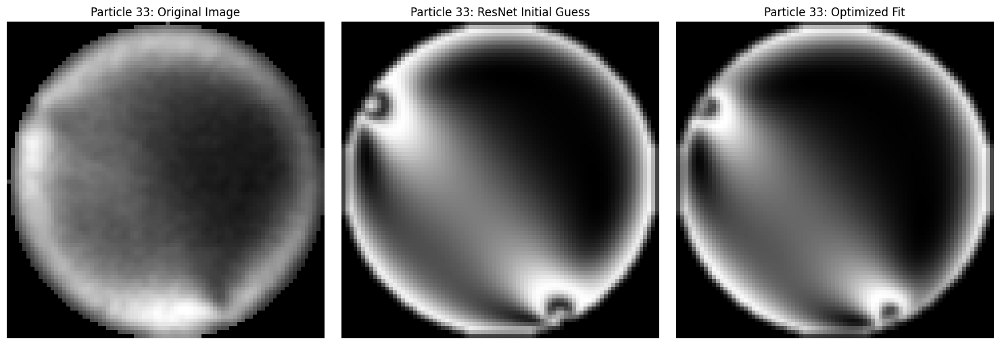

Particle id: 34, Contact number z=3
Initial forces: [0.88143489 0.7892669  0.41718678]
Initial alphas: [-0.00790109 -0.0395577   0.06692994]
Iter 0: loss=0.0789  image=0.0520  torque=0.0004  force=0.0265
Iter 10: loss=0.0538  image=0.0495  torque=0.0002  force=0.0041
Iter 20: loss=0.0495  image=0.0489  torque=0.0002  force=0.0004


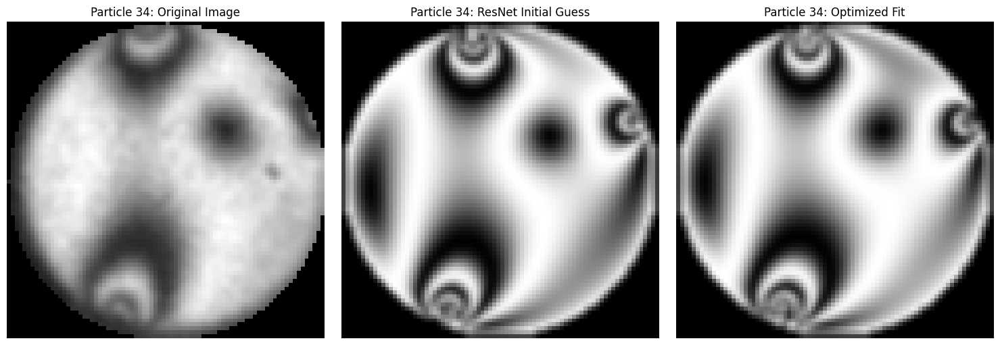

Particle id: 35, Contact number z=3
Initial forces: [0.19764935 0.33203409 0.17836865]
Initial alphas: [ 0.02142534 -0.03597547 -0.04629754]
Iter 0: loss=0.1650  image=0.0778  torque=0.0009  force=0.0863
Iter 10: loss=0.0571  image=0.0442  torque=0.0032  force=0.0096
Iter 20: loss=0.0469  image=0.0408  torque=0.0001  force=0.0060
Iter 30: loss=0.0423  image=0.0402  torque=0.0001  force=0.0020


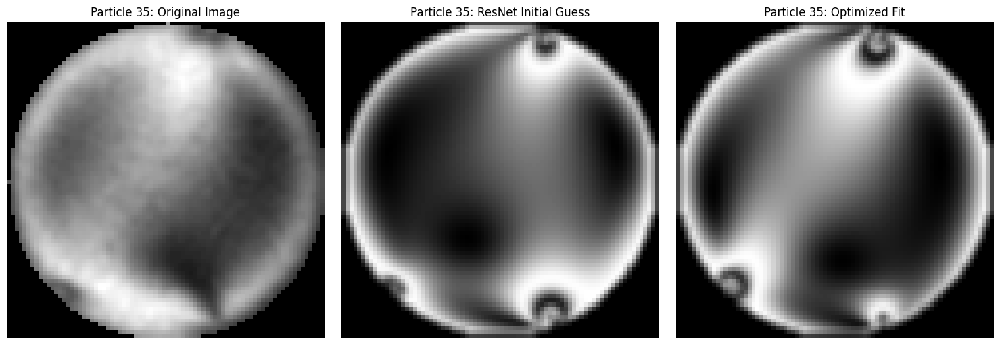

Particle id: 36, Contact number z=3
Initial forces: [0.49185247 0.20354424 0.58812926]
Initial alphas: [-0.08354292 -0.10480613 -0.18386625]
Iter 0: loss=0.2834  image=0.0588  torque=0.1039  force=0.1208
Iter 10: loss=0.0772  image=0.0695  torque=0.0019  force=0.0057
Iter 20: loss=0.0689  image=0.0617  torque=0.0000  force=0.0072
Iter 30: loss=0.0592  image=0.0577  torque=0.0001  force=0.0014


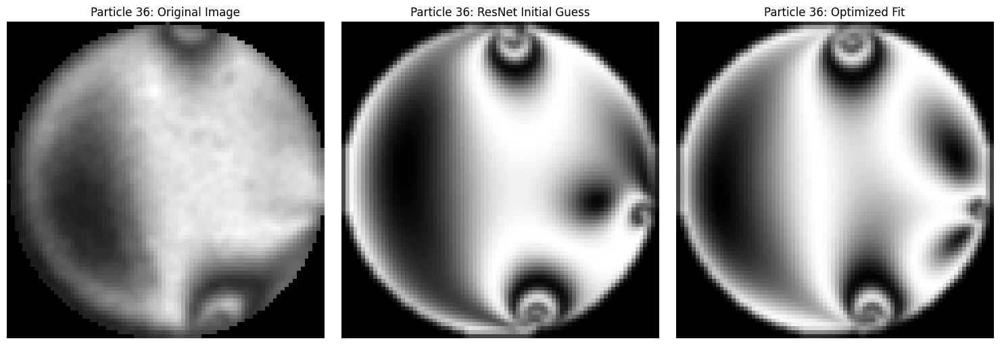

Particle id: 39, Contact number z=3
Initial forces: [0.31670458 0.28388275 0.3104992 ]
Initial alphas: [0.14184715 0.13821536 0.01895192]
Iter 0: loss=0.1645  image=0.0922  torque=0.0290  force=0.0433
Iter 10: loss=0.0673  image=0.0667  torque=0.0001  force=0.0005
Iter 20: loss=0.0654  image=0.0625  torque=0.0012  force=0.0017
Iter 30: loss=0.0621  image=0.0611  torque=0.0002  force=0.0009


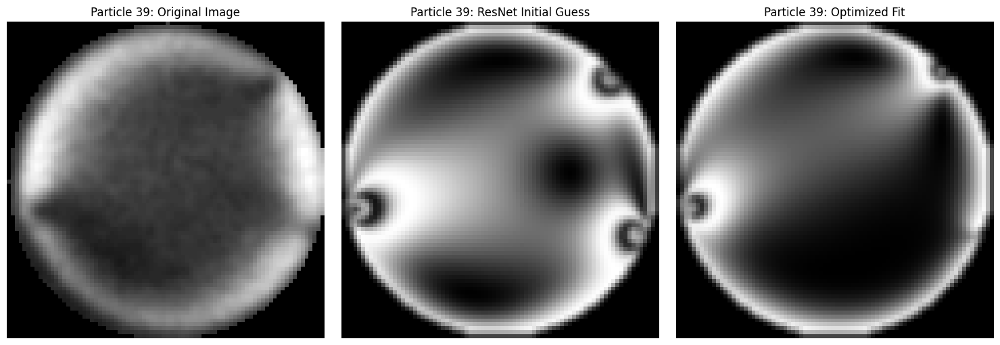

Particle id: 40, Contact number z=3
Initial forces: [0.33233206 0.3873608  0.50237911]
Initial alphas: [-0.10317978  0.0432099   0.16585466]
Iter 0: loss=0.1014  image=0.0762  torque=0.0154  force=0.0098
Iter 10: loss=0.0669  image=0.0636  torque=0.0017  force=0.0017
Iter 20: loss=0.0589  image=0.0585  torque=0.0001  force=0.0004
Iter 30: loss=0.0574  image=0.0567  torque=0.0005  force=0.0002


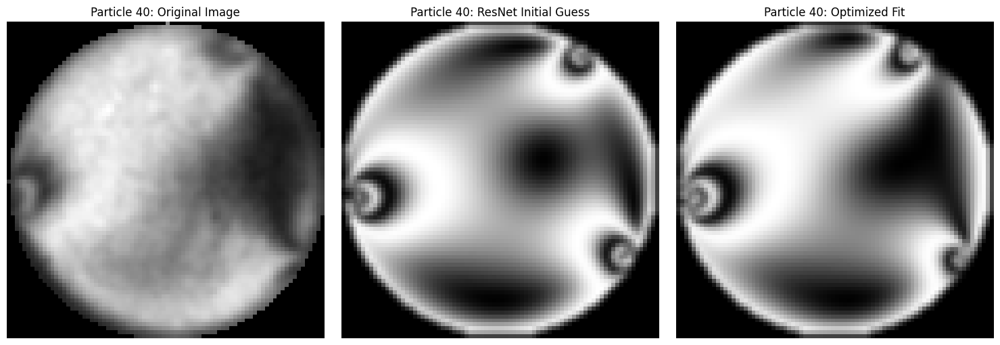

Particle id: 41, Contact number z=3
Initial forces: [1.04977341 0.8602787  0.57564597]
Initial alphas: [-0.11686481  0.24778751 -0.27427506]
Iter 0: loss=0.1307  image=0.0711  torque=0.0163  force=0.0433
Iter 10: loss=0.0600  image=0.0559  torque=0.0024  force=0.0017
Iter 20: loss=0.0534  image=0.0509  torque=0.0003  force=0.0022


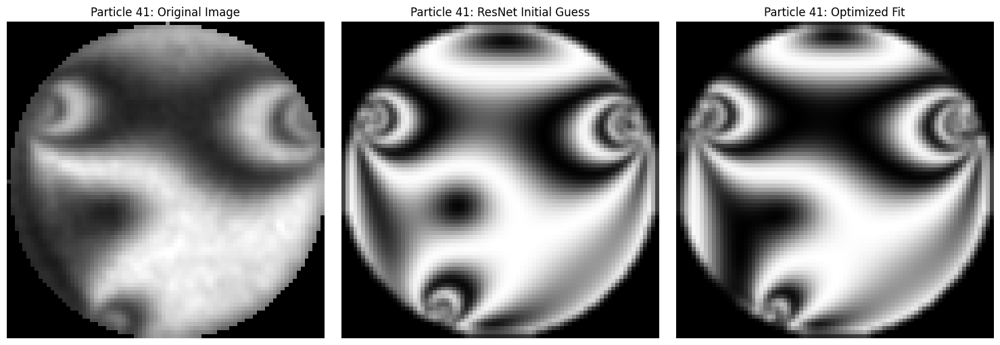

Particle id: 43, Contact number z=4
Initial forces: [0.36837444 0.22108333 0.3570837  0.37092369]
Initial alphas: [ 0.06288167  0.00392969 -0.04945356 -0.07426894]
Iter 0: loss=0.1324  image=0.0952  torque=0.0016  force=0.0356
Iter 10: loss=0.0557  image=0.0524  torque=0.0001  force=0.0032
Iter 20: loss=0.0443  image=0.0441  torque=0.0002  force=0.0000


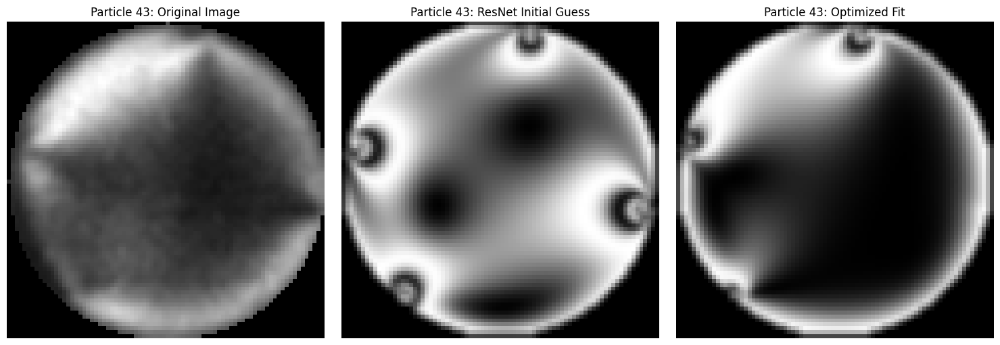

Particle id: 45, Contact number z=4
Initial forces: [0.30219269 0.53175859 0.45146513 0.68298483]
Initial alphas: [-0.11034516  0.04338099  0.18053998 -0.15364395]
Iter 0: loss=0.1554  image=0.0907  torque=0.0041  force=0.0606
Iter 10: loss=0.0679  image=0.0651  torque=0.0001  force=0.0026
Iter 20: loss=0.0520  image=0.0505  torque=0.0002  force=0.0013


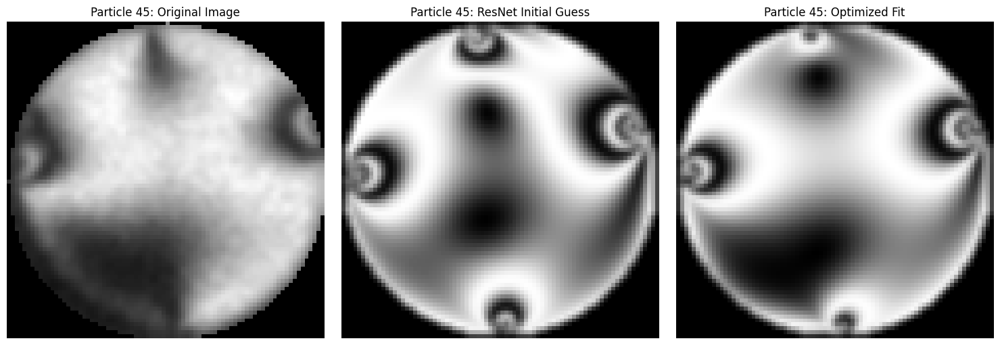

Particle id: 47, Contact number z=4
Initial forces: [0.38646154 0.27290393 0.16117771 0.48804739]
Initial alphas: [ 0.02866219  0.11391896  0.12831981 -0.19692546]
Iter 0: loss=0.2911  image=0.0695  torque=0.0039  force=0.2177
Iter 10: loss=0.0640  image=0.0490  torque=0.0017  force=0.0134
Iter 20: loss=0.0442  image=0.0426  torque=0.0004  force=0.0012


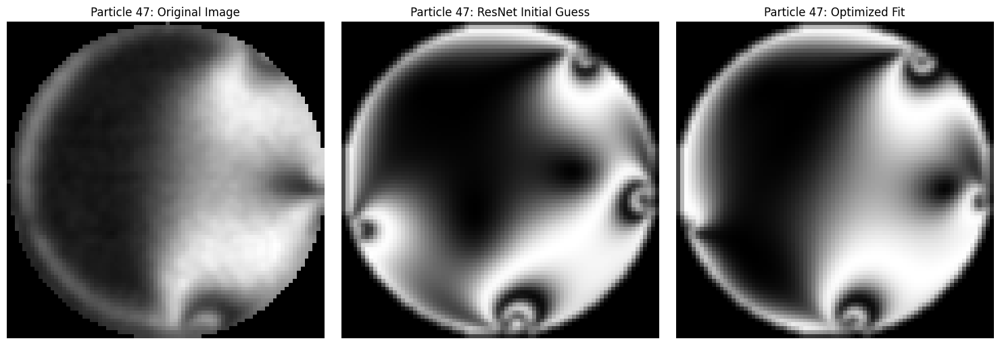

Particle id: 48, Contact number z=3
Initial forces: [0.17414852 0.44078786 0.20237997]
Initial alphas: [-0.1645834  -0.00882188 -0.00888649]
Iter 0: loss=0.0998  image=0.0712  torque=0.0042  force=0.0245
Iter 10: loss=0.0498  image=0.0470  torque=0.0006  force=0.0021


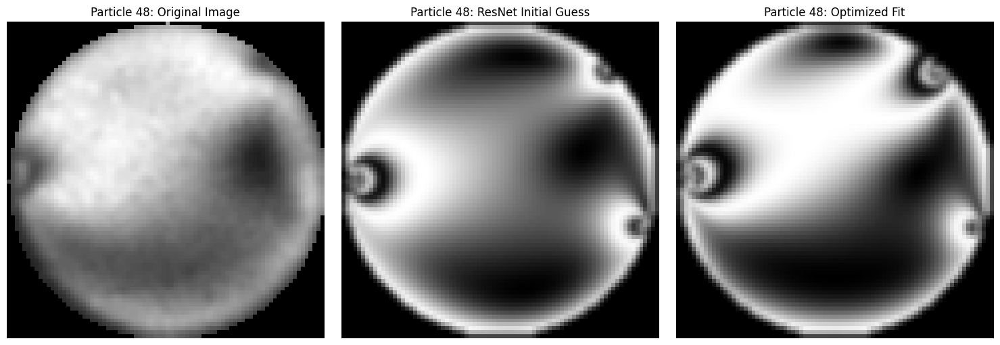

Particle id: 49, Contact number z=3
Initial forces: [0.59434562 0.3904801  0.29849918]
Initial alphas: [-0.09369915 -0.16867197  0.05611657]
Iter 0: loss=0.1450  image=0.0786  torque=0.0393  force=0.0271
Iter 10: loss=0.0657  image=0.0635  torque=0.0001  force=0.0021
Iter 20: loss=0.0543  image=0.0514  torque=0.0000  force=0.0029


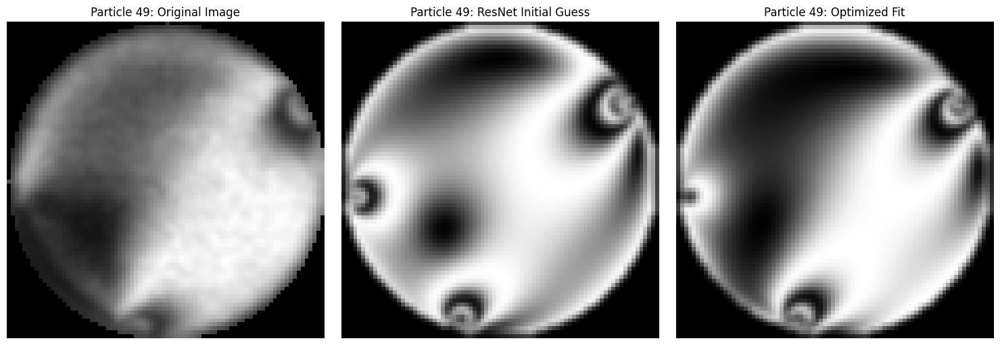

Particle id: 50, Contact number z=3
Initial forces: [0.29130106 0.32342134 0.27033759]
Initial alphas: [ 0.00528048 -0.09825937 -0.04946293]
Iter 0: loss=0.1330  image=0.0862  torque=0.0068  force=0.0399
Iter 10: loss=0.0529  image=0.0518  torque=0.0004  force=0.0007
Iter 20: loss=0.0487  image=0.0475  torque=0.0001  force=0.0010
Iter 30: loss=0.0484  image=0.0478  torque=0.0001  force=0.0004


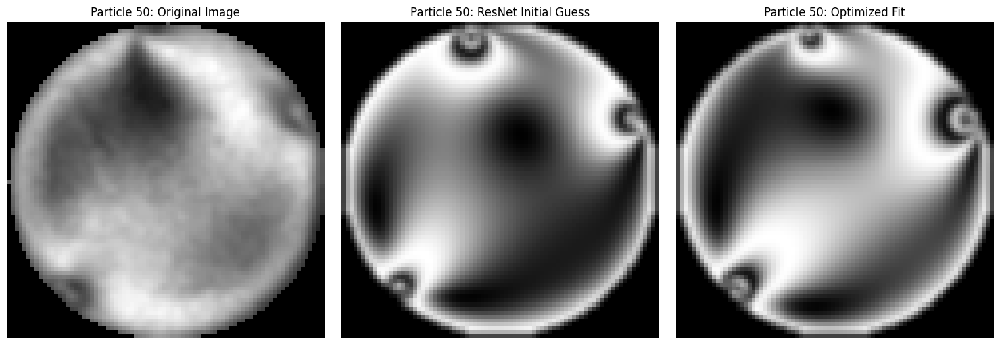

Particle id: 51, Contact number z=2
Initial forces: [0.40896971 0.61545775]
Initial alphas: [ 0.03619884 -0.00168404]
Iter 0: loss=0.1675  image=0.0661  torque=0.0007  force=0.1007
Iter 10: loss=0.0534  image=0.0483  torque=0.0002  force=0.0049


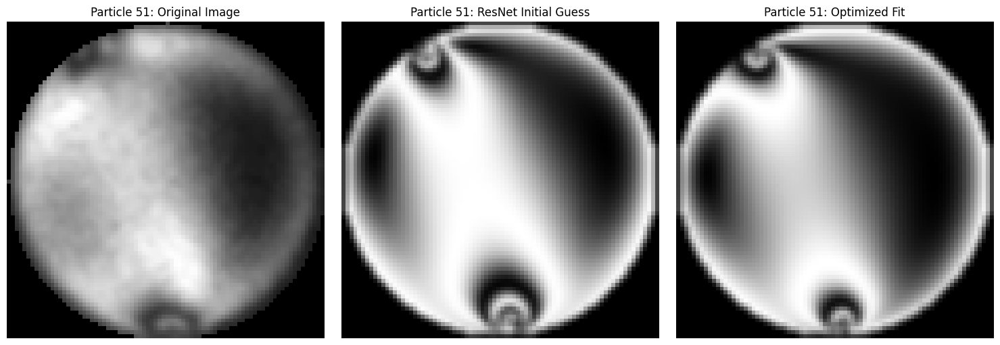

Particle id: 53, Contact number z=3
Initial forces: [0.30339024 0.22721908 0.28221923]
Initial alphas: [-0.00389585 -0.19209743  0.05005174]
Iter 0: loss=0.0857  image=0.0591  torque=0.0033  force=0.0233
Iter 10: loss=0.0541  image=0.0498  torque=0.0001  force=0.0043
Iter 20: loss=0.0467  image=0.0464  torque=0.0002  force=0.0001
Iter 30: loss=0.0454  image=0.0447  torque=0.0000  force=0.0007


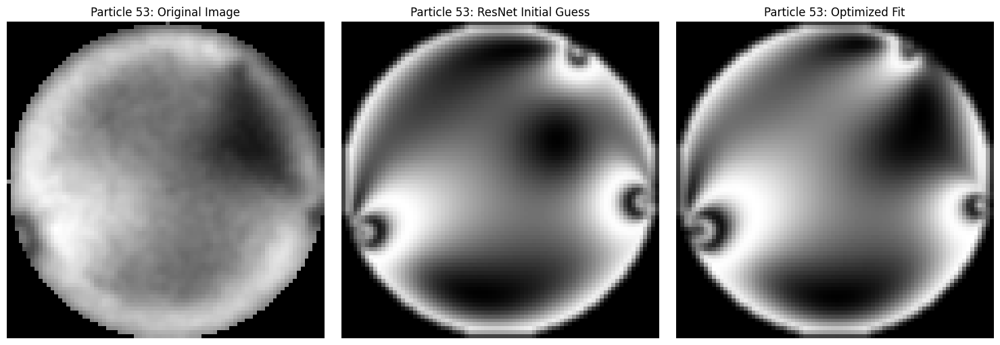

Particle id: 54, Contact number z=3
Initial forces: [0.20710062 0.26219094 0.32694576]
Initial alphas: [-0.1124266   0.00486275  0.04484924]
Iter 0: loss=0.1532  image=0.0659  torque=0.0002  force=0.0872
Iter 10: loss=0.0569  image=0.0558  torque=0.0003  force=0.0008
Iter 20: loss=0.0367  image=0.0347  torque=0.0015  force=0.0005


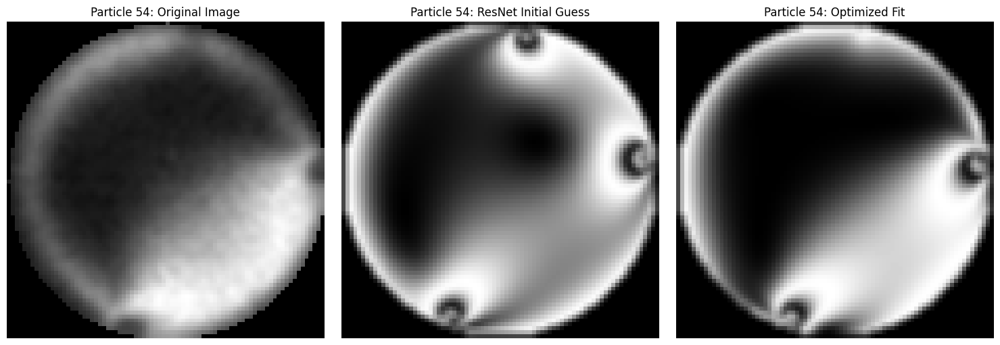

Particle id: 57, Contact number z=3
Initial forces: [0.32302608 0.26531534 0.24381566]
Initial alphas: [-0.07219081  0.03669358 -0.08242817]
Iter 0: loss=0.1926  image=0.0841  torque=0.0041  force=0.1045
Iter 10: loss=0.0691  image=0.0507  torque=0.0006  force=0.0178
Iter 20: loss=0.0583  image=0.0578  torque=0.0001  force=0.0004
Iter 30: loss=0.0543  image=0.0523  torque=0.0000  force=0.0019


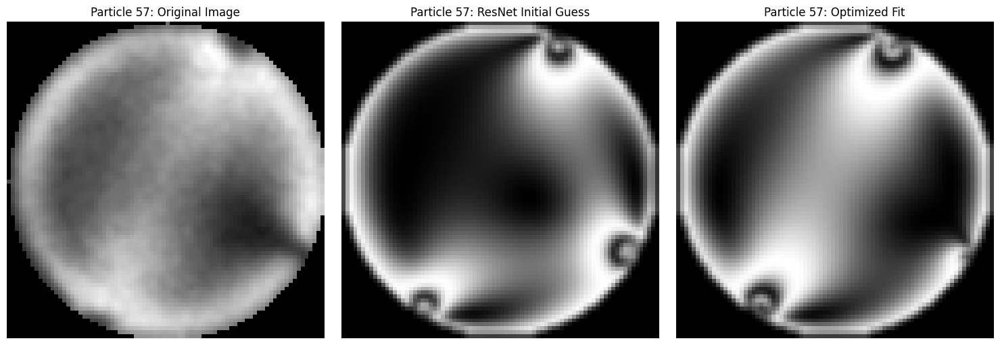

Particle id: 58, Contact number z=2
Initial forces: [0.24052808 0.30925609]
Initial alphas: [0.07887149 0.0043804 ]
Iter 0: loss=0.1095  image=0.0819  torque=0.0015  force=0.0260
Iter 10: loss=0.0670  image=0.0650  torque=0.0009  force=0.0012


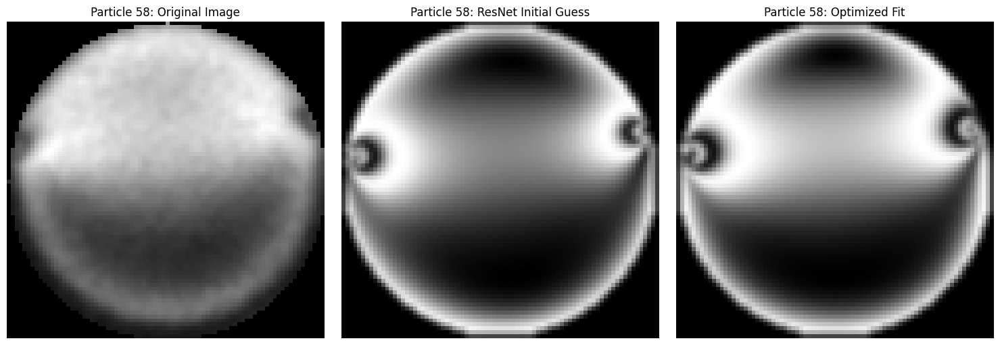

Particle id: 59, Contact number z=3
Initial forces: [0.24751121 0.30287054 0.25523781]
Initial alphas: [-0.0084918  -0.01303469 -0.08808129]
Iter 0: loss=0.0812  image=0.0763  torque=0.0029  force=0.0020
Iter 10: loss=0.0481  image=0.0463  torque=0.0001  force=0.0017
Iter 20: loss=0.0415  image=0.0412  torque=0.0001  force=0.0003


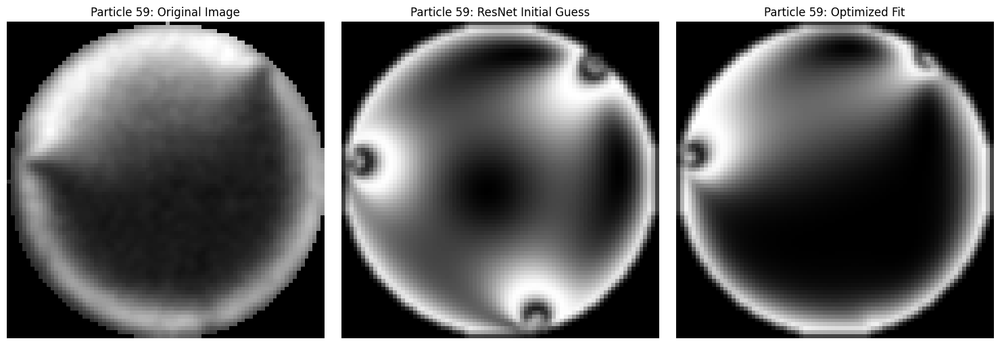

Particle id: 66, Contact number z=4
Initial forces: [0.35305259 0.32658656 0.22504258 0.29317231]
Initial alphas: [-0.13212085 -0.08416049  0.01619171  0.17907697]
Iter 0: loss=0.1481  image=0.0838  torque=0.0012  force=0.0631
Iter 10: loss=0.0486  image=0.0477  torque=0.0000  force=0.0008
Iter 20: loss=0.0493  image=0.0484  torque=0.0000  force=0.0009
Iter 30: loss=0.0480  image=0.0480  torque=0.0000  force=0.0000


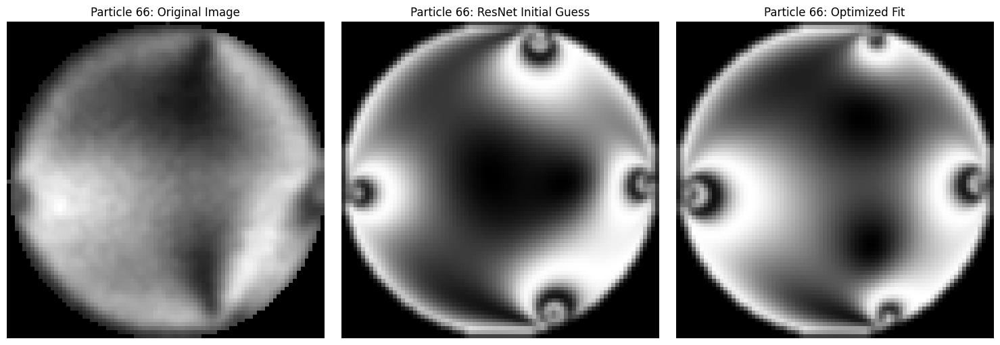

Particle id: 67, Contact number z=3
Initial forces: [0.2683377  0.2558959  0.35628819]
Initial alphas: [-0.09360813  0.06460442  0.05297522]
Iter 0: loss=0.0720  image=0.0575  torque=0.0004  force=0.0141
Iter 10: loss=0.0520  image=0.0497  torque=0.0001  force=0.0022
Iter 20: loss=0.0499  image=0.0493  torque=0.0001  force=0.0005


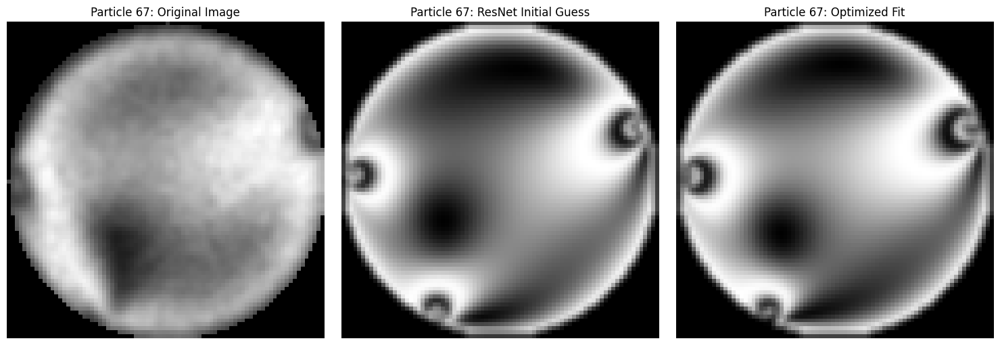

Particle id: 68, Contact number z=2
Initial forces: [0.23511765 0.22989945]
Initial alphas: [-0.13622504 -0.17841269]
Iter 0: loss=0.1129  image=0.0751  torque=0.0190  force=0.0187
Iter 10: loss=0.0569  image=0.0563  torque=0.0001  force=0.0005


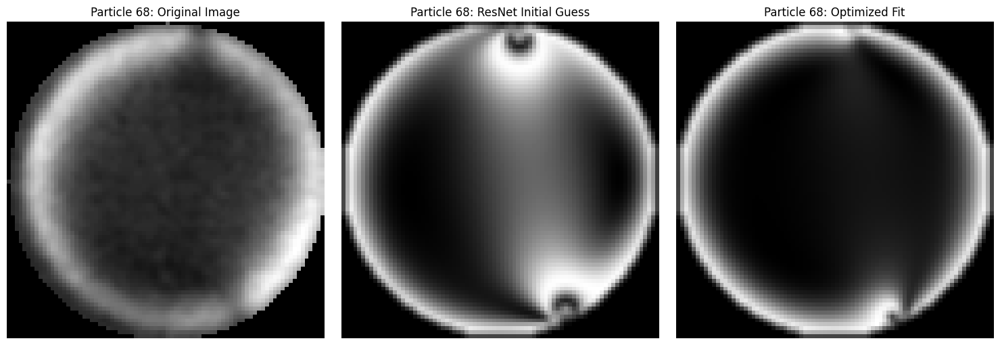

Particle id: 70, Contact number z=2
Initial forces: [0.41751888 0.20026724]
Initial alphas: [-0.00959336 -0.00561539]
Iter 0: loss=0.2008  image=0.0775  torque=0.0001  force=0.1232
Iter 10: loss=0.0392  image=0.0377  torque=0.0004  force=0.0011
Iter 20: loss=0.0392  image=0.0390  torque=0.0001  force=0.0001


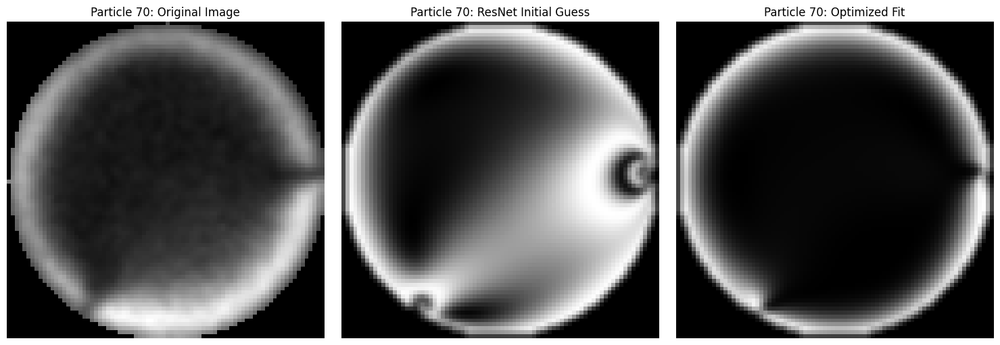

Particle id: 71, Contact number z=3
Initial forces: [0.31164107 0.35076334 0.36529459]
Initial alphas: [ 0.16521952 -0.11565611 -0.08298692]
Iter 0: loss=0.1319  image=0.1015  torque=0.0014  force=0.0291
Iter 10: loss=0.0609  image=0.0586  torque=0.0018  force=0.0005
Iter 20: loss=0.0552  image=0.0552  torque=0.0000  force=0.0001


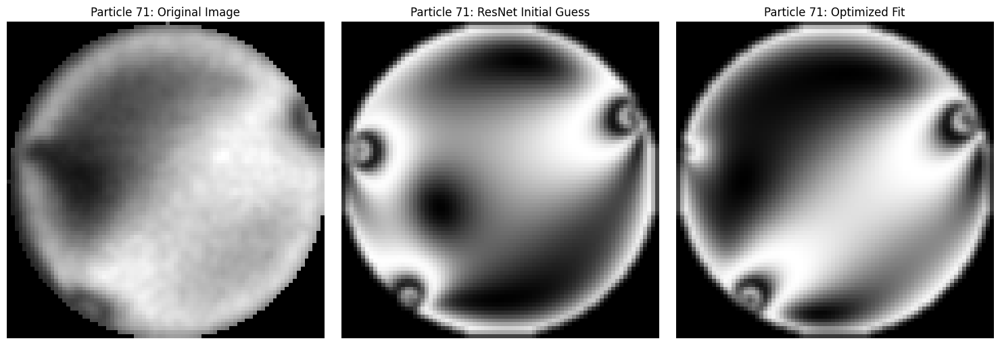

Particle id: 74, Contact number z=2
Initial forces: [0.38873005 0.28327628]
Initial alphas: [0.02723487 0.0571472 ]
Iter 0: loss=0.1083  image=0.0703  torque=0.0026  force=0.0355
Iter 10: loss=0.0467  image=0.0443  torque=0.0004  force=0.0020
Iter 20: loss=0.0411  image=0.0377  torque=0.0018  force=0.0016


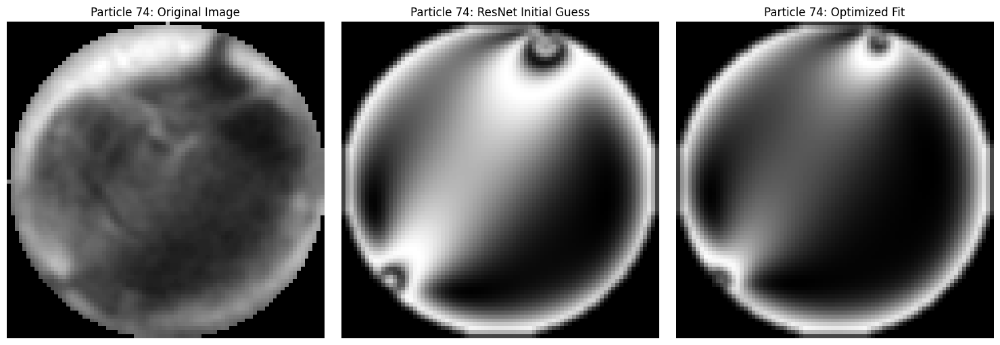

Particle id: 75, Contact number z=4
Initial forces: [0.32328912 0.3518388  0.15248047 0.28792711]
Initial alphas: [-0.10173969 -0.06672568 -0.10965431 -0.05877609]
Iter 0: loss=0.1653  image=0.0823  torque=0.0291  force=0.0539
Iter 10: loss=0.0811  image=0.0797  torque=0.0001  force=0.0013
Iter 20: loss=0.0752  image=0.0746  torque=0.0002  force=0.0005
Iter 30: loss=0.0717  image=0.0715  torque=0.0000  force=0.0002


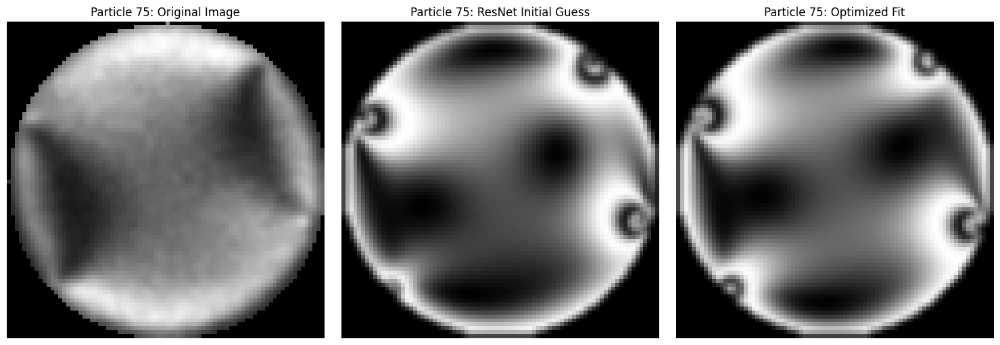

Particle id: 76, Contact number z=4
Initial forces: [0.28153991 0.19325137 0.26950732 0.26283835]
Initial alphas: [-0.03051181 -0.01734667  0.09919775 -0.00885544]
Iter 0: loss=0.0967  image=0.0653  torque=0.0006  force=0.0309
Iter 10: loss=0.0459  image=0.0427  torque=0.0003  force=0.0029
Iter 20: loss=0.0421  image=0.0389  torque=0.0015  force=0.0017
Iter 30: loss=0.0383  image=0.0381  torque=0.0000  force=0.0002


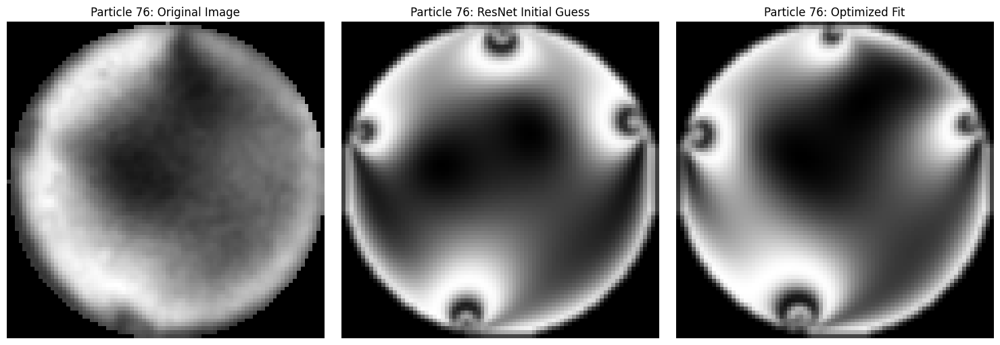

Particle id: 77, Contact number z=4
Initial forces: [0.19946406 0.30932597 0.22011913 0.34289625]
Initial alphas: [-0.06608554  0.0959721  -0.10975409  0.01227126]
Iter 0: loss=0.1132  image=0.0778  torque=0.0000  force=0.0354
Iter 10: loss=0.0290  image=0.0278  torque=0.0000  force=0.0012
Iter 20: loss=0.0319  image=0.0310  torque=0.0010  force=0.0000


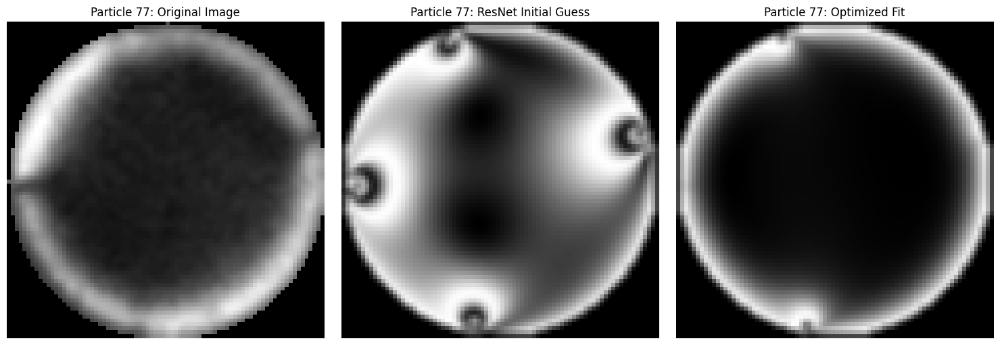

Particle id: 81, Contact number z=3
Initial forces: [0.25753766 0.25127971 0.25469906]
Initial alphas: [-0.07312087  0.1644292  -0.11137372]
Iter 0: loss=0.1133  image=0.0668  torque=0.0001  force=0.0463
Iter 10: loss=0.0333  image=0.0322  torque=0.0005  force=0.0006


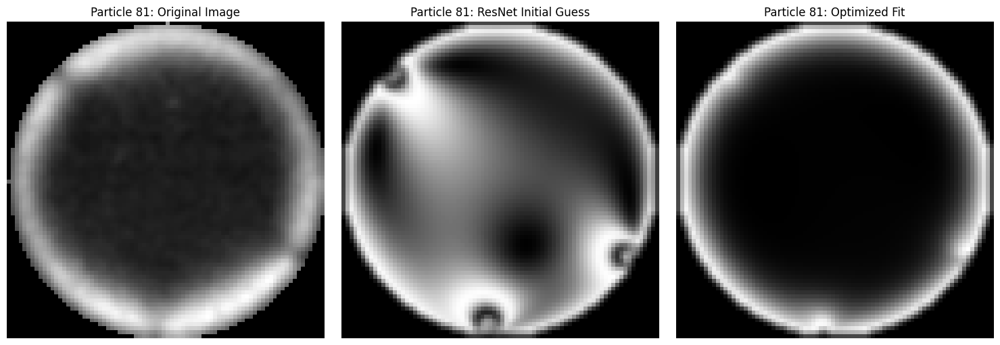

Particle id: 84, Contact number z=2
Initial forces: [0.23556912 0.24762459]
Initial alphas: [-0.09478714 -0.09681502]
Iter 0: loss=0.1127  image=0.0661  torque=0.0077  force=0.0389
Iter 10: loss=0.0663  image=0.0617  torque=0.0004  force=0.0042
Iter 20: loss=0.0608  image=0.0585  torque=0.0002  force=0.0021


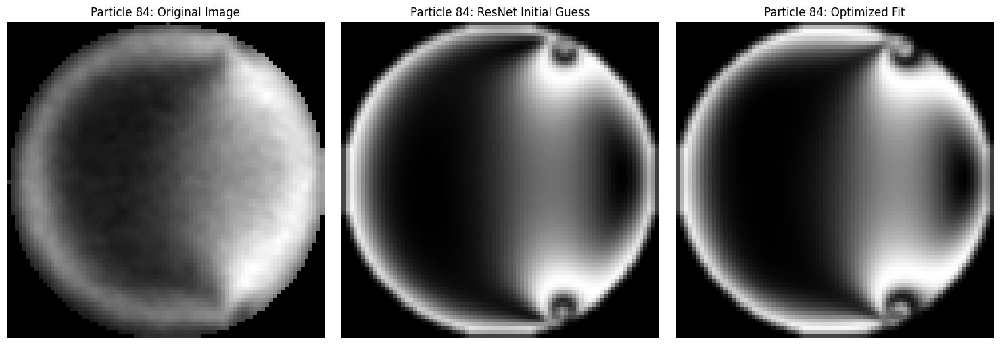

Particle id: 86, Contact number z=4
Initial forces: [0.67377441 0.39159107 0.3861253  0.6313468 ]
Initial alphas: [ 0.17993736 -0.12039317 -0.16281679 -0.1232712 ]
Iter 0: loss=0.4009  image=0.0807  torque=0.0160  force=0.3042
Iter 10: loss=0.1386  image=0.0942  torque=0.0027  force=0.0417
Iter 20: loss=0.0617  image=0.0522  torque=0.0001  force=0.0093
Iter 30: loss=0.0494  image=0.0482  torque=0.0000  force=0.0011
Iter 40: loss=0.0425  image=0.0421  torque=0.0000  force=0.0004


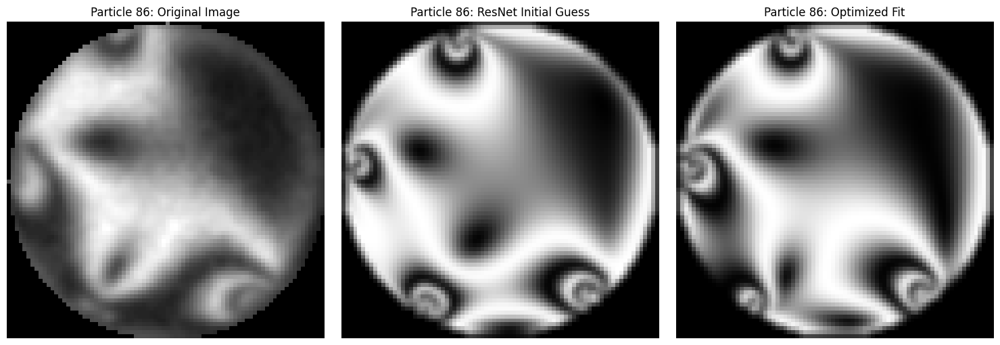

Particle id: 87, Contact number z=3
Initial forces: [0.37032849 0.29710148 0.24750863]
Initial alphas: [-0.22545272 -0.013978    0.03058257]
Iter 0: loss=0.2236  image=0.0528  torque=0.0227  force=0.1481
Iter 10: loss=0.0684  image=0.0482  torque=0.0046  force=0.0156
Iter 20: loss=0.0445  image=0.0430  torque=0.0000  force=0.0015
Iter 30: loss=0.0391  image=0.0389  torque=0.0001  force=0.0002


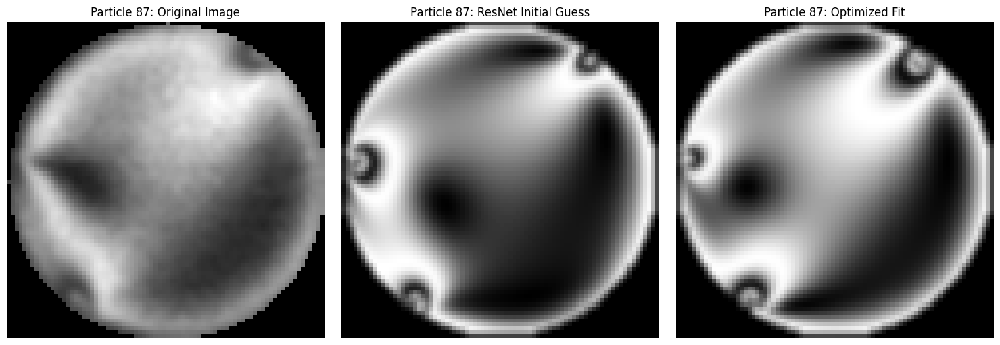

Particle id: 88, Contact number z=4
Initial forces: [0.20834516 0.32916062 0.22577974 0.23999845]
Initial alphas: [ 0.00165956 -0.00229385  0.13244265 -0.09706725]
Iter 0: loss=0.1075  image=0.0774  torque=0.0001  force=0.0300
Iter 10: loss=0.0340  image=0.0323  torque=0.0003  force=0.0014
Iter 20: loss=0.0308  image=0.0290  torque=0.0000  force=0.0018


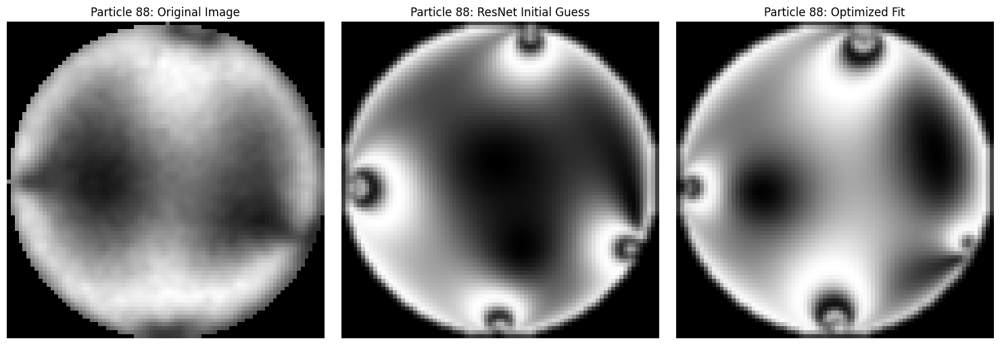

Particle id: 89, Contact number z=2
Initial forces: [0.22054941 0.34318875]
Initial alphas: [-0.00301037 -0.20266224]
Iter 0: loss=0.1119  image=0.0785  torque=0.0175  force=0.0159
Iter 10: loss=0.0785  image=0.0768  torque=0.0003  force=0.0014
Iter 20: loss=0.0778  image=0.0743  torque=0.0002  force=0.0033


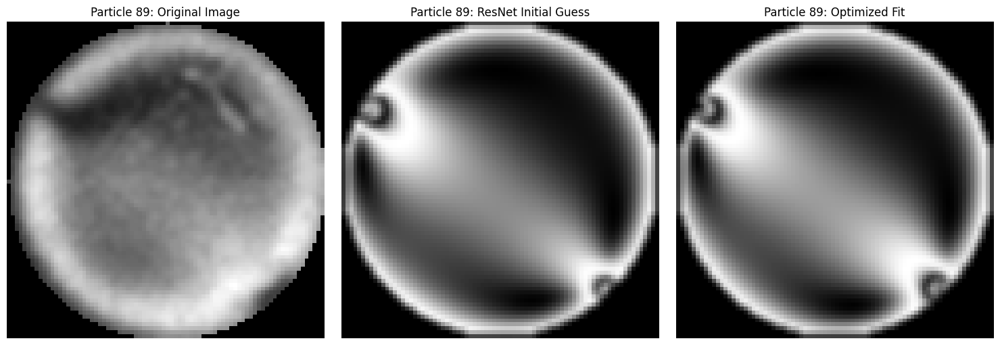

Particle id: 90, Contact number z=3
Initial forces: [0.41259184 0.43974731 0.11579746]
Initial alphas: [-0.0742766  -0.03452821 -0.00361065]
Iter 0: loss=0.1059  image=0.0468  torque=0.0077  force=0.0514
Iter 10: loss=0.0386  image=0.0365  torque=0.0007  force=0.0014
Iter 20: loss=0.0374  image=0.0367  torque=0.0001  force=0.0006


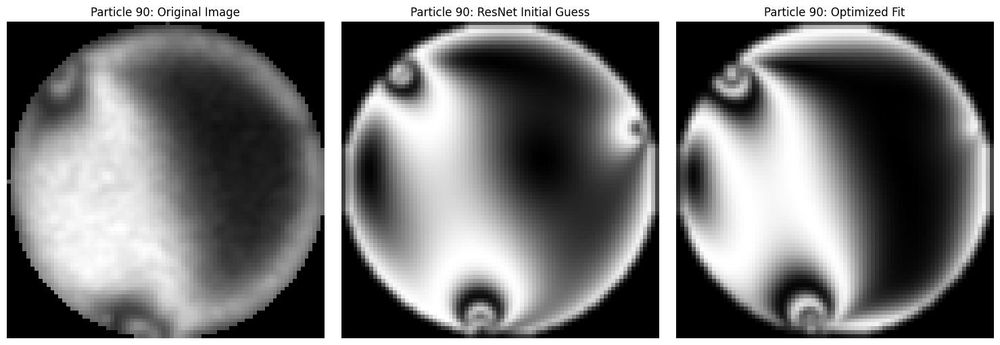

Particle id: 91, Contact number z=3
Initial forces: [0.42189159 1.17683244 0.91151311]
Initial alphas: [-0.10960342  0.23774098 -0.13211682]
Iter 0: loss=0.1105  image=0.0467  torque=0.0443  force=0.0196
Iter 10: loss=0.0531  image=0.0510  torque=0.0000  force=0.0021
Iter 20: loss=0.0478  image=0.0467  torque=0.0004  force=0.0007
Iter 30: loss=0.0459  image=0.0450  torque=0.0001  force=0.0008


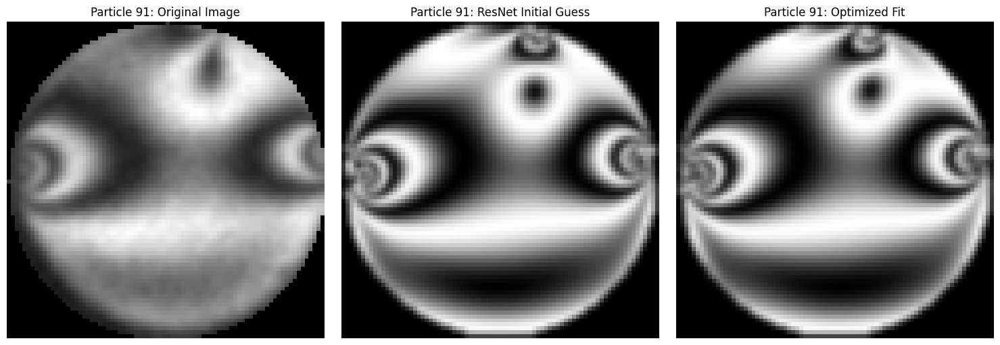

Particle id: 93, Contact number z=3
Initial forces: [0.51241658 0.52459188 0.62196436]
Initial alphas: [-0.05649302 -0.22545061  0.08316085]
Iter 0: loss=0.1173  image=0.0611  torque=0.0322  force=0.0241
Iter 10: loss=0.0631  image=0.0604  torque=0.0012  force=0.0015
Iter 20: loss=0.0598  image=0.0563  torque=0.0018  force=0.0016


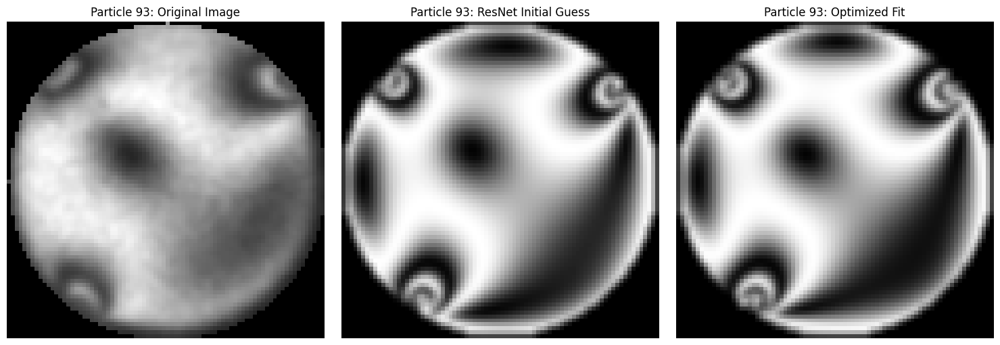

Particle id: 96, Contact number z=5
Initial forces: [0.49629972 0.33232566 0.24536805 0.23471856 0.64410224]
Initial alphas: [-0.01495718 -0.10269014 -0.01683971  0.0195795   0.05401363]
Iter 0: loss=0.1200  image=0.0629  torque=0.0002  force=0.0569
Iter 10: loss=0.0571  image=0.0474  torque=0.0000  force=0.0096
Iter 20: loss=0.0446  image=0.0435  torque=0.0000  force=0.0011
Iter 30: loss=0.0433  image=0.0427  torque=0.0000  force=0.0006


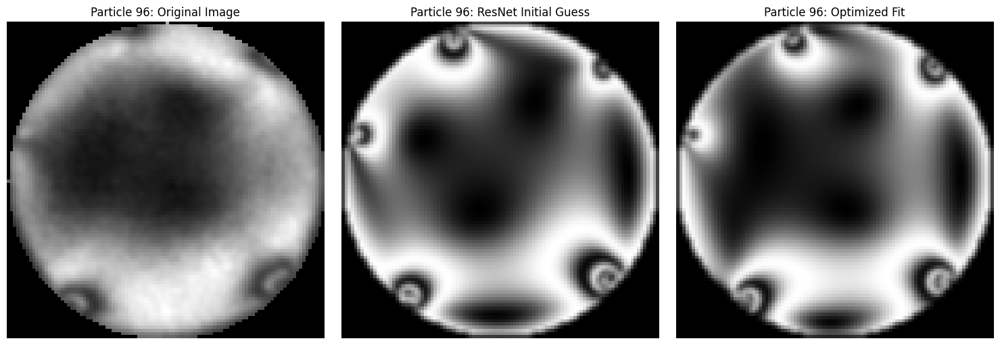

Particle id: 97, Contact number z=5
Initial forces: [0.44104621 0.21930351 0.38646634 0.35258635 0.23233035]
Initial alphas: [ 0.21623924 -0.1430575  -0.14721085 -0.1494472  -0.03166343]
Iter 0: loss=0.1105  image=0.0820  torque=0.0157  force=0.0127
Iter 10: loss=0.0605  image=0.0560  torque=0.0012  force=0.0034
Iter 20: loss=0.0542  image=0.0521  torque=0.0005  force=0.0016
Iter 30: loss=0.0490  image=0.0486  torque=0.0000  force=0.0003


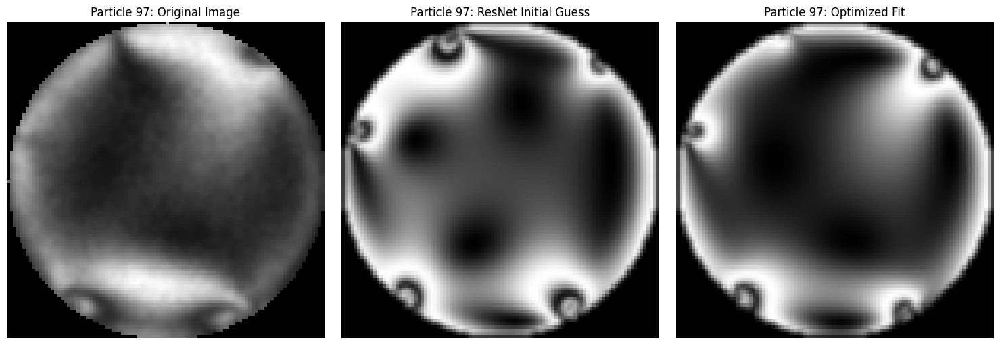

Particle id: 98, Contact number z=3
Initial forces: [0.34794216 0.35945127 0.34928384]
Initial alphas: [ 0.23723966 -0.18009634 -0.14833085]
Iter 0: loss=0.1586  image=0.0605  torque=0.0065  force=0.0915
Iter 10: loss=0.0451  image=0.0404  torque=0.0003  force=0.0044


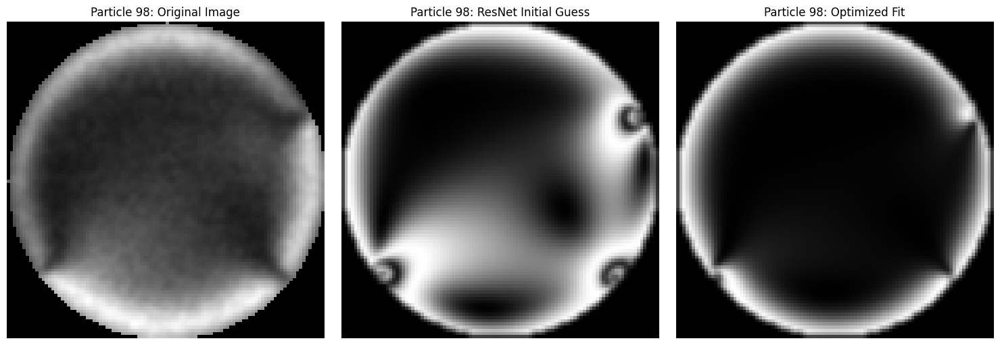

Particle id: 99, Contact number z=3
Initial forces: [0.33696184 0.44109728 0.35351565]
Initial alphas: [ 0.11686493  0.04912873 -0.02994024]
Iter 0: loss=0.0986  image=0.0557  torque=0.0141  force=0.0287
Iter 10: loss=0.0525  image=0.0477  torque=0.0041  force=0.0007
Iter 20: loss=0.0411  image=0.0402  torque=0.0002  force=0.0008


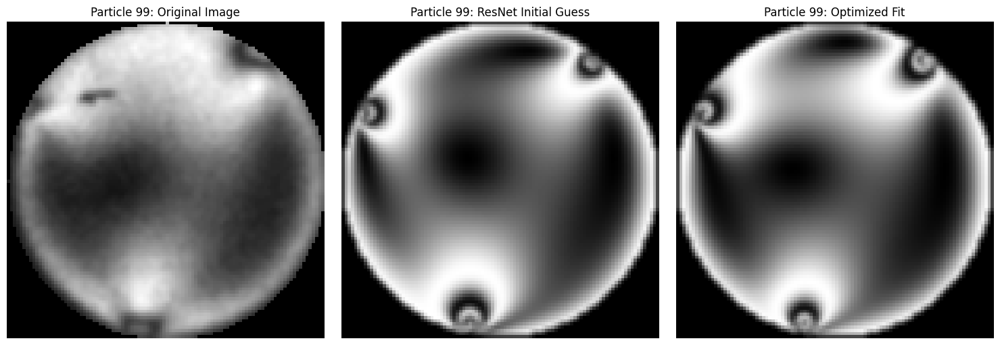

Particle id: 100, Contact number z=4
Initial forces: [0.36077607 0.32342899 0.34257038 0.27213852]
Initial alphas: [ 0.15480605 -0.01676879 -0.12741619 -0.21614034]
Iter 0: loss=0.0693  image=0.0440  torque=0.0149  force=0.0104
Iter 10: loss=0.0399  image=0.0382  torque=0.0002  force=0.0015
Iter 20: loss=0.0335  image=0.0335  torque=0.0000  force=0.0000


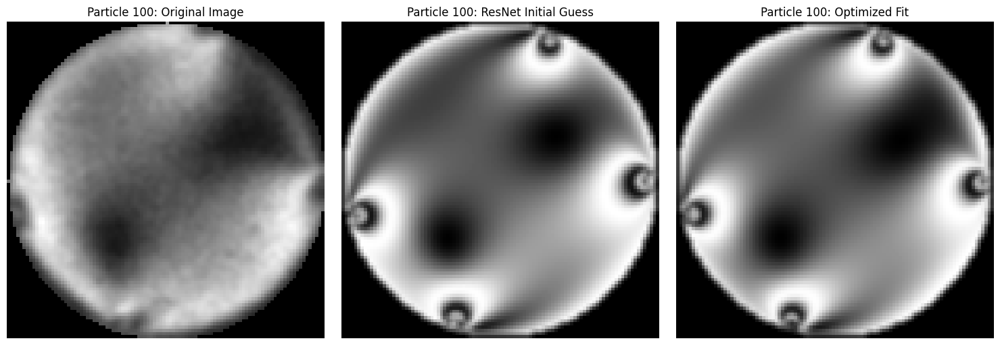

Particle id: 102, Contact number z=3
Initial forces: [0.29309993 0.31563052 0.31976005]
Initial alphas: [-0.04517177  0.11119882 -0.0595771 ]
Iter 0: loss=0.1006  image=0.0658  torque=0.0000  force=0.0348
Iter 10: loss=0.0604  image=0.0592  torque=0.0000  force=0.0012
Iter 20: loss=0.0504  image=0.0500  torque=0.0000  force=0.0005


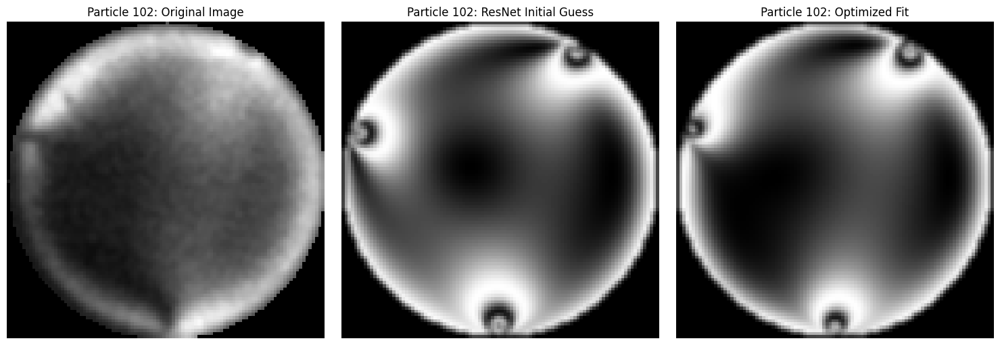

Particle id: 103, Contact number z=4
Initial forces: [0.20407391 0.84625168 0.61971838 0.19732141]
Initial alphas: [-0.08268339 -0.25965333 -0.07641774 -0.11343918]
Iter 0: loss=0.7065  image=0.0466  torque=0.5135  force=0.1464
Iter 10: loss=0.1119  image=0.0592  torque=0.0487  force=0.0040
Iter 20: loss=0.0677  image=0.0428  torque=0.0082  force=0.0167
Iter 30: loss=0.0473  image=0.0463  torque=0.0008  force=0.0001
Iter 40: loss=0.0416  image=0.0384  torque=0.0021  force=0.0011
Iter 50: loss=0.0357  image=0.0344  torque=0.0007  force=0.0006


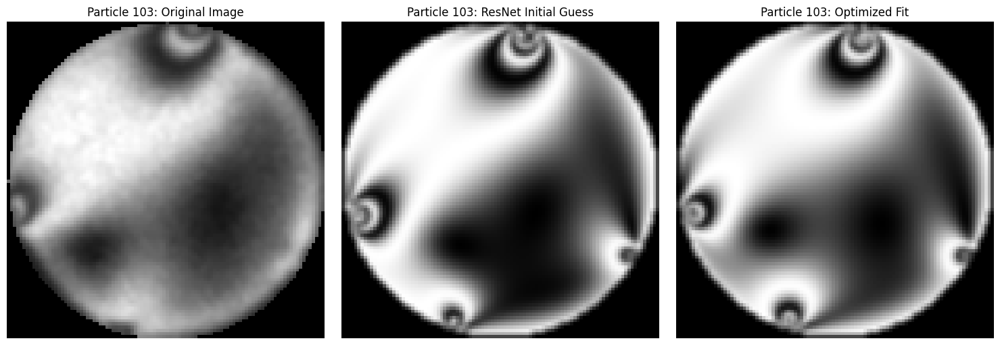

Particle id: 104, Contact number z=3
Initial forces: [0.26002986 0.22543652 0.32685367]
Initial alphas: [-0.03448265 -0.06689819  0.19973002]
Iter 0: loss=0.1810  image=0.0549  torque=0.0093  force=0.1168
Iter 10: loss=0.0426  image=0.0395  torque=0.0006  force=0.0024
Iter 20: loss=0.0393  image=0.0377  torque=0.0003  force=0.0014


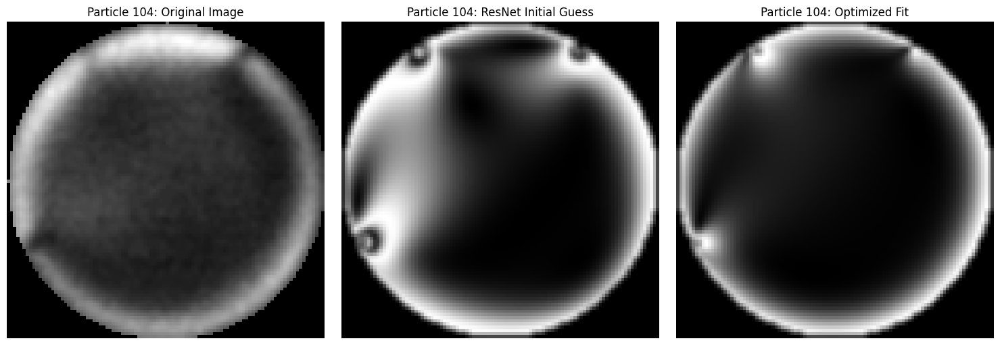

Particle id: 105, Contact number z=4
Initial forces: [0.30764258 0.48838878 0.53685336 0.60796337]
Initial alphas: [-0.31463772 -0.04489319 -0.06943505  0.36808616]
Iter 0: loss=0.3389  image=0.0692  torque=0.0231  force=0.2467
Iter 10: loss=0.1053  image=0.0613  torque=0.0010  force=0.0430
Iter 20: loss=0.0686  image=0.0597  torque=0.0002  force=0.0087
Iter 30: loss=0.0576  image=0.0559  torque=0.0000  force=0.0018
Iter 40: loss=0.0559  image=0.0559  torque=0.0000  force=0.0000


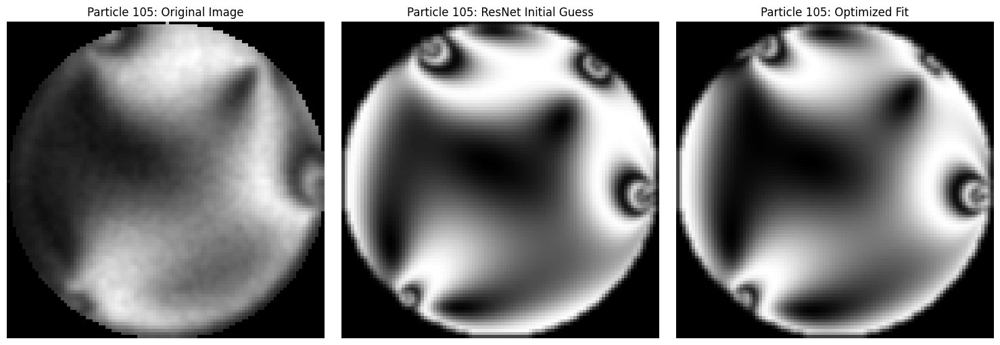

Particle id: 106, Contact number z=4
Initial forces: [0.23214029 0.25330739 0.22162628 0.28784755]
Initial alphas: [ 0.19540757 -0.02212968 -0.01783078 -0.15955576]
Iter 0: loss=0.1988  image=0.0621  torque=0.0006  force=0.1361
Iter 10: loss=0.0586  image=0.0549  torque=0.0001  force=0.0035
Iter 20: loss=0.0402  image=0.0383  torque=0.0001  force=0.0017
Iter 30: loss=0.0389  image=0.0384  torque=0.0002  force=0.0004


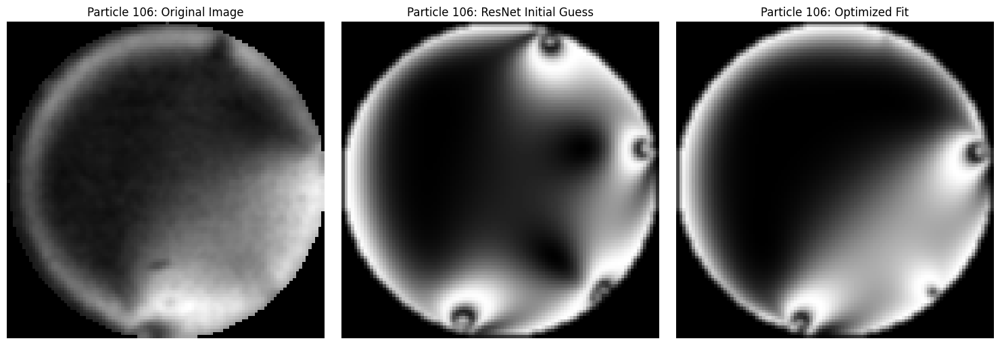

Particle id: 107, Contact number z=5
Initial forces: [0.42578259 0.27979167 0.29029765 0.32879734 0.36515515]
Initial alphas: [-0.09010492 -0.07813421 -0.06019178 -0.10572466  0.04440991]
Iter 0: loss=0.2552  image=0.1017  torque=0.0514  force=0.1021
Iter 10: loss=0.1042  image=0.1013  torque=0.0005  force=0.0025
Iter 20: loss=0.0725  image=0.0712  torque=0.0011  force=0.0002
Iter 30: loss=0.0663  image=0.0635  torque=0.0020  force=0.0008
Iter 40: loss=0.0612  image=0.0599  torque=0.0002  force=0.0011


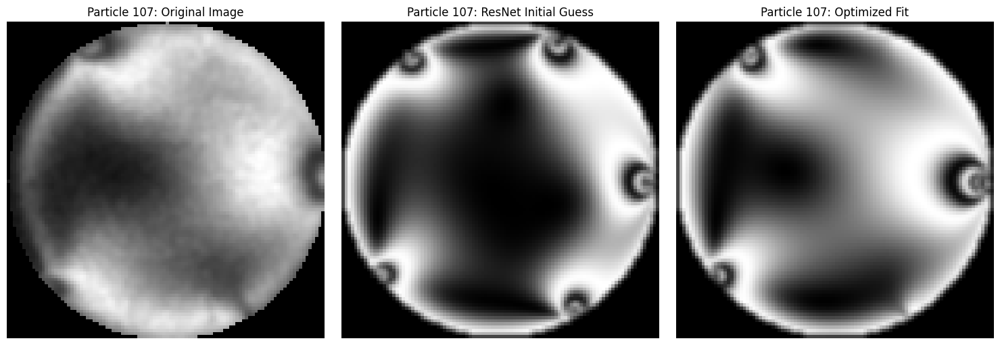

Particle id: 108, Contact number z=3
Initial forces: [0.6788415  0.44421244 0.2992146 ]
Initial alphas: [-0.1127919  -0.11296754 -0.06634665]
Iter 0: loss=0.2394  image=0.0448  torque=0.1191  force=0.0755
Iter 10: loss=0.0662  image=0.0638  torque=0.0016  force=0.0008
Iter 20: loss=0.0532  image=0.0434  torque=0.0000  force=0.0097
Iter 30: loss=0.0466  image=0.0448  torque=0.0001  force=0.0017
Iter 40: loss=0.0434  image=0.0427  torque=0.0001  force=0.0006


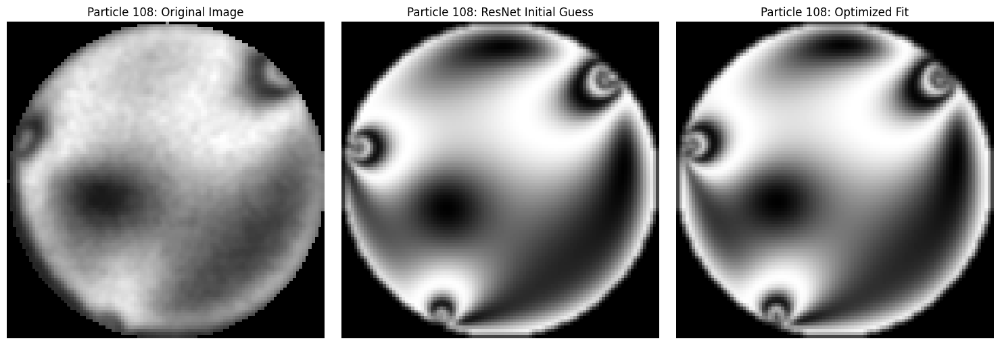

Particle id: 109, Contact number z=3
Initial forces: [0.29611959 0.24331752 0.27015129]
Initial alphas: [-0.21621755  0.14128637 -0.10696739]
Iter 0: loss=0.1352  image=0.0449  torque=0.0188  force=0.0715
Iter 10: loss=0.0406  image=0.0313  torque=0.0000  force=0.0093
Iter 20: loss=0.0344  image=0.0343  torque=0.0000  force=0.0000
Iter 30: loss=0.0333  image=0.0330  torque=0.0000  force=0.0003


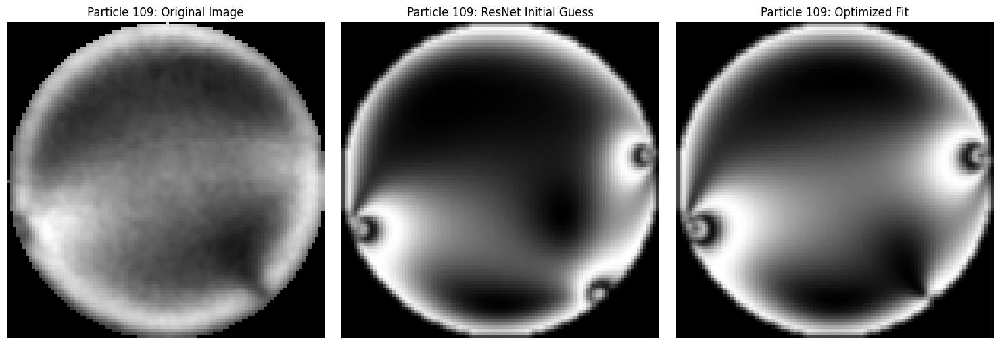

Particle id: 110, Contact number z=3
Initial forces: [1.00671394 0.41562288 1.26744318]
Initial alphas: [-0.04965125  0.01434967 -0.11732227]
Iter 0: loss=0.2788  image=0.0592  torque=0.2059  force=0.0136
Iter 10: loss=0.0623  image=0.0480  torque=0.0068  force=0.0076
Iter 20: loss=0.0570  image=0.0442  torque=0.0047  force=0.0081
Iter 30: loss=0.0466  image=0.0455  torque=0.0000  force=0.0010


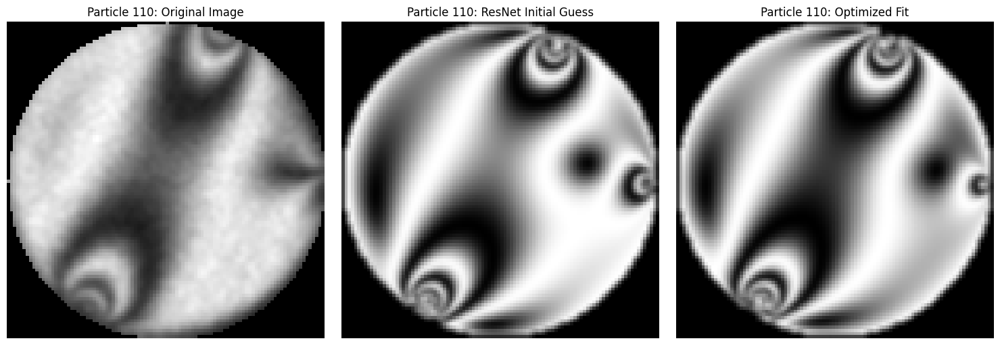

Particle id: 111, Contact number z=2
Initial forces: [0.20071358 0.25406857]
Initial alphas: [0.01636223 0.00058359]
Iter 0: loss=0.0765  image=0.0414  torque=0.0001  force=0.0350
Iter 10: loss=0.0277  image=0.0250  torque=0.0007  force=0.0019
Iter 20: loss=0.0258  image=0.0251  torque=0.0004  force=0.0004


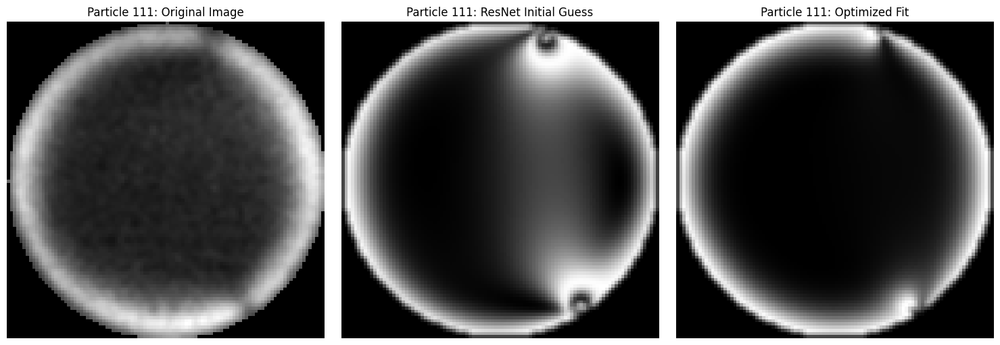

Particle id: 113, Contact number z=2
Initial forces: [0.24723045 0.46268156]
Initial alphas: [0.06802958 0.06724068]
Iter 0: loss=0.1097  image=0.0483  torque=0.0128  force=0.0487
Iter 10: loss=0.0204  image=0.0202  torque=0.0000  force=0.0002
Iter 20: loss=0.0246  image=0.0241  torque=0.0001  force=0.0004


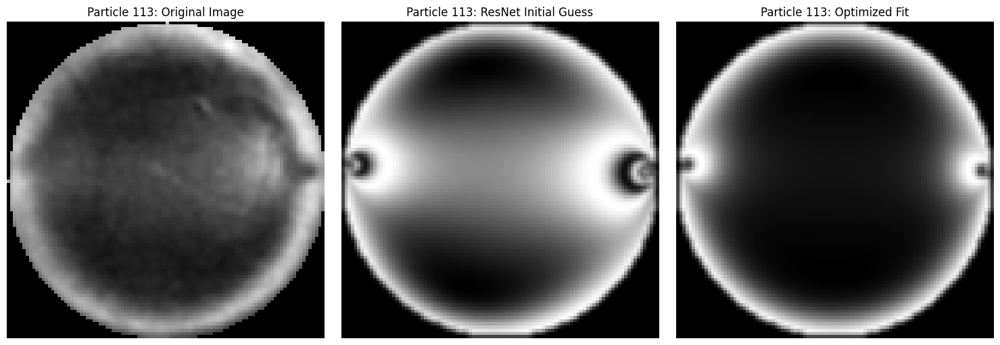

Particle id: 114, Contact number z=2
Initial forces: [0.41695125 0.40516573]
Initial alphas: [-0.02649786 -0.1293678 ]
Iter 0: loss=0.2945  image=0.0557  torque=0.0223  force=0.2165
Iter 10: loss=0.0541  image=0.0510  torque=0.0000  force=0.0032


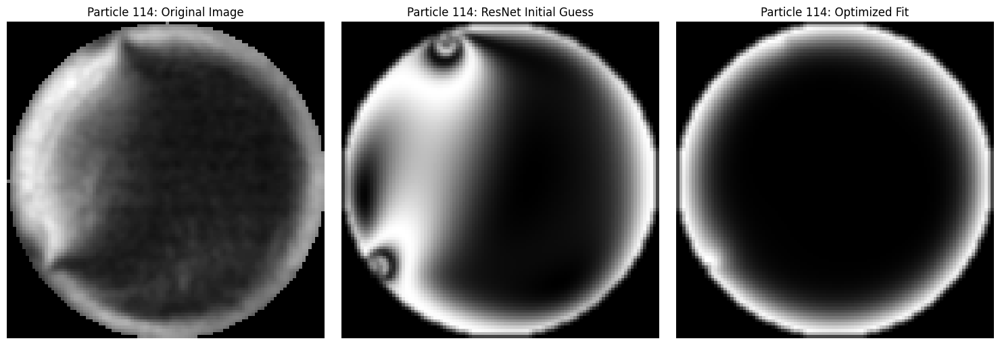

Particle id: 115, Contact number z=3
Initial forces: [0.7776176  1.02786477 0.64539728]
Initial alphas: [-0.16804793  0.09497824 -0.0836814 ]
Iter 0: loss=0.2869  image=0.0521  torque=0.0417  force=0.1931
Iter 10: loss=0.0845  image=0.0598  torque=0.0030  force=0.0217
Iter 20: loss=0.0504  image=0.0476  torque=0.0009  force=0.0020
Iter 30: loss=0.0421  image=0.0414  torque=0.0003  force=0.0005
Iter 40: loss=0.0413  image=0.0400  torque=0.0005  force=0.0008


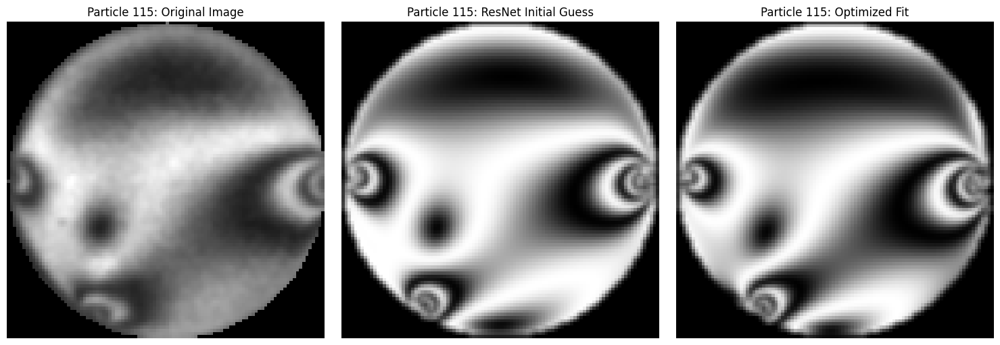

Particle id: 116, Contact number z=3
Initial forces: [0.44948094 0.2975699  0.30875444]
Initial alphas: [-0.23286453 -0.03799247 -0.08936059]
Iter 0: loss=0.1962  image=0.0498  torque=0.1131  force=0.0333
Iter 10: loss=0.0800  image=0.0621  torque=0.0076  force=0.0103
Iter 20: loss=0.0613  image=0.0611  torque=0.0000  force=0.0001
Iter 30: loss=0.0523  image=0.0473  torque=0.0006  force=0.0044
Iter 40: loss=0.0406  image=0.0402  torque=0.0000  force=0.0003


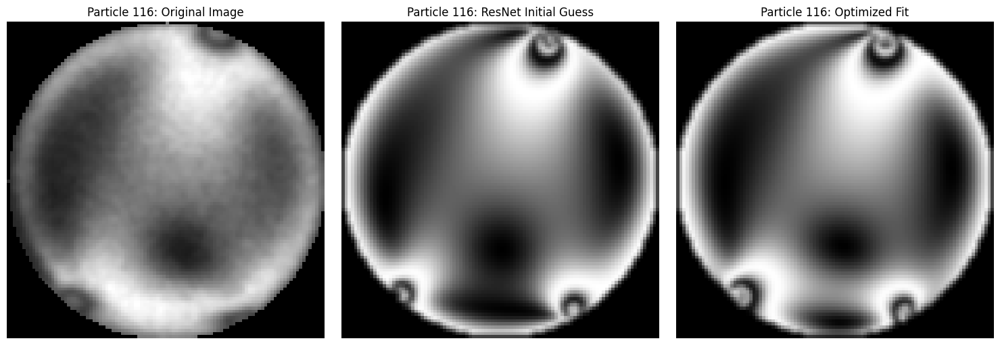

Particle id: 118, Contact number z=3
Initial forces: [0.2341748  0.20521188 0.22504781]
Initial alphas: [-0.03791898 -0.13306189  0.05621519]
Iter 0: loss=0.0786  image=0.0334  torque=0.0031  force=0.0422
Iter 10: loss=0.0321  image=0.0248  torque=0.0003  force=0.0070
Iter 20: loss=0.0262  image=0.0248  torque=0.0009  force=0.0005


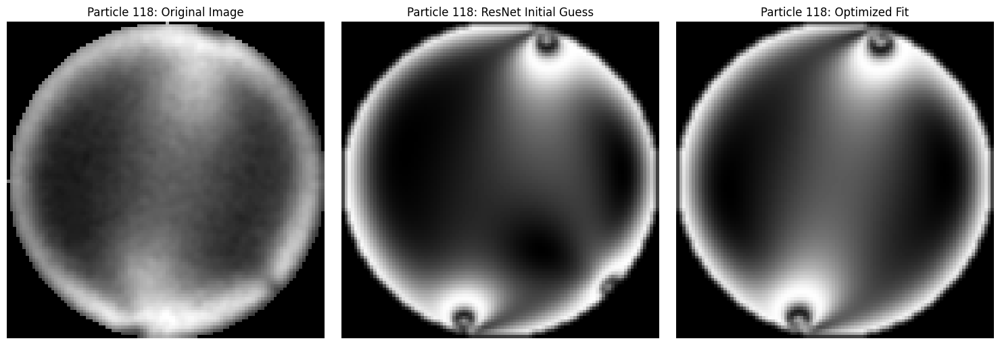

Particle id: 119, Contact number z=2
Initial forces: [0.39140918 0.2477442 ]
Initial alphas: [ 0.11972912 -0.03938245]
Iter 0: loss=0.0797  image=0.0453  torque=0.0076  force=0.0268
Iter 10: loss=0.0366  image=0.0350  torque=0.0014  force=0.0003


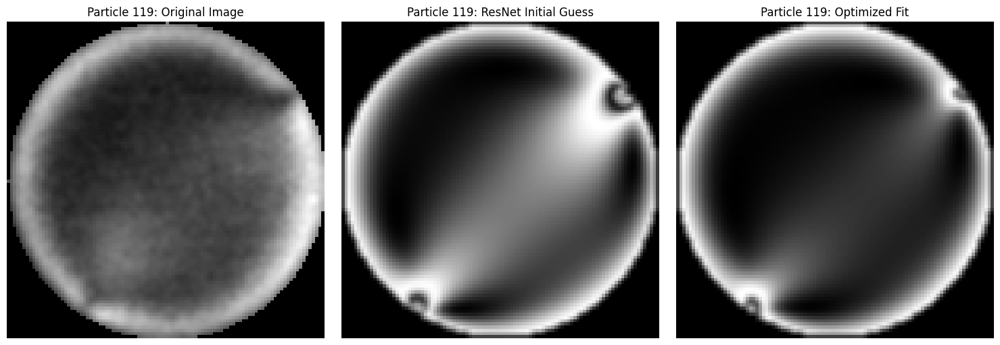

Particle id: 120, Contact number z=2
Initial forces: [0.38167562 0.28966516]
Initial alphas: [ 0.1557714  -0.31861219]
Iter 0: loss=0.0762  image=0.0449  torque=0.0055  force=0.0257
Iter 10: loss=0.0437  image=0.0435  torque=0.0001  force=0.0002


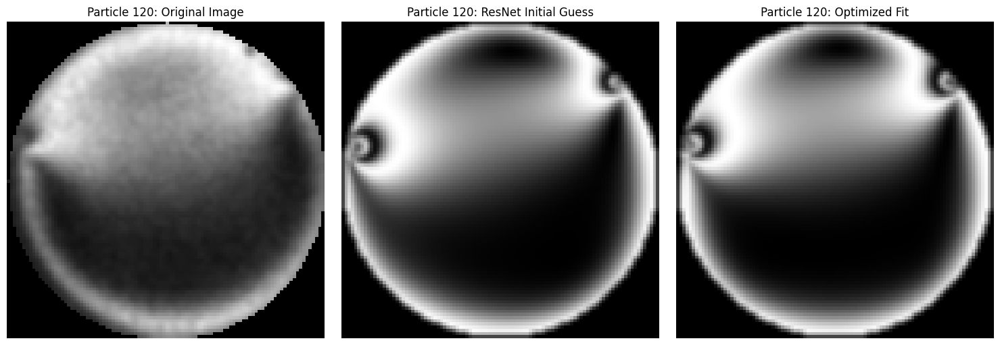

Particle id: 121, Contact number z=4
Initial forces: [0.33690559 0.68758135 0.41803458 0.73756742]
Initial alphas: [-0.06120962  0.20265973 -0.15426649 -0.15038349]
Iter 0: loss=0.0906  image=0.0622  torque=0.0180  force=0.0104
Iter 10: loss=0.0536  image=0.0501  torque=0.0007  force=0.0029
Iter 20: loss=0.0480  image=0.0466  torque=0.0009  force=0.0005


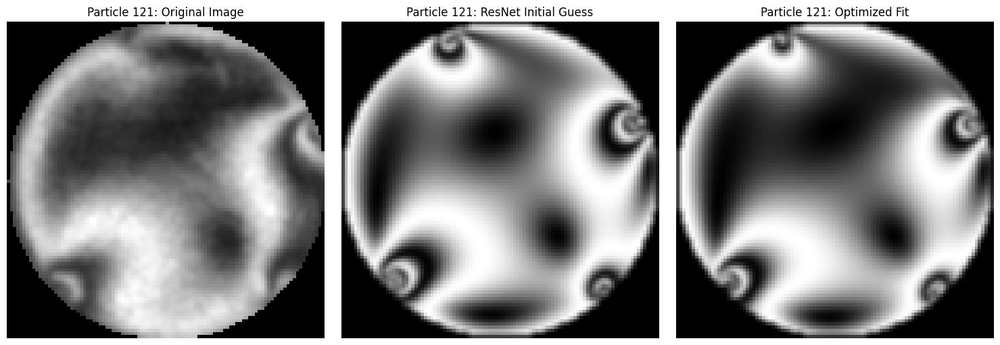

Particle id: 122, Contact number z=3
Initial forces: [0.49632461 0.70438235 0.35210903]
Initial alphas: [-0.04233877 -0.08946227 -0.16091484]
Iter 0: loss=0.2112  image=0.0486  torque=0.1096  force=0.0530
Iter 10: loss=0.0470  image=0.0465  torque=0.0000  force=0.0004
Iter 20: loss=0.0474  image=0.0465  torque=0.0000  force=0.0009
Iter 30: loss=0.0444  image=0.0443  torque=0.0000  force=0.0000


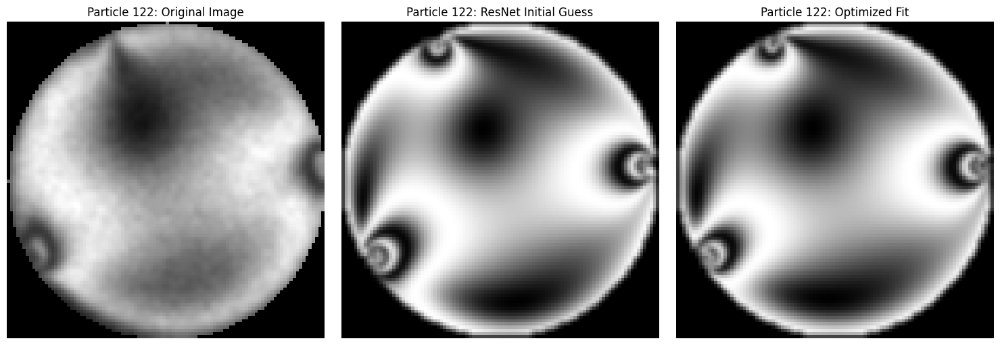

Particle id: 123, Contact number z=3
Initial forces: [0.76687567 0.50459089 0.43419946]
Initial alphas: [-0.18433879  0.03076348 -0.10784123]
Iter 0: loss=0.4892  image=0.0490  torque=0.1642  force=0.2760
Iter 10: loss=0.0373  image=0.0343  torque=0.0003  force=0.0028
Iter 20: loss=0.0553  image=0.0398  torque=0.0001  force=0.0154
Iter 30: loss=0.0372  image=0.0362  torque=0.0007  force=0.0003
Iter 40: loss=0.0344  image=0.0335  torque=0.0002  force=0.0007


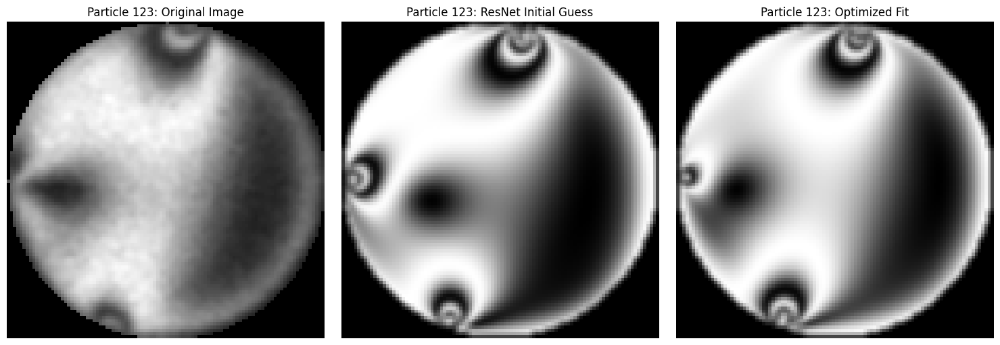

Particle id: 124, Contact number z=4
Initial forces: [0.39719367 0.35511203 0.23120073 0.2626658 ]
Initial alphas: [-0.09797419 -0.05381807  0.1790102  -0.22127011]
Iter 0: loss=0.1861  image=0.0542  torque=0.0308  force=0.1010
Iter 10: loss=0.0468  image=0.0420  torque=0.0000  force=0.0048
Iter 20: loss=0.0393  image=0.0377  torque=0.0006  force=0.0010


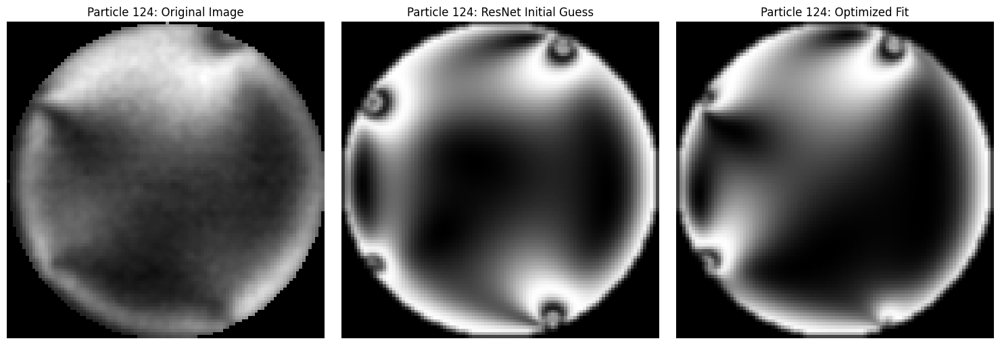

Particle id: 125, Contact number z=4
Initial forces: [0.48046603 0.34467852 0.24447359 0.77579684]
Initial alphas: [-0.00384004 -0.07432087 -0.15083335  0.26568389]
Iter 0: loss=0.2615  image=0.0672  torque=0.1083  force=0.0859
Iter 10: loss=0.0887  image=0.0772  torque=0.0052  force=0.0063
Iter 20: loss=0.0739  image=0.0667  torque=0.0012  force=0.0060
Iter 30: loss=0.0696  image=0.0683  torque=0.0008  force=0.0004
Iter 40: loss=0.0658  image=0.0641  torque=0.0000  force=0.0016


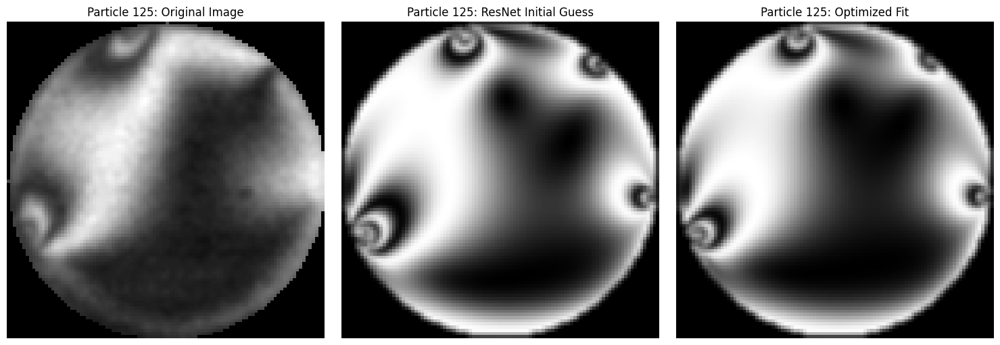

Particle id: 127, Contact number z=3
Initial forces: [0.26071045 0.61679685 0.44755912]
Initial alphas: [ 0.13440129  0.0490504  -0.30629739]
Iter 0: loss=0.1072  image=0.0719  torque=0.0271  force=0.0082
Iter 10: loss=0.0572  image=0.0513  torque=0.0004  force=0.0056
Iter 20: loss=0.0481  image=0.0474  torque=0.0003  force=0.0005


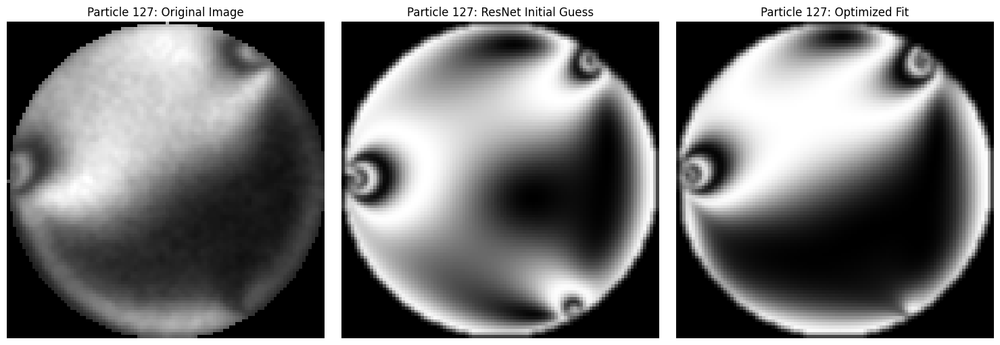

Particle id: 128, Contact number z=4
Initial forces: [1.03793921 0.6770839  0.93513322 0.21281163]
Initial alphas: [-0.03210461  0.05478872 -0.11233064 -0.0450092 ]
Iter 0: loss=0.1806  image=0.0378  torque=0.0681  force=0.0746
Iter 10: loss=0.0342  image=0.0290  torque=0.0012  force=0.0039
Iter 20: loss=0.0283  image=0.0256  torque=0.0023  force=0.0004
Iter 30: loss=0.0246  image=0.0232  torque=0.0001  force=0.0013


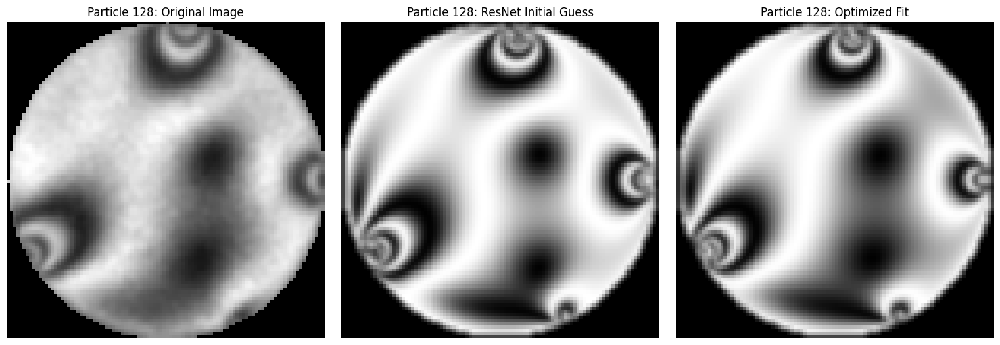

Particle id: 130, Contact number z=3
Initial forces: [0.27208643 0.27758825 0.38164201]
Initial alphas: [-0.1755456   0.13193953 -0.03184781]
Iter 0: loss=0.0546  image=0.0464  torque=0.0030  force=0.0052
Iter 10: loss=0.0403  image=0.0379  torque=0.0007  force=0.0016
Iter 20: loss=0.0383  image=0.0370  torque=0.0001  force=0.0012


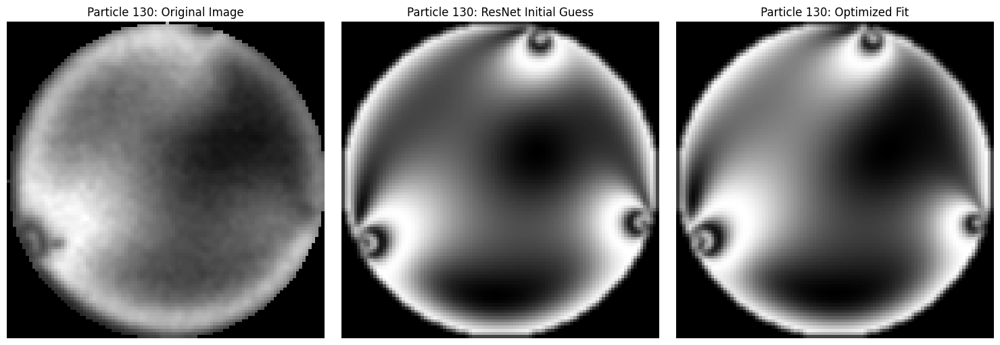

Particle id: 131, Contact number z=5
Initial forces: [0.81981654 0.45404363 1.14798803 0.3759151  0.40346417]
Initial alphas: [-0.03768573  0.0528908  -0.06566143  0.0016449  -0.28576639]
Iter 0: loss=0.3398  image=0.0658  torque=0.2123  force=0.0617
Iter 10: loss=0.1047  image=0.0637  torque=0.0314  force=0.0096
Iter 20: loss=0.0652  image=0.0563  torque=0.0027  force=0.0062
Iter 30: loss=0.0485  image=0.0471  torque=0.0002  force=0.0012
Iter 40: loss=0.0473  image=0.0451  torque=0.0006  force=0.0015


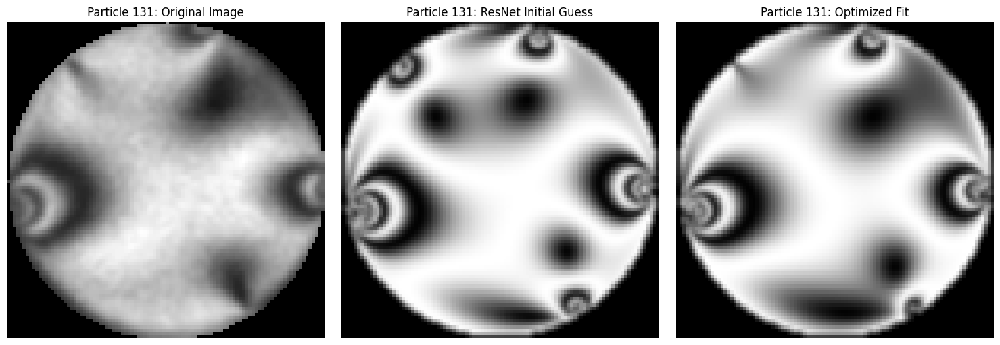

Particle id: 132, Contact number z=4
Initial forces: [0.25894437 0.84267848 0.23711969 0.79732847]
Initial alphas: [ 0.09713589 -0.05215235  0.00265437 -0.26637334]
Iter 0: loss=0.3952  image=0.0559  torque=0.2894  force=0.0499
Iter 10: loss=0.0593  image=0.0463  torque=0.0000  force=0.0129
Iter 20: loss=0.0533  image=0.0485  torque=0.0009  force=0.0039
Iter 30: loss=0.0489  image=0.0464  torque=0.0013  force=0.0012
Iter 40: loss=0.0477  image=0.0474  torque=0.0003  force=0.0001


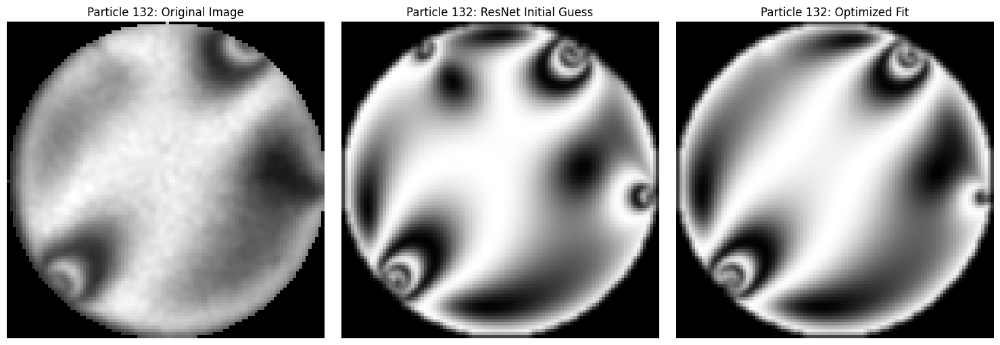

Particle id: 134, Contact number z=5
Initial forces: [0.62250988 0.28013467 0.27423631 0.3005667  0.3668252 ]
Initial alphas: [-0.0862539  -0.12080001 -0.01227572  0.01451213  0.01748115]
Iter 0: loss=0.2620  image=0.0809  torque=0.0356  force=0.1456
Iter 10: loss=0.0642  image=0.0595  torque=0.0004  force=0.0043
Iter 20: loss=0.0505  image=0.0441  torque=0.0014  force=0.0050
Iter 30: loss=0.0448  image=0.0438  torque=0.0000  force=0.0010


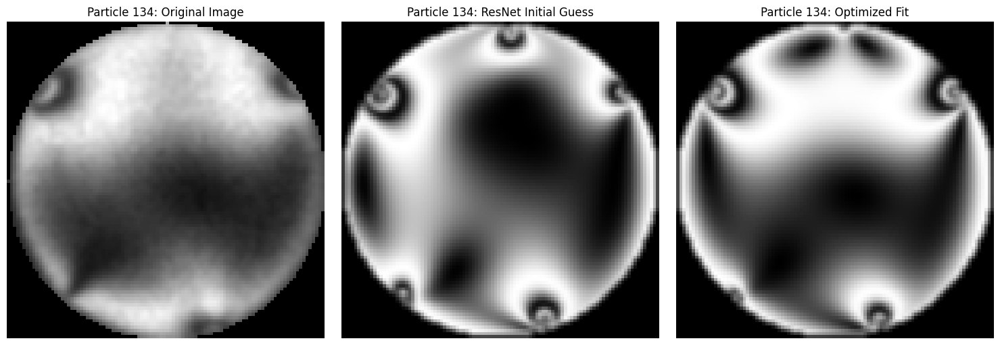

Particle id: 135, Contact number z=3
Initial forces: [0.25998355 0.23566816 0.33996795]
Initial alphas: [ 0.00566938  0.09251446 -0.01323093]
Iter 0: loss=0.0885  image=0.0503  torque=0.0020  force=0.0362
Iter 10: loss=0.0312  image=0.0289  torque=0.0003  force=0.0021
Iter 20: loss=0.0295  image=0.0291  torque=0.0001  force=0.0004
Iter 30: loss=0.0273  image=0.0270  torque=0.0000  force=0.0003


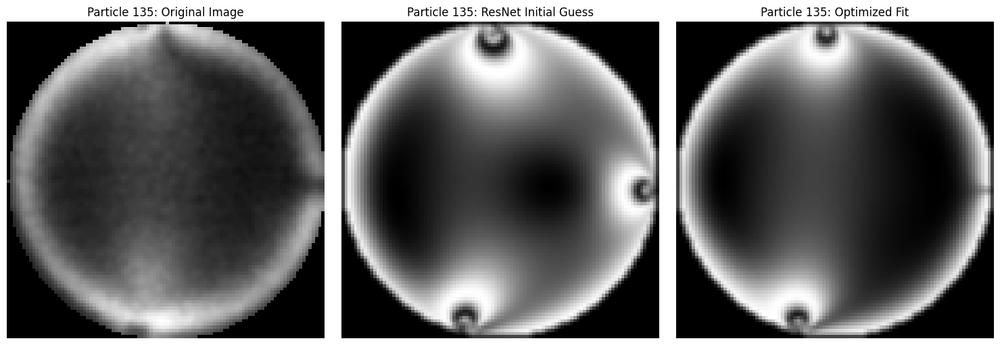

Particle id: 136, Contact number z=4
Initial forces: [1.50997725 0.30977139 0.84167218 0.83526807]
Initial alphas: [-0.08765301 -0.00622881  0.06159207 -0.20119408]
Iter 0: loss=0.4462  image=0.0553  torque=0.3456  force=0.0453
Iter 10: loss=0.1057  image=0.0461  torque=0.0124  force=0.0472
Iter 20: loss=0.0589  image=0.0438  torque=0.0015  force=0.0135
Iter 30: loss=0.0456  image=0.0402  torque=0.0032  force=0.0022
Iter 40: loss=0.0397  image=0.0386  torque=0.0003  force=0.0008


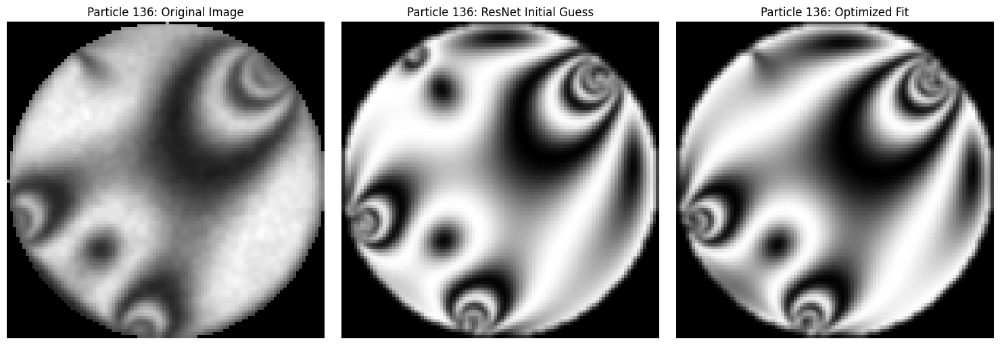

Particle id: 138, Contact number z=3
Initial forces: [0.32506263 0.21917907 0.30159559]
Initial alphas: [-0.00856664 -0.17975466  0.08551599]
Iter 0: loss=0.0862  image=0.0573  torque=0.0015  force=0.0274
Iter 10: loss=0.0496  image=0.0469  torque=0.0001  force=0.0026
Iter 20: loss=0.0484  image=0.0476  torque=0.0000  force=0.0007


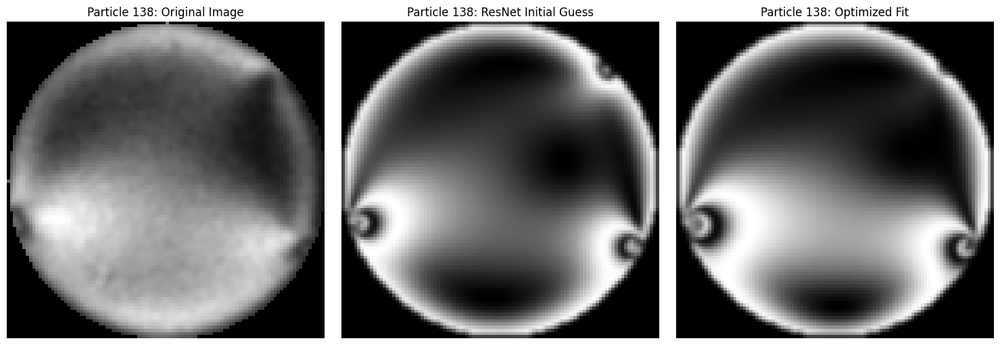

Particle id: 139, Contact number z=4
Initial forces: [0.4310272  0.31485107 0.36922628 0.25735332]
Initial alphas: [-0.06879862 -0.03368106  0.09421618 -0.05332853]
Iter 0: loss=0.0536  image=0.0488  torque=0.0021  force=0.0027
Iter 10: loss=0.0418  image=0.0389  torque=0.0006  force=0.0022
Iter 20: loss=0.0329  image=0.0327  torque=0.0001  force=0.0001


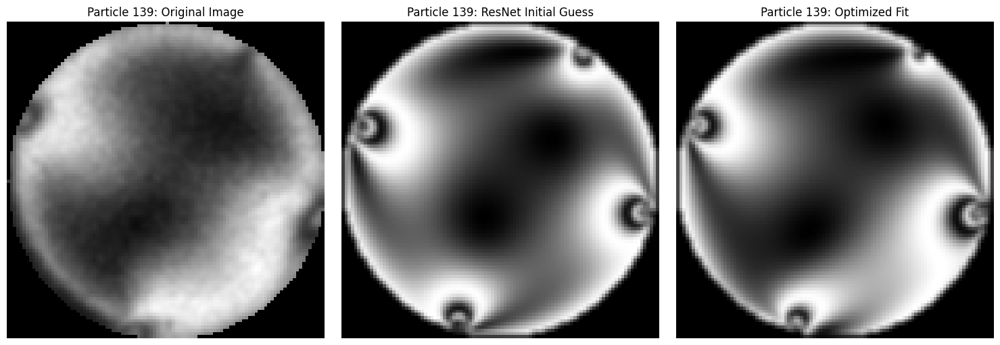

Particle id: 140, Contact number z=4
Initial forces: [0.27644473 0.34972951 0.99711463 0.78696427]
Initial alphas: [-0.20565124 -0.01080157 -0.00760742  0.02164057]
Iter 0: loss=0.0743  image=0.0569  torque=0.0144  force=0.0030
Iter 10: loss=0.0490  image=0.0453  torque=0.0011  force=0.0026
Iter 20: loss=0.0439  image=0.0435  torque=0.0003  force=0.0001


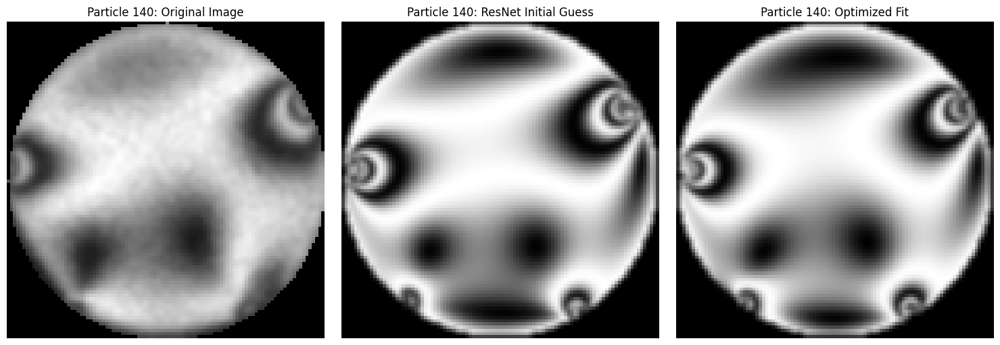

Particle id: 141, Contact number z=3
Initial forces: [0.57042139 0.20728673 0.54445446]
Initial alphas: [-0.0401589  -0.06175606 -0.03219785]
Iter 0: loss=0.1936  image=0.0635  torque=0.0158  force=0.1144
Iter 10: loss=0.0692  image=0.0684  torque=0.0003  force=0.0005
Iter 20: loss=0.0487  image=0.0484  torque=0.0000  force=0.0003


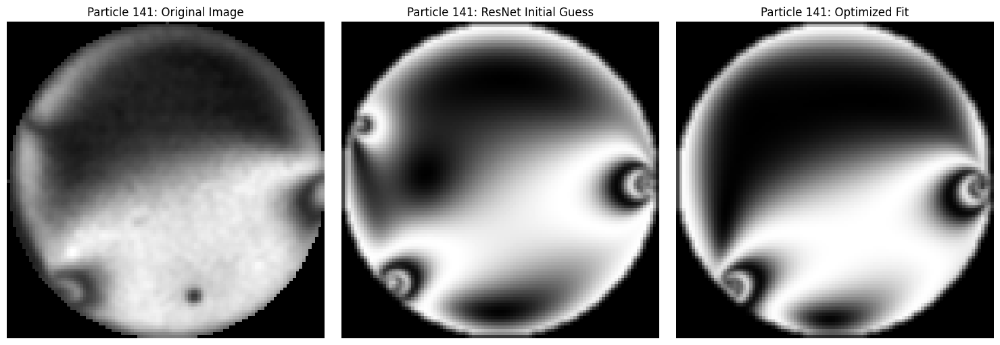

Particle id: 144, Contact number z=2
Initial forces: [0.41037619 0.38490286]
Initial alphas: [ 0.00941051 -0.03652852]
Iter 0: loss=0.1036  image=0.0815  torque=0.0006  force=0.0216
Iter 10: loss=0.0363  image=0.0351  torque=0.0003  force=0.0009


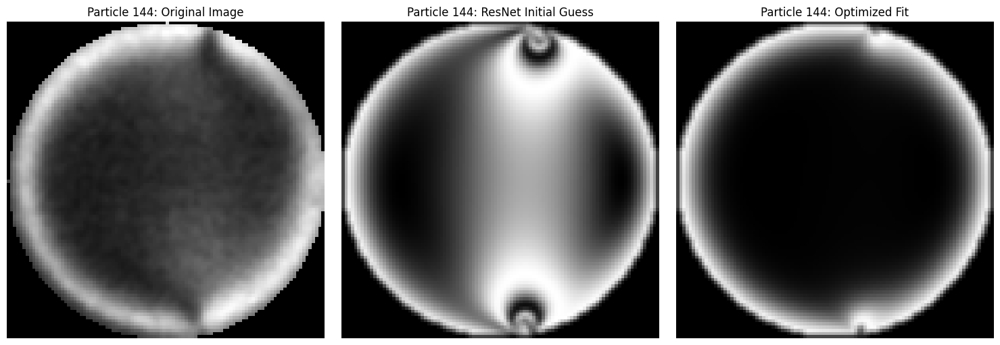

Particle id: 145, Contact number z=2
Initial forces: [0.44189687 0.27143719]
Initial alphas: [-0.00580921 -0.04082746]
Iter 0: loss=0.0840  image=0.0450  torque=0.0010  force=0.0381
Iter 10: loss=0.0409  image=0.0355  torque=0.0004  force=0.0049
Iter 20: loss=0.0390  image=0.0377  torque=0.0001  force=0.0013


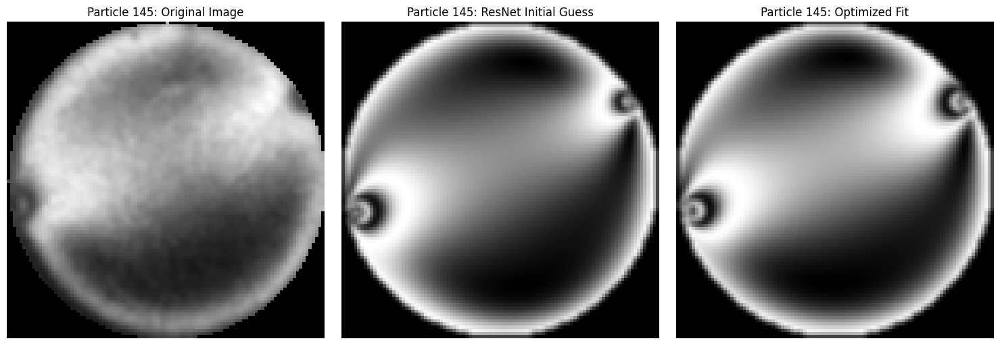

Particle id: 148, Contact number z=2
Initial forces: [0.28776768 0.33296403]
Initial alphas: [ 0.02975874 -0.03627905]
Iter 0: loss=0.0459  image=0.0374  torque=0.0001  force=0.0084
Iter 10: loss=0.0302  image=0.0295  torque=0.0000  force=0.0007
Iter 20: loss=0.0287  image=0.0286  torque=0.0000  force=0.0001


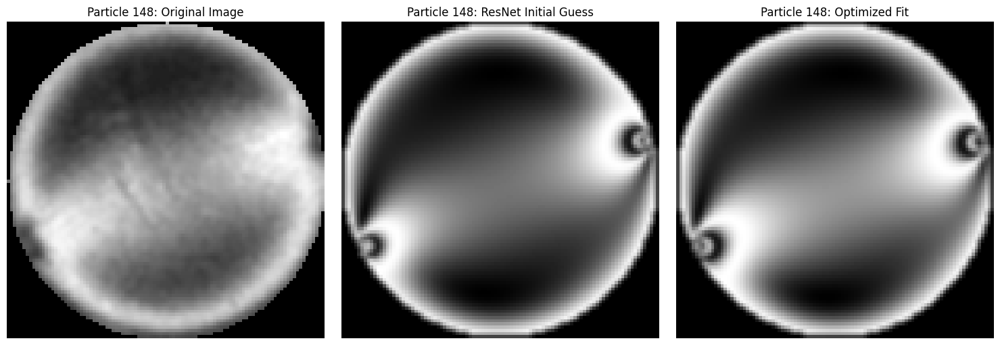

Particle id: 151, Contact number z=4
Initial forces: [0.27564477 0.36327903 0.22294092 0.23848992]
Initial alphas: [-0.12842986  0.24073985  0.14384453 -0.10297919]
Iter 0: loss=0.1021  image=0.0635  torque=0.0192  force=0.0194
Iter 10: loss=0.0438  image=0.0426  torque=0.0006  force=0.0007
Iter 20: loss=0.0428  image=0.0391  torque=0.0001  force=0.0037
Iter 30: loss=0.0363  image=0.0361  torque=0.0001  force=0.0001


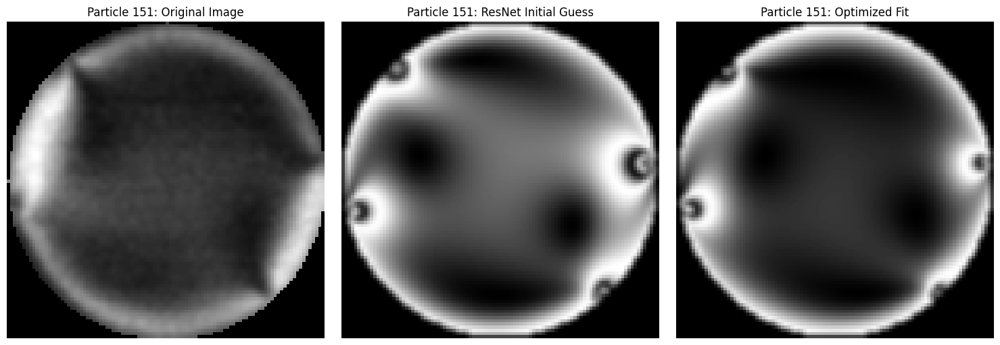

Particle id: 152, Contact number z=3
Initial forces: [0.39114139 0.72073066 0.2148661 ]
Initial alphas: [-0.0347884  -0.02427583 -0.00025552]
Iter 0: loss=0.1291  image=0.0339  torque=0.0054  force=0.0898
Iter 10: loss=0.0392  image=0.0303  torque=0.0026  force=0.0063
Iter 20: loss=0.0313  image=0.0268  torque=0.0003  force=0.0041
Iter 30: loss=0.0274  image=0.0259  torque=0.0001  force=0.0014


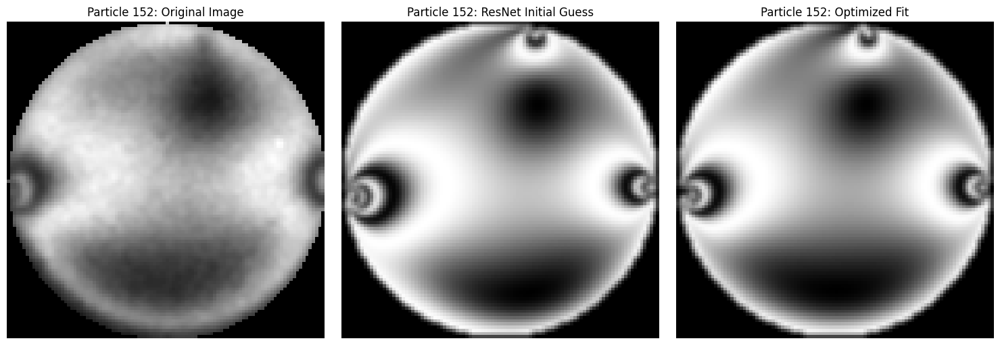

Particle id: 153, Contact number z=4
Initial forces: [0.26135513 0.29823416 0.30662756 0.27171403]
Initial alphas: [-0.13396615 -0.0081975   0.05136539 -0.01475375]
Iter 0: loss=0.0623  image=0.0447  torque=0.0037  force=0.0139
Iter 10: loss=0.0368  image=0.0344  torque=0.0006  force=0.0018


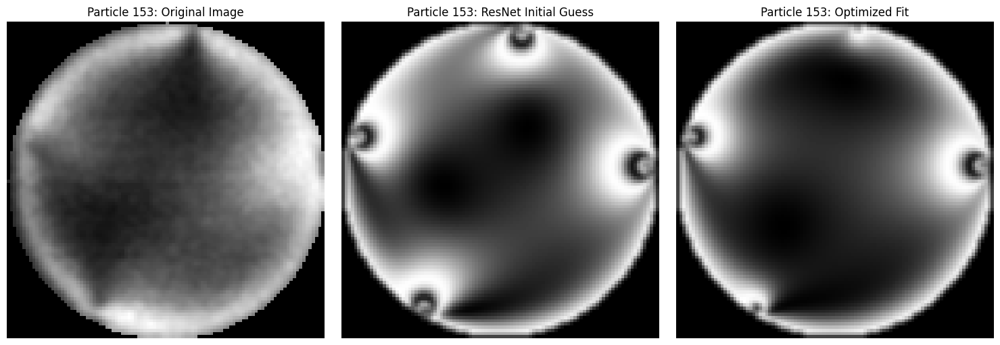

Particle id: 154, Contact number z=4
Initial forces: [0.23427576 0.31621724 0.34890836 0.37490909]
Initial alphas: [-0.22905606  0.01378473 -0.11475229  0.02618849]
Iter 0: loss=0.3050  image=0.0626  torque=0.0347  force=0.2076
Iter 10: loss=0.0679  image=0.0399  torque=0.0004  force=0.0276
Iter 20: loss=0.0452  image=0.0435  torque=0.0001  force=0.0016
Iter 30: loss=0.0338  image=0.0327  torque=0.0002  force=0.0009


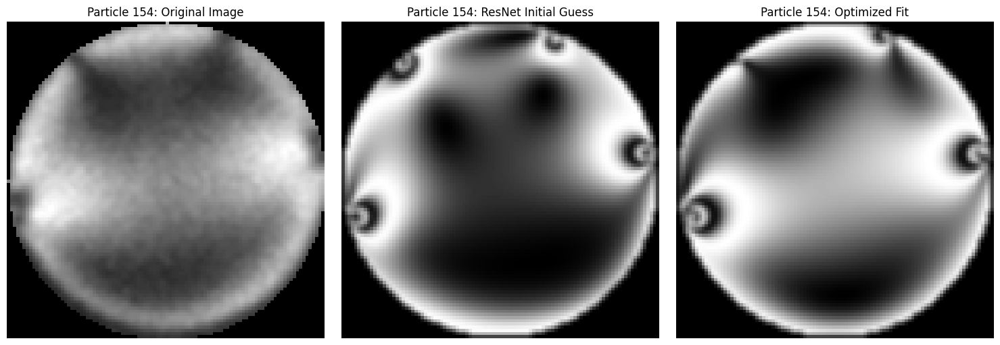

Particle id: 155, Contact number z=3
Initial forces: [0.27019973 0.3252986  0.22288456]
Initial alphas: [ 0.1508217  -0.12322042  0.02948597]
Iter 0: loss=0.0980  image=0.0459  torque=0.0003  force=0.0518
Iter 10: loss=0.0411  image=0.0367  torque=0.0005  force=0.0039
Iter 20: loss=0.0362  image=0.0358  torque=0.0001  force=0.0003


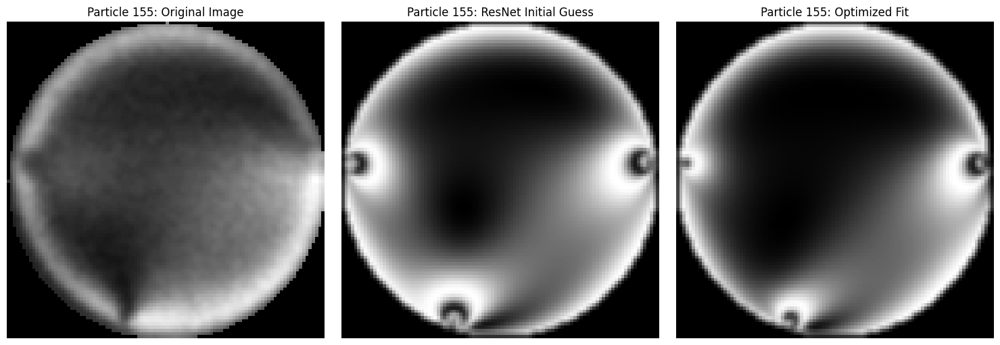

Particle id: 156, Contact number z=4
Initial forces: [0.38382293 0.98877375 0.25459803 1.08238435]
Initial alphas: [-0.11349567 -0.08796281 -0.08616894 -0.10484482]
Iter 0: loss=0.4933  image=0.0498  torque=0.3923  force=0.0512
Iter 10: loss=0.0570  image=0.0425  torque=0.0142  force=0.0003
Iter 20: loss=0.0590  image=0.0478  torque=0.0101  force=0.0010
Iter 30: loss=0.0495  image=0.0422  torque=0.0063  force=0.0010
Iter 40: loss=0.0410  image=0.0389  torque=0.0018  force=0.0003
Iter 50: loss=0.0376  image=0.0367  torque=0.0003  force=0.0006


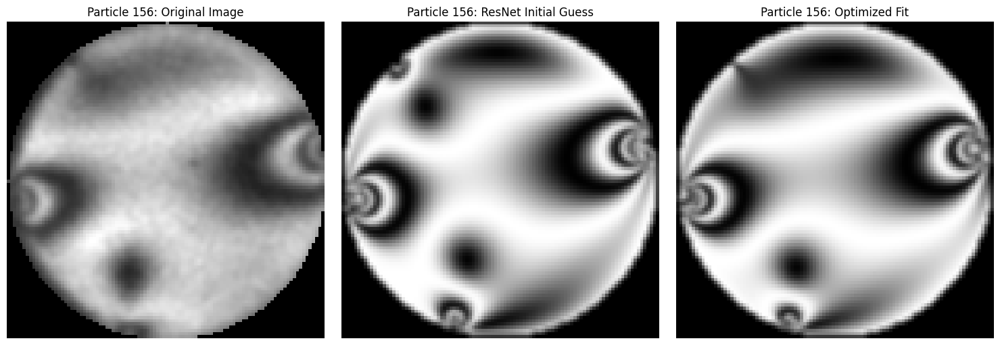

Particle id: 157, Contact number z=4
Initial forces: [0.63970664 0.45829561 0.25220035 0.84460902]
Initial alphas: [-0.10892387 -0.05059592 -0.02979579 -0.13585451]
Iter 0: loss=0.4215  image=0.0507  torque=0.2563  force=0.1144
Iter 10: loss=0.0660  image=0.0527  torque=0.0000  force=0.0134
Iter 20: loss=0.0480  image=0.0418  torque=0.0004  force=0.0057
Iter 30: loss=0.0410  image=0.0402  torque=0.0005  force=0.0003
Iter 40: loss=0.0359  image=0.0351  torque=0.0003  force=0.0005
Iter 50: loss=0.0318  image=0.0314  torque=0.0001  force=0.0003


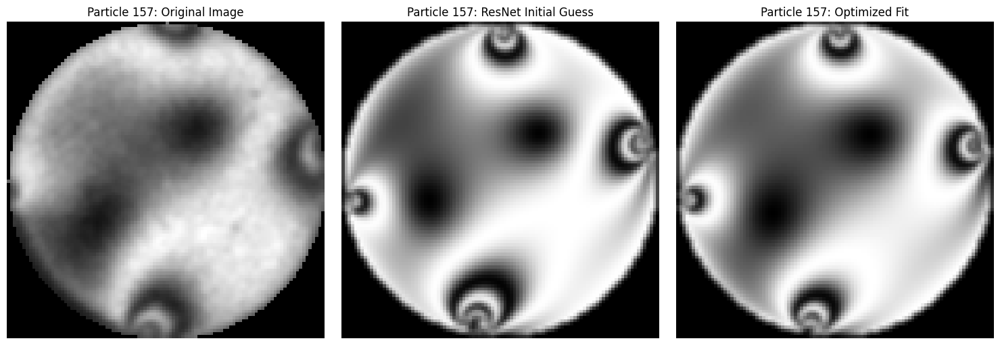

Particle id: 158, Contact number z=3
Initial forces: [0.52079022 0.45795697 0.90854652]
Initial alphas: [-0.00241626 -0.03241536 -0.11112887]
Iter 0: loss=0.2100  image=0.0613  torque=0.0760  force=0.0727
Iter 10: loss=0.0781  image=0.0667  torque=0.0064  force=0.0050
Iter 20: loss=0.0604  image=0.0533  torque=0.0019  force=0.0052
Iter 30: loss=0.0515  image=0.0494  torque=0.0001  force=0.0020
Iter 40: loss=0.0469  image=0.0463  torque=0.0001  force=0.0005


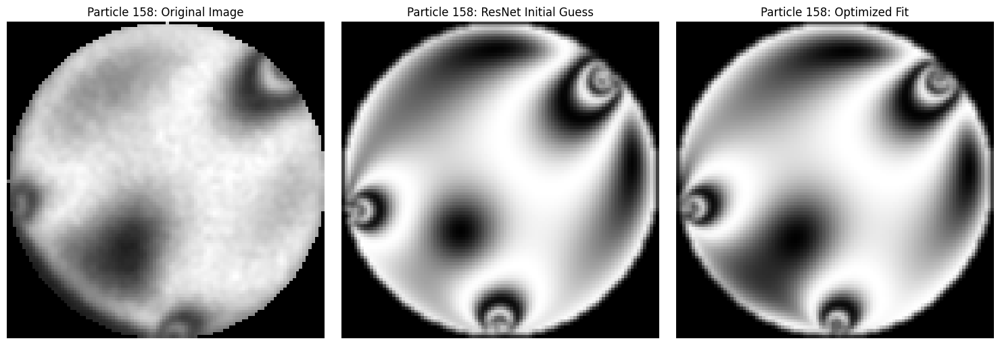

Particle id: 160, Contact number z=3
Initial forces: [0.82597661 0.6754936  0.53702867]
Initial alphas: [-0.27684873 -0.0034254  -0.05602152]
Iter 0: loss=0.5422  image=0.0456  torque=0.3708  force=0.1258
Iter 10: loss=0.0728  image=0.0473  torque=0.0140  force=0.0115
Iter 20: loss=0.0619  image=0.0518  torque=0.0002  force=0.0099
Iter 30: loss=0.0489  image=0.0483  torque=0.0000  force=0.0006
Iter 40: loss=0.0398  image=0.0394  torque=0.0000  force=0.0004


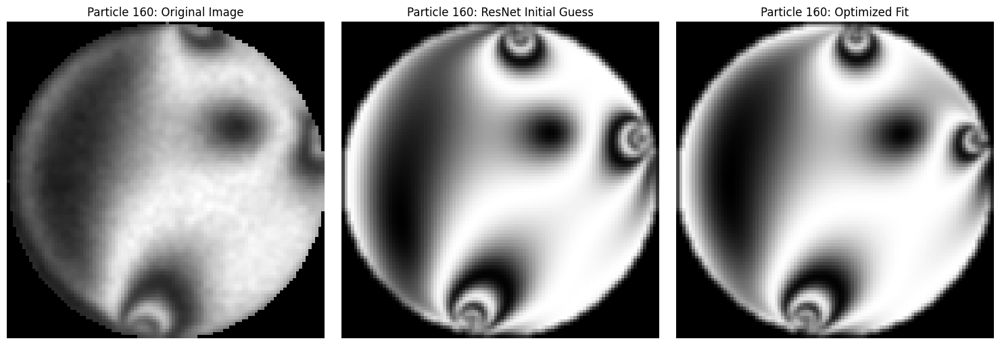

Particle id: 161, Contact number z=3
Initial forces: [0.31726391 0.22281207 0.25749636]
Initial alphas: [-0.09798201  0.08666202 -0.21590537]
Iter 0: loss=0.1258  image=0.0463  torque=0.0249  force=0.0546
Iter 10: loss=0.0426  image=0.0361  torque=0.0055  force=0.0010
Iter 20: loss=0.0298  image=0.0292  torque=0.0000  force=0.0006


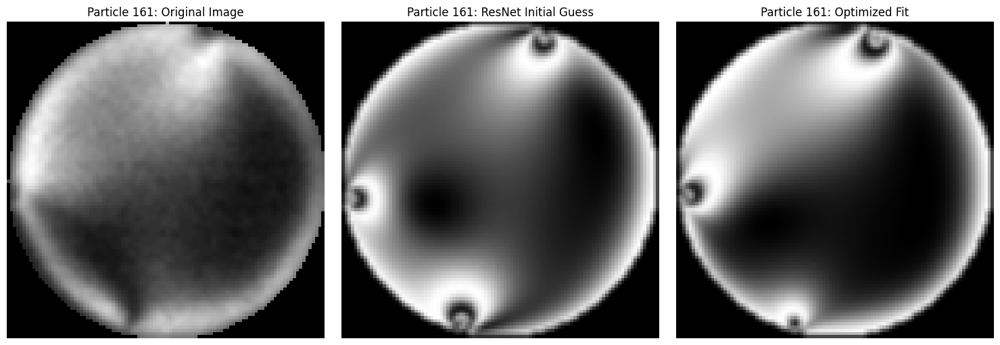

Particle id: 162, Contact number z=3
Initial forces: [0.2368037  0.66502104 0.68212466]
Initial alphas: [ 0.00041942  0.06485403 -0.10019364]
Iter 0: loss=0.1209  image=0.0426  torque=0.0035  force=0.0748
Iter 10: loss=0.0389  image=0.0386  torque=0.0002  force=0.0001
Iter 20: loss=0.0359  image=0.0356  torque=0.0000  force=0.0002


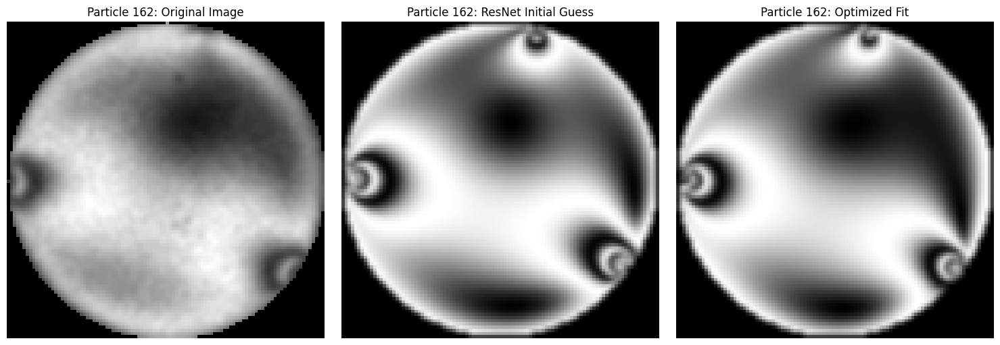

Particle id: 163, Contact number z=3
Initial forces: [0.56550751 0.31497184 0.50745993]
Initial alphas: [-0.15772548  0.01260128 -0.08643276]
Iter 0: loss=0.1856  image=0.0631  torque=0.0921  force=0.0304
Iter 10: loss=0.0720  image=0.0608  torque=0.0043  force=0.0068
Iter 20: loss=0.0464  image=0.0441  torque=0.0016  force=0.0007
Iter 30: loss=0.0404  image=0.0388  torque=0.0002  force=0.0014


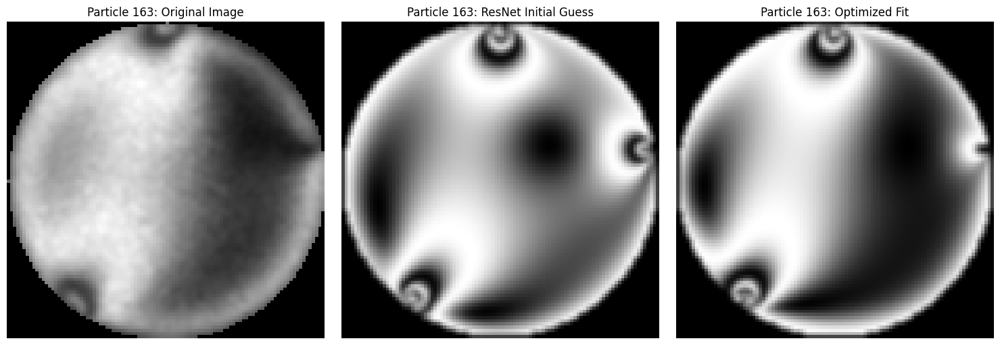

Particle id: 164, Contact number z=4
Initial forces: [0.65033505 0.41259785 0.19186628 0.31538025]
Initial alphas: [-0.08476274 -0.02141207  0.15567589  0.06604353]
Iter 0: loss=0.0750  image=0.0474  torque=0.0010  force=0.0266
Iter 10: loss=0.0247  image=0.0220  torque=0.0004  force=0.0022
Iter 20: loss=0.0200  image=0.0199  torque=0.0001  force=0.0001
Iter 30: loss=0.0189  image=0.0185  torque=0.0001  force=0.0003


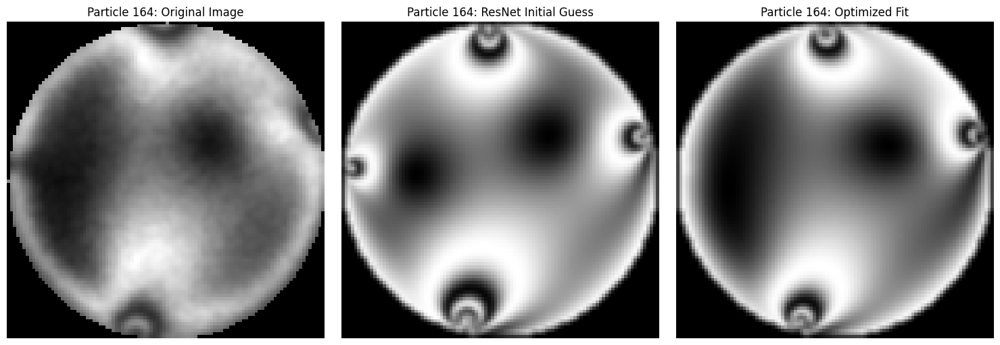

Particle id: 165, Contact number z=3
Initial forces: [1.22456932 0.6151783  0.9599458 ]
Initial alphas: [-0.05710473  0.02450067 -0.17086652]
Iter 0: loss=0.3228  image=0.0411  torque=0.2646  force=0.0172
Iter 10: loss=0.0600  image=0.0464  torque=0.0028  force=0.0108
Iter 20: loss=0.0537  image=0.0397  torque=0.0050  force=0.0089
Iter 30: loss=0.0406  image=0.0376  torque=0.0012  force=0.0018
Iter 40: loss=0.0375  image=0.0370  torque=0.0002  force=0.0002


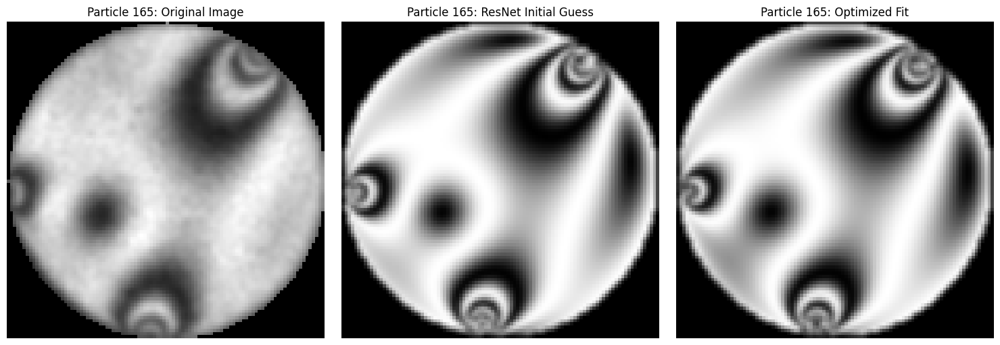

Particle id: 167, Contact number z=4
Initial forces: [0.61929445 0.30484082 0.57826216 0.5046293 ]
Initial alphas: [ 0.03582533 -0.04232393 -0.10354806 -0.07254738]
Iter 0: loss=0.0943  image=0.0457  torque=0.0422  force=0.0065
Iter 10: loss=0.0384  image=0.0313  torque=0.0064  force=0.0007
Iter 20: loss=0.0283  image=0.0265  torque=0.0015  force=0.0004


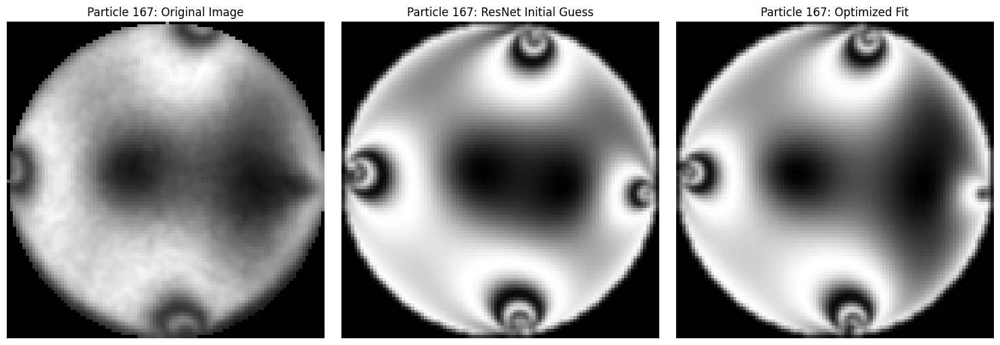

Particle id: 170, Contact number z=3
Initial forces: [0.21163886 0.41260393 0.22539913]
Initial alphas: [-0.20160416 -0.00264402  0.00333153]
Iter 0: loss=0.0890  image=0.0401  torque=0.0102  force=0.0388
Iter 10: loss=0.0460  image=0.0428  torque=0.0014  force=0.0019
Iter 20: loss=0.0352  image=0.0347  torque=0.0003  force=0.0002


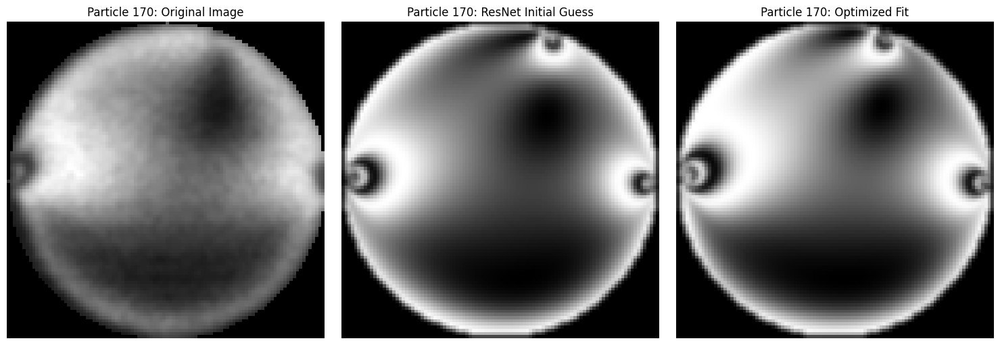

Particle id: 171, Contact number z=3
Initial forces: [0.5704947  0.27535572 0.45589614]
Initial alphas: [-0.2699562  -0.02542809 -0.04592467]
Iter 0: loss=0.3784  image=0.0581  torque=0.1804  force=0.1399
Iter 10: loss=0.0822  image=0.0697  torque=0.0001  force=0.0125
Iter 20: loss=0.0699  image=0.0672  torque=0.0010  force=0.0018
Iter 30: loss=0.0508  image=0.0488  torque=0.0000  force=0.0020
Iter 40: loss=0.0461  image=0.0458  torque=0.0004  force=0.0000


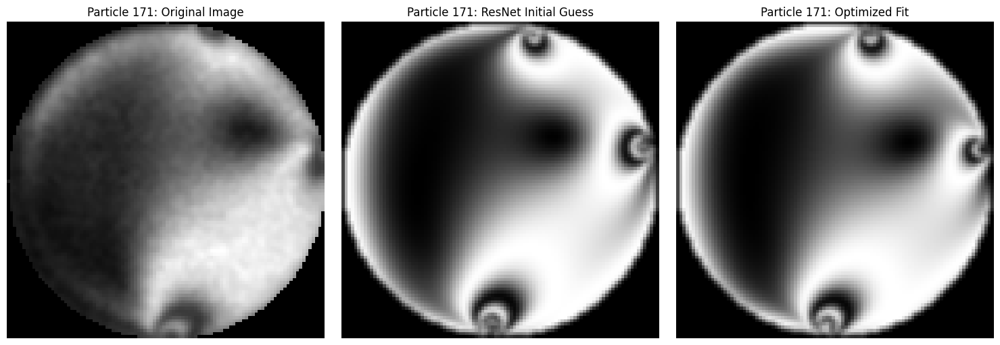

Particle id: 173, Contact number z=5
Initial forces: [0.35674446 1.02145972 0.46180573 0.26145685 0.84322779]
Initial alphas: [-0.05772841 -0.25150952 -0.04343458  0.03722388 -0.1813447 ]
Iter 0: loss=1.4457  image=0.0413  torque=1.0635  force=0.3409
Iter 10: loss=0.2384  image=0.0776  torque=0.1036  force=0.0573
Iter 20: loss=0.0674  image=0.0515  torque=0.0144  force=0.0015
Iter 30: loss=0.0704  image=0.0483  torque=0.0004  force=0.0217
Iter 40: loss=0.0569  image=0.0513  torque=0.0000  force=0.0056
Iter 50: loss=0.0485  image=0.0478  torque=0.0001  force=0.0006


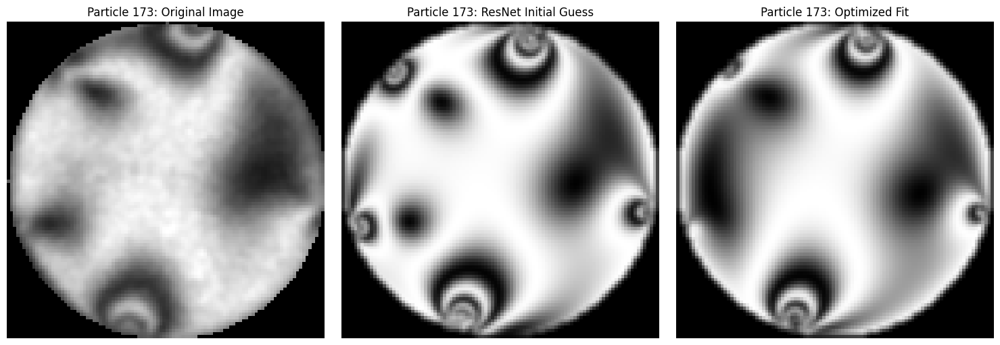

Particle id: 177, Contact number z=4
Initial forces: [0.30886095 0.78540173 0.28519399 0.86540616]
Initial alphas: [ 0.03577334 -0.13356604  0.06059662  0.12598087]
Iter 0: loss=0.0856  image=0.0476  torque=0.0059  force=0.0321
Iter 10: loss=0.0397  image=0.0310  torque=0.0005  force=0.0083
Iter 20: loss=0.0291  image=0.0282  torque=0.0000  force=0.0009


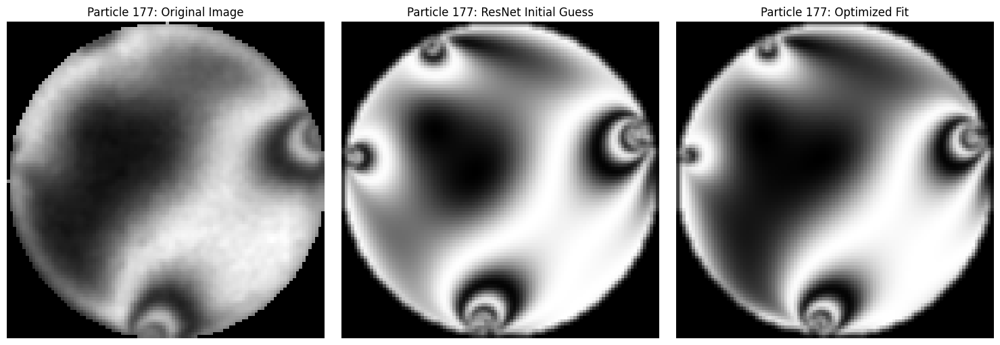

Particle id: 178, Contact number z=2
Initial forces: [0.36399772 0.31818742]
Initial alphas: [-0.11081513  0.07642121]
Iter 0: loss=0.1003  image=0.0620  torque=0.0014  force=0.0368
Iter 10: loss=0.0365  image=0.0362  torque=0.0000  force=0.0003


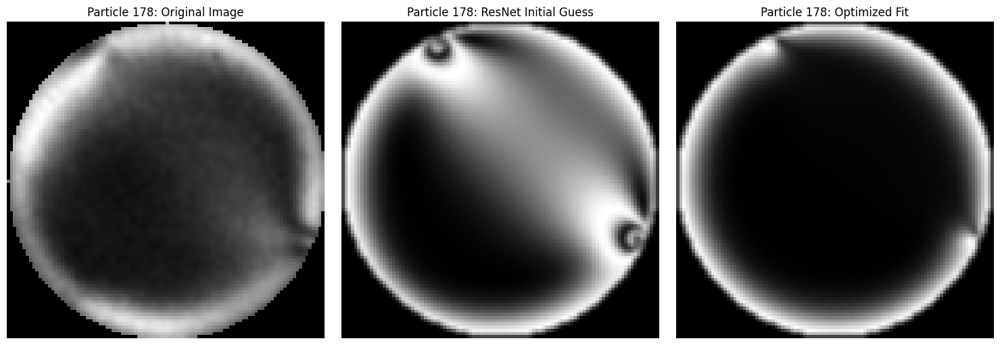

Particle id: 179, Contact number z=4
Initial forces: [0.22805607 0.2794014  0.38602624 0.40128407]
Initial alphas: [-0.26548278  0.03370771 -0.03403807 -0.11758954]
Iter 0: loss=0.2979  image=0.0815  torque=0.0681  force=0.1483
Iter 10: loss=0.0903  image=0.0749  torque=0.0019  force=0.0135
Iter 20: loss=0.0655  image=0.0585  torque=0.0001  force=0.0069
Iter 30: loss=0.0610  image=0.0592  torque=0.0008  force=0.0010


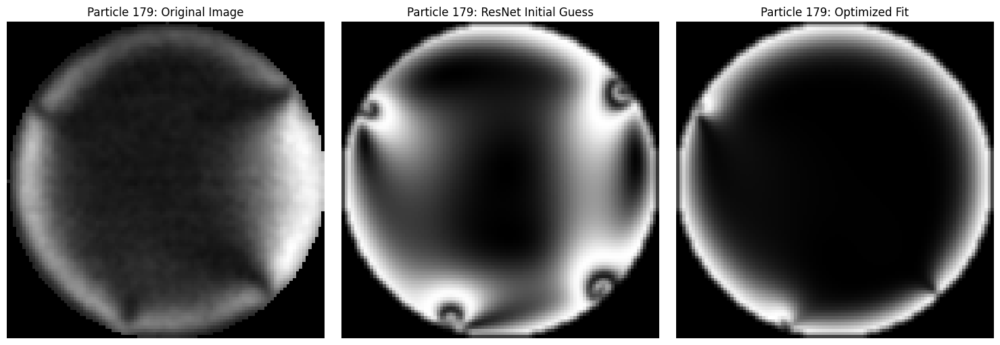

Particle id: 180, Contact number z=3
Initial forces: [0.28591697 0.33829401 0.343295  ]
Initial alphas: [ 0.04574114 -0.10590391  0.04205059]
Iter 0: loss=0.1117  image=0.0491  torque=0.0004  force=0.0622
Iter 10: loss=0.0377  image=0.0355  torque=0.0000  force=0.0022
Iter 20: loss=0.0344  image=0.0339  torque=0.0002  force=0.0002


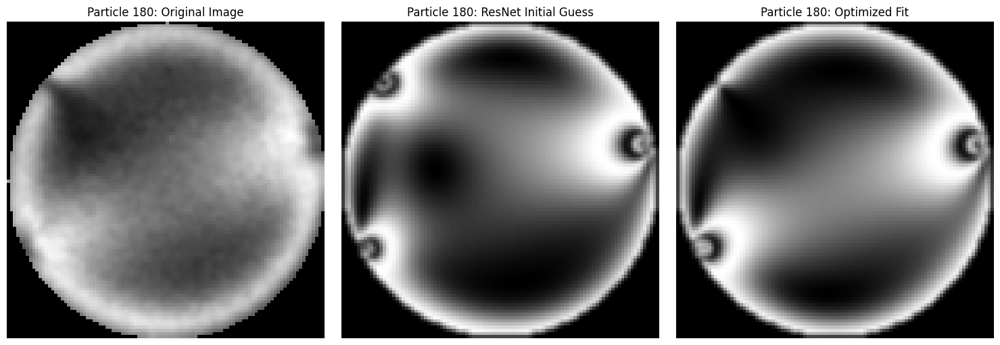

Particle id: 181, Contact number z=5
Initial forces: [0.22500329 0.23866378 0.31748314 0.27152606 0.235166  ]
Initial alphas: [ 0.00184393 -0.30186179  0.06320199 -0.12072235 -0.07711723]
Iter 0: loss=0.1522  image=0.0597  torque=0.0571  force=0.0354
Iter 10: loss=0.0313  image=0.0301  torque=0.0002  force=0.0010
Iter 20: loss=0.0327  image=0.0320  torque=0.0007  force=0.0000


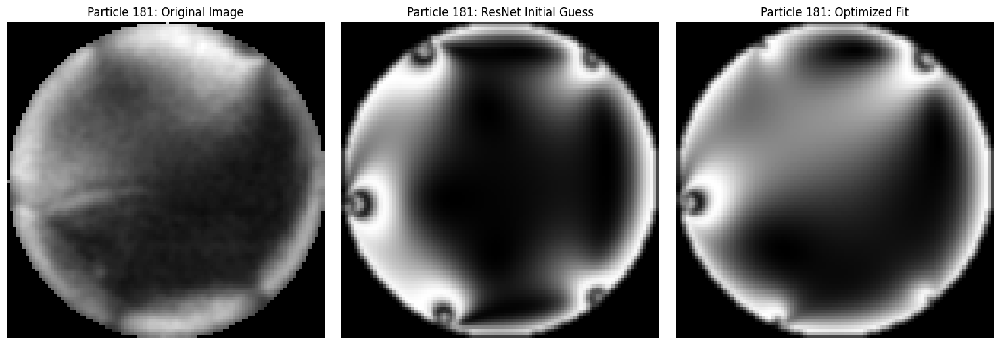

Particle id: 182, Contact number z=3
Initial forces: [0.27847626 0.32713891 0.30542378]
Initial alphas: [ 0.06275773 -0.15070984 -0.16021007]
Iter 0: loss=0.1321  image=0.0646  torque=0.0359  force=0.0315
Iter 10: loss=0.0447  image=0.0431  torque=0.0003  force=0.0013
Iter 20: loss=0.0449  image=0.0404  torque=0.0002  force=0.0043


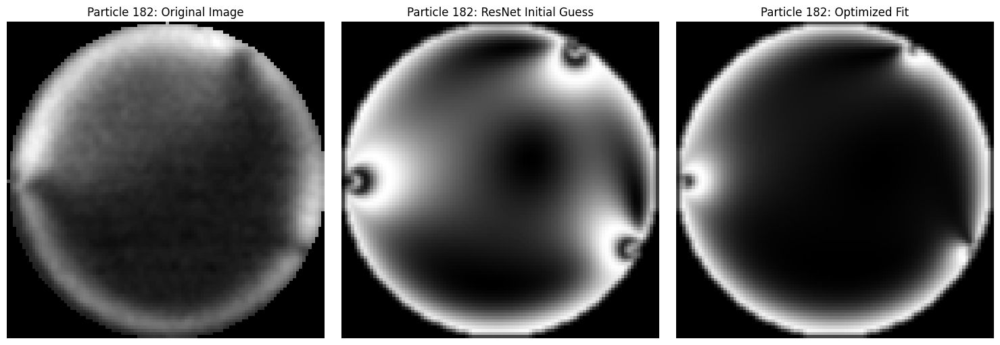

Particle id: 184, Contact number z=3
Initial forces: [0.27692081 0.32047405 0.30585072]
Initial alphas: [0.08497178 0.18147096 0.13291439]
Iter 0: loss=0.2269  image=0.0524  torque=0.0826  force=0.0919
Iter 10: loss=0.0692  image=0.0635  torque=0.0026  force=0.0031
Iter 20: loss=0.0534  image=0.0511  torque=0.0005  force=0.0018
Iter 30: loss=0.0529  image=0.0523  torque=0.0004  force=0.0002


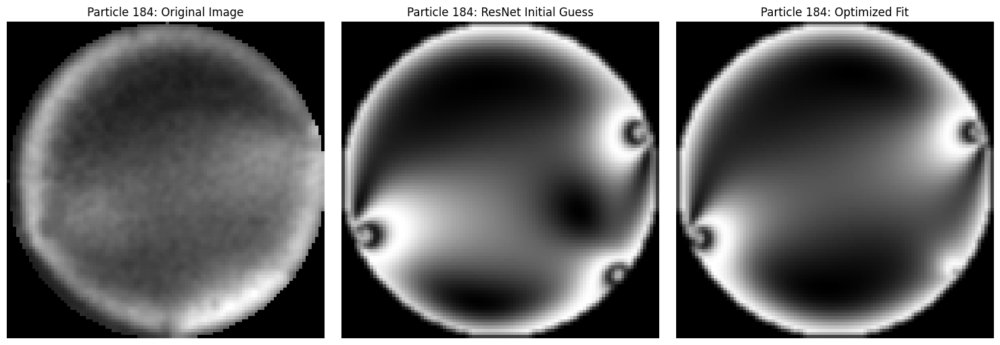

Particle id: 185, Contact number z=2
Initial forces: [0.73412676 0.74578178]
Initial alphas: [-0.24904901  0.11998499]
Iter 0: loss=0.1240  image=0.0408  torque=0.0468  force=0.0364
Iter 10: loss=0.0419  image=0.0412  torque=0.0004  force=0.0003
Iter 20: loss=0.0393  image=0.0362  torque=0.0002  force=0.0030
Iter 30: loss=0.0369  image=0.0358  torque=0.0001  force=0.0010


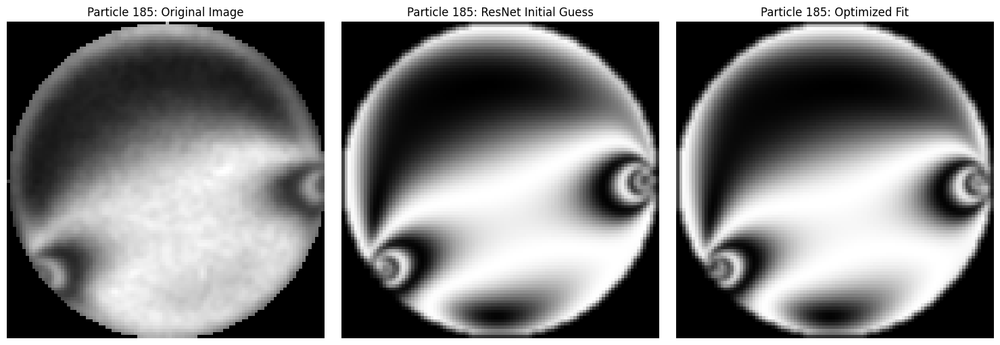

Particle id: 186, Contact number z=4
Initial forces: [0.37326812 0.29279634 0.33345251 0.24216748]
Initial alphas: [ 0.03556569 -0.09087189 -0.07210486 -0.09870251]
Iter 0: loss=0.1197  image=0.0843  torque=0.0208  force=0.0146
Iter 10: loss=0.0577  image=0.0552  torque=0.0003  force=0.0022
Iter 20: loss=0.0498  image=0.0496  torque=0.0000  force=0.0002


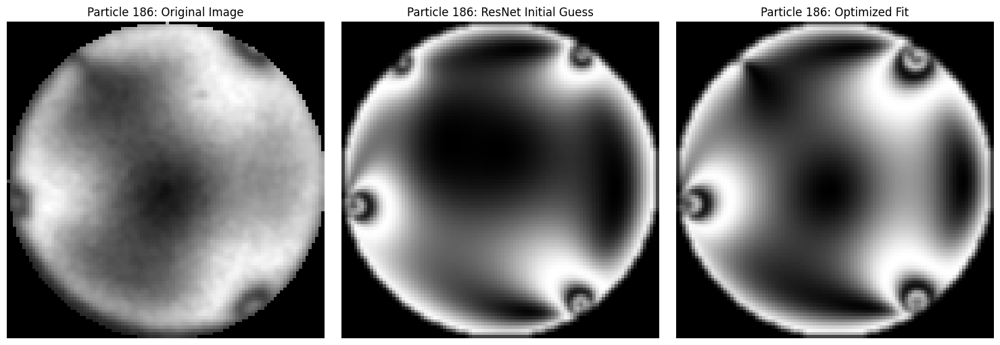

Particle id: 187, Contact number z=3
Initial forces: [0.49560363 0.38277855 0.62157655]
Initial alphas: [-0.17664666 -0.00929551  0.0223533 ]
Iter 0: loss=0.1850  image=0.0410  torque=0.0328  force=0.1112
Iter 10: loss=0.0556  image=0.0508  torque=0.0002  force=0.0047
Iter 20: loss=0.0444  image=0.0402  torque=0.0010  force=0.0032
Iter 30: loss=0.0387  image=0.0382  torque=0.0000  force=0.0005


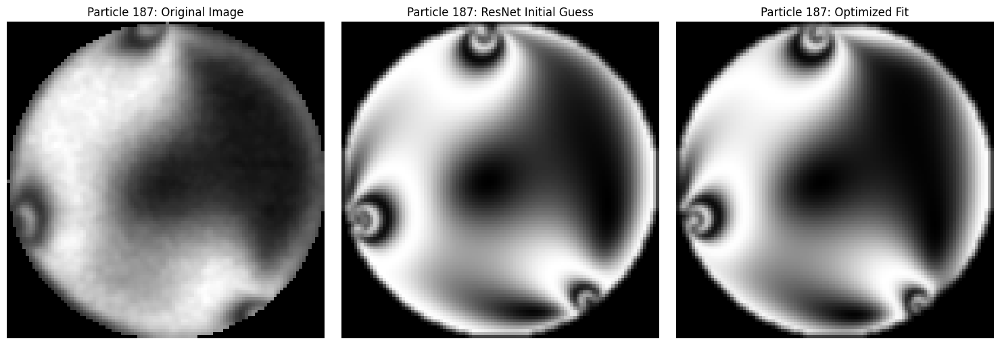

Frame 1 done | fitted=126/126 | failed=0 | time=122.62s

Processing complete! Results saved to: M:\Archive\Proj_TPE\Force Inversion\FORCE_FITTED_TEMP_TPE_20260807A01_N=262x2_stop_go_1e-3rpsx200s_stop1000s_1000framesx1fps_20reps.csv


In [4]:
############################## PATHS AND LOGISTICS ###################################

output_csv_path = os.path.join(OUT_DIR, f'FORCE_FITTED_TEMP_{EXP_NAME}.csv')

F_bond_pred = pd.read_pickle(os.path.join(OUT_DIR, f'PREDICTION_{EXP_NAME}.pkl'))
F_bond_pred = src.append_ij_angle_to_pdata(F_bond_pred)
F_bond_pred.force_pred = F_bond_pred.force_pred * 1.2

# Determine whether we should resume from existing CSV
all_frames = sorted(F_bond_pred['frame'].unique())
frames_to_process = all_frames

if os.path.exists(output_csv_path):
    try:
        existing = pd.read_csv(output_csv_path, usecols=['frame'])
        existing = existing.dropna(subset=['frame'])

        if len(existing) > 0:
            last_processed_frame = int(existing['frame'].max())
            frames_to_process = [f for f in all_frames if f > last_processed_frame]
            print(f"Resuming from existing CSV. Last processed frame: {last_processed_frame}")
            print(f"Frames remaining: {len(frames_to_process)}")
        else:
            print('Existing CSV is empty. Starting from first frame.')
    except Exception as e:
        print(f"Could not read existing CSV ({e}). Starting from first frame.")

if len(frames_to_process) == 0:
    print(f"No new frames to process. Existing results are up to date: {output_csv_path}")

########################## Main loop: process frames and fit particles in parallel on GPU ##########################
#for frame in frames_to_process:
for frame in [1]:
    frame_t0 = time.perf_counter()
    print(f"\rProcessing frame: {frame}", end='', flush=True)

    frame_data_out = []

    image_path = os.path.join(IMG_DIR, 'bw_' + str(frame) + '.png')
    img, img_err = src.read_image_with_retry(image_path, retries=4, delay_s=0.15)
    if img is None:
        print(f"\rFrame {frame} skipped | image read failed: {image_path} | reason: {img_err}")
        continue

    frame_data = F_bond_pred[F_bond_pred['frame'] == frame]
    particle_groups = [(pid, pdata) for pid, pdata in frame_data.groupby('i') if len(pdata) > 1]
    n_candidates = len(particle_groups)
    n_failed = 0

    if n_candidates == 0:
        frame_dt = time.perf_counter() - frame_t0
        print(f"\rFrame {frame} done | fitted=0/0 | failed=0 | time={frame_dt:.2f}s")
        continue

    if GPU_PARALLEL_WORKERS > 1:
        with cf.ThreadPoolExecutor(max_workers=GPU_PARALLEL_WORKERS) as ex:
            future_to_payload = {
                ex.submit(run_fit, pid, pdata, img, False): (pid, pdata)
                for pid, pdata in particle_groups
            }

            for fut in cf.as_completed(future_to_payload):
                pid, pdata = future_to_payload[fut]
                try:
                    res = fut.result()
                except Exception as e:
                    n_failed += 1
                    if verbose:
                        print(f"\nWorker failed at frame={frame}, particle={pid}: {e}")
                    try:
                        # Retry once in the main thread to reduce transient thread/CUDA failures.
                        res = run_fit(pid, pdata, img, False)
                    except Exception as e2:
                        if verbose:
                            print(f"\nRetry failed at frame={frame}, particle={pid}: {e2}")
                        res = None

                if res is not None:
                    frame_data_out.append(res)
    else:
        for pid, pdata in particle_groups:
            try:
                res = run_fit(pid, pdata, img, bool(plot_every))
            except Exception as e:
                n_failed += 1
                if verbose:
                    print(f"\nSequential fit failed at frame={frame}, particle={pid}: {e}")
                res = None
            if res is not None:
                particle_id, pdata_out, images = res
                frame_data_out.append((particle_id, pdata_out))
                if plot_every:
                    src.plot_fit_results(
                        particle_id,
                        images['gray_img'],
                        images['guess_im'],
                        images['fit_im']
                    )

    n_fitted = len(frame_data_out)

    if frame_data_out:
        frame_data_out.sort(key=lambda x: x[0])
        frame_results = pd.concat([x[1] for x in frame_data_out], ignore_index=True)

        write_header = (not os.path.exists(output_csv_path)) or os.path.getsize(output_csv_path) == 0
        frame_results.to_csv(output_csv_path, mode='a', header=write_header, index=False)

    frame_dt = time.perf_counter() - frame_t0
    print(f"\rFrame {frame} done | fitted={n_fitted}/{n_candidates} | failed={n_failed} | time={frame_dt:.2f}s")

print(f"\nProcessing complete! Results saved to: {output_csv_path}")

### Calculate ij/ji force difference, make all f and alpha equal to the one with smaller fitLoss

Total contacts: 1562438
Contacts with reciprocal pairs corrected: 704349
Contacts without reciprocal pairs (unchanged): 858089


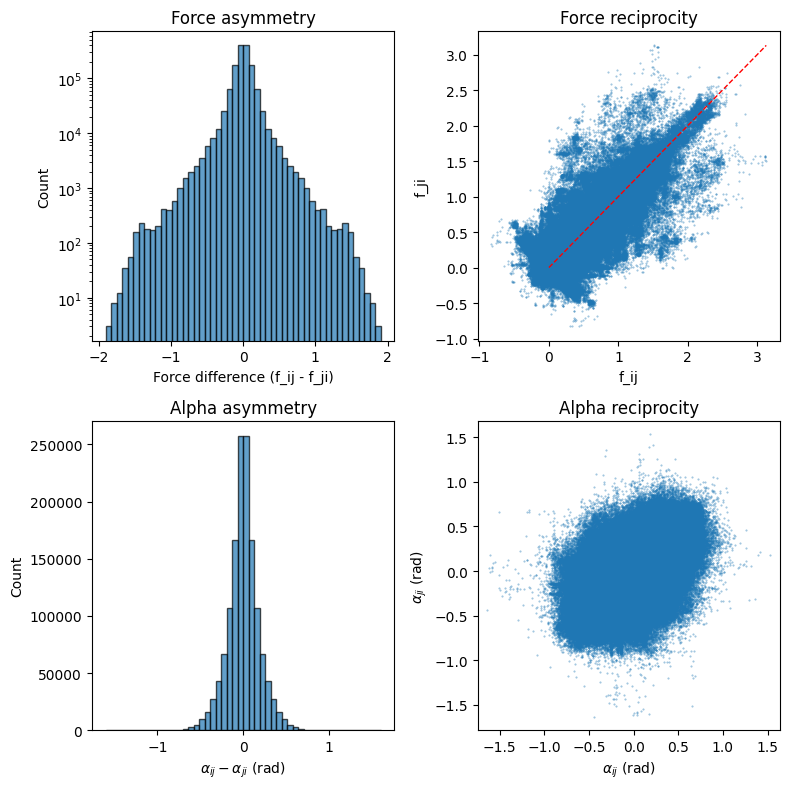

In [5]:
# Load fitted results, run reciprocity analysis + symmetrization, then plot ij/ji diagnostics
F_bond_out = pd.read_csv(os.path.join(OUT_DIR, f'FORCE_FITTED_TEMP_{EXP_NAME}.csv'))

F_compare, F_bond_corrected, correction_stats = src.symmetrize_forces(F_bond_out)

print(f"Total contacts: {correction_stats['total_contacts']}")
print(f"Contacts with reciprocal pairs corrected: {correction_stats['reciprocal_pairs']}")
print(f"Contacts without reciprocal pairs (unchanged): {correction_stats['contacts_unchanged']}")

fig = plt.figure(figsize=(8, 8))

# Force difference histogram
plt.subplot(2, 2, 1)
plt.hist(F_compare['force_diff'], bins=50, edgecolor='k', alpha=0.7)
plt.xlabel('Force difference (f_ij - f_ji)')
plt.ylabel('Count')
plt.yscale('log')
plt.title('Force asymmetry')

# Force reciprocity scatter
plt.subplot(2, 2, 2)
plt.scatter(F_compare['force'], F_compare['force_ji'], s=0.2, alpha=0.5)
plt.plot([0, F_compare['force'].max()], [0, F_compare['force'].max()], 'r--', lw=1)
plt.xlabel('f_ij')
plt.ylabel('f_ji')
plt.title('Force reciprocity')

# Alpha difference histogram
plt.subplot(2, 2, 3)
plt.hist(F_compare['alpha_diff_norm'], bins=50, edgecolor='k', alpha=0.7)
plt.xlabel(r'$\alpha_{ij} - \alpha_{ji}$ (rad)')
plt.ylabel('Count')
plt.title('Alpha asymmetry')

# Alpha reciprocity scatter
plt.subplot(2, 2, 4)
plt.scatter(F_compare['alpha'], F_compare['alpha_ji'], s=0.2, alpha=0.5)
plt.xlabel(r'$\alpha_{ij}$ (rad)')
plt.ylabel(r'$\alpha_{ji}$ (rad)')
plt.title('Alpha reciprocity')
plt.axis('equal')

plt.tight_layout()
plt.show()


### Check results by drawing full-field synth img from fitted resuls

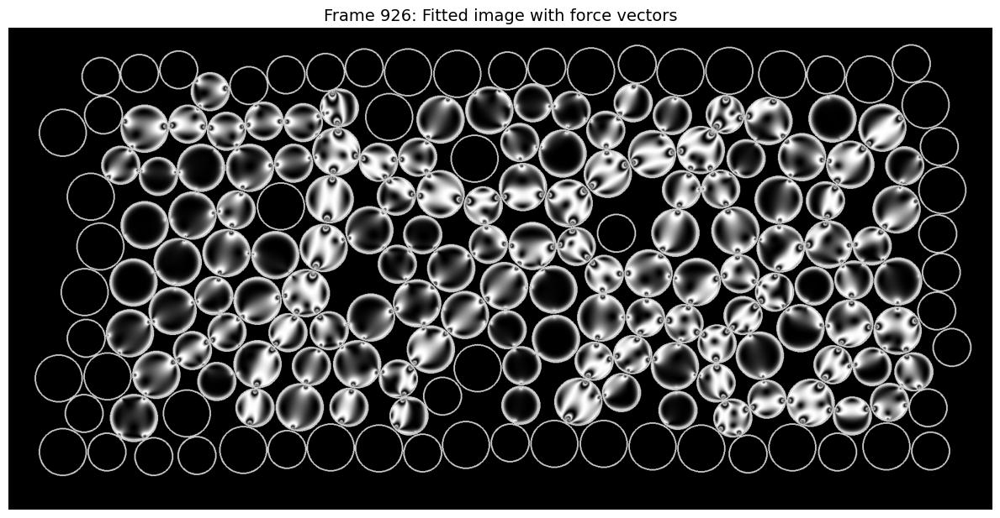

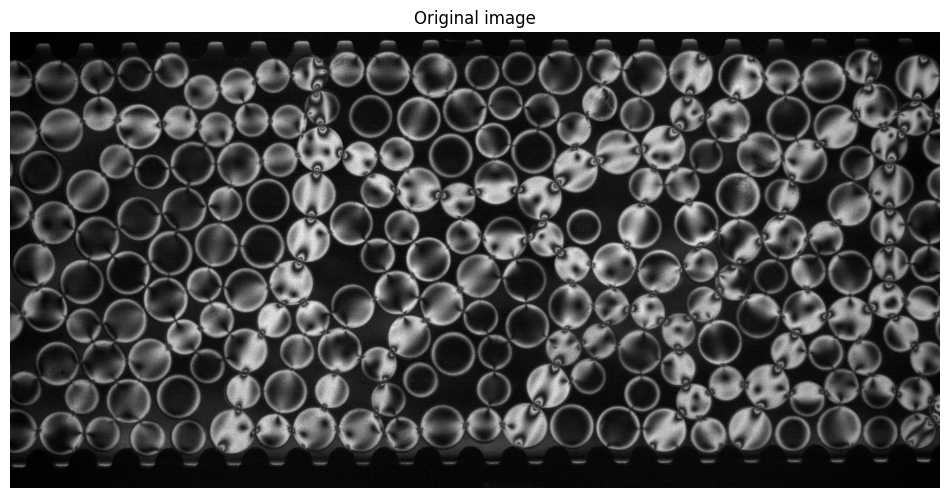

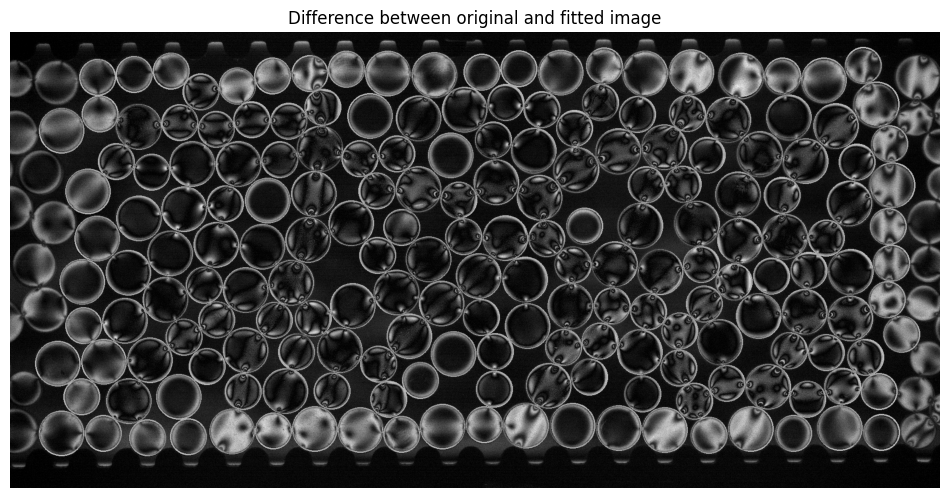

In [ ]:
frame = np.random.choice(F_bond_corrected['frame'].unique())
f = F_bond_corrected[F_bond_corrected.frame==frame].copy()

# Load the original PE image
image_path = os.path.join(IMG_DIR, 'bw_'+str(frame)+'.png')
orig_img = cv2.imread(image_path)
orig_img = orig_img[250:1200, :]  # Apply the same crop as in get_img_and_force

# Build synthesized field from fitted contacts
output_img = src.build_particle_synth_output_img(f, orig_img, fsigma=225, device=DEVICE)

# Plot empty circles for disks without contacts
all_particle = F_traj[F_traj.frame==frame]

for _, row in all_particle.iterrows():
    cx = int(round(float(row.x)))
    cy = int(round(float(row.y)))
    center = (cx, cy)
    radius = int(round(float(row.rpx)))

    h_out, w_out = output_img.shape[:2]
    if radius <= 0 or cx < 0 or cy < 0 or cx >= w_out or cy >= h_out:
        continue

    color = 0.8
    thickness = 2

    if output_img.ndim == 3 and output_img.shape[2] == 3:
        cv2.circle(output_img, center, radius, (color, color, color), thickness)
    else:
        cv2.circle(output_img, center, radius, color, thickness)

final_img = output_img

orig_img = orig_img/orig_img.max()
diff_img = cv2.absdiff((orig_img).astype(np.float32), final_img.astype(np.float32))

# Plot 1: All fitted balls overlaid with force vectors
fig, ax = plt.subplots(figsize=(12, 12))
ax.imshow(final_img.astype(np.float32), cmap='gray')
ax.set_xlim(0, final_img.shape[1])
ax.set_ylim(final_img.shape[0], 0)
ax.axis('off')
ax.set_title(f'Frame {frame}: Fitted image with force vectors', fontsize=14)
plt.tight_layout()
plt.show()

# Plot 2: Original image
plt.figure(figsize=(12, 12))
plt.imshow((orig_img).astype(np.float32), cmap='gray')
plt.title('Original image')
plt.axis('off')
plt.show()

# Plot 3: Difference between original and fitted
plt.figure(figsize=(12, 12))
plt.imshow(diff_img, cmap='gray')
plt.title('Difference between original and fitted image')
plt.axis('off')
plt.show()


### Save to disk

In [7]:
# Optional: Convert CSV to pickle for faster loading in future analyses
out_filename = os.path.join(OUT_DIR, EXP_NAME + '_Force_ResNet.pkl')
F_bond_corrected.to_pickle(out_filename)
print(f"Saved final corrected results to: {out_filename}")

Saved final corrected results to: M:\Archive\Proj_TPE\Force Inversion\TPE_20260521A01_N=262x2_relax_reset_e-3rpsx50s_stop1000s_200framesx1fps_20reps_Force_ResNet.pkl
